# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
torch.cuda.is_available()

False

In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "biolord_afriat.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata

AnnData object with n_obs × n_vars = 19053 × 5000
    obs: 'mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'

In [6]:
asdp_1 = adata.X.sum()

In [7]:
ratio_true=0.996

from tardis._utils.functions import create_random_mask
mask = create_random_mask(adata.shape[1], ratio_true=ratio_true, seed=2024)
adata.X[:, mask] = 0.0

In [8]:
asdp_2 = adata.X.sum()

In [9]:
mask.sum()/adata.shape[1],  1-asdp_2/asdp_1

(0.9968, 0.9948100429028273)

In [10]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|status_control",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|zone",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|time_cat",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|mouse",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [11]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "status_control",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "time_cat",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "zone",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [12]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['zone', 'status_control', 'time_cat', 'mouse']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    f"afriat_v2_4_ablation_{ratio_true}"
)

vae.save(
    dir_path,
    overwrite=True,
)

/home/icb/kemal.inecik/work/codes/tardis/tardis/_mymodel.py:81: UserWarning: This dataset has some empty cells, this might fail inference.Data should be filtered with `scanpy.pp.filter_cells()`
  library_log_means, library_log_vars = _init_library_size(self.adata_manager, n_batch)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: 2o3d1ld0
Name: rogue-force-141
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/2o3d1ld0
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240504_155912-2o3d1ld0/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `training` set. Number of elements in each group: 2557,3256,9430
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `training` set. Number of elements in each group: 2557,2576,1705,3411,1622,3372
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `training` set. Number of elements in each group: 4454,10789
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `validation` set. Number of elements in each group: 648,853,2309
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `validation` set. Number of elements in each group: 648,626,403,879,427,827
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `validation` set. Number of elements in each group: 1130,2680
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:14<2:27:44, 14.80s/it]

Epoch 1/600:   0%|          | 1/600 [00:14<2:27:44, 14.80s/it, v_num=d0_1, total_loss_train=43.3, kl_local_train=35.2]

Epoch 2/600:   0%|          | 1/600 [00:14<2:27:44, 14.80s/it, v_num=d0_1, total_loss_train=43.3, kl_local_train=35.2]

Epoch 2/600:   0%|          | 2/600 [00:28<2:20:27, 14.09s/it, v_num=d0_1, total_loss_train=43.3, kl_local_train=35.2]

Epoch 2/600:   0%|          | 2/600 [00:28<2:20:27, 14.09s/it, v_num=d0_1, total_loss_train=18.1, kl_local_train=57.7]

Epoch 3/600:   0%|          | 2/600 [00:28<2:20:27, 14.09s/it, v_num=d0_1, total_loss_train=18.1, kl_local_train=57.7]

Epoch 3/600:   0%|          | 3/600 [00:42<2:19:15, 14.00s/it, v_num=d0_1, total_loss_train=18.1, kl_local_train=57.7]

Epoch 3/600:   0%|          | 3/600 [00:42<2:19:15, 14.00s/it, v_num=d0_1, total_loss_train=14.3, kl_local_train=53.7]

Epoch 4/600:   0%|          | 3/600 [00:42<2:19:15, 14.00s/it, v_num=d0_1, total_loss_train=14.3, kl_local_train=53.7]

Epoch 4/600:   1%|          | 4/600 [00:55<2:17:52, 13.88s/it, v_num=d0_1, total_loss_train=14.3, kl_local_train=53.7]

Epoch 4/600:   1%|          | 4/600 [00:55<2:17:52, 13.88s/it, v_num=d0_1, total_loss_train=13.4, kl_local_train=38.2]

Epoch 5/600:   1%|          | 4/600 [00:55<2:17:52, 13.88s/it, v_num=d0_1, total_loss_train=13.4, kl_local_train=38.2]

Epoch 5/600:   1%|          | 5/600 [01:09<2:17:28, 13.86s/it, v_num=d0_1, total_loss_train=13.4, kl_local_train=38.2]

Epoch 5/600:   1%|          | 5/600 [01:09<2:17:28, 13.86s/it, v_num=d0_1, total_loss_train=13, kl_local_train=21.1]  

Epoch 6/600:   1%|          | 5/600 [01:11<2:17:28, 13.86s/it, v_num=d0_1, total_loss_train=13, kl_local_train=21.1]

Epoch 6/600:   1%|          | 6/600 [01:24<2:18:53, 14.03s/it, v_num=d0_1, total_loss_train=13, kl_local_train=21.1]

Epoch 6/600:   1%|          | 6/600 [01:24<2:18:53, 14.03s/it, v_num=d0_1, total_loss_train=12.8, kl_local_train=11.8, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.0086, metric_mi|time_cat_train=0.0144, metric_mi|mouse_train=0.0365]

Epoch 7/600:   1%|          | 6/600 [01:24<2:18:53, 14.03s/it, v_num=d0_1, total_loss_train=12.8, kl_local_train=11.8, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.0086, metric_mi|time_cat_train=0.0144, metric_mi|mouse_train=0.0365]

Epoch 7/600:   1%|          | 7/600 [01:37<2:15:29, 13.71s/it, v_num=d0_1, total_loss_train=12.8, kl_local_train=11.8, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.0086, metric_mi|time_cat_train=0.0144, metric_mi|mouse_train=0.0365]

Epoch 7/600:   1%|          | 7/600 [01:37<2:15:29, 13.71s/it, v_num=d0_1, total_loss_train=12.5, kl_local_train=10.1, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.0086, metric_mi|time_cat_train=0.0144, metric_mi|mouse_train=0.0365]

Epoch 8/600:   1%|          | 7/600 [01:37<2:15:29, 13.71s/it, v_num=d0_1, total_loss_train=12.5, kl_local_train=10.1, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.0086, metric_mi|time_cat_train=0.0144, metric_mi|mouse_train=0.0365]

Epoch 8/600:   1%|▏         | 8/600 [01:50<2:12:56, 13.47s/it, v_num=d0_1, total_loss_train=12.5, kl_local_train=10.1, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.0086, metric_mi|time_cat_train=0.0144, metric_mi|mouse_train=0.0365]

Epoch 8/600:   1%|▏         | 8/600 [01:50<2:12:56, 13.47s/it, v_num=d0_1, total_loss_train=20.1, kl_local_train=11.2, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.0086, metric_mi|time_cat_train=0.0144, metric_mi|mouse_train=0.0365]

Epoch 9/600:   1%|▏         | 8/600 [01:50<2:12:56, 13.47s/it, v_num=d0_1, total_loss_train=20.1, kl_local_train=11.2, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.0086, metric_mi|time_cat_train=0.0144, metric_mi|mouse_train=0.0365]

Epoch 9/600:   2%|▏         | 9/600 [02:03<2:10:58, 13.30s/it, v_num=d0_1, total_loss_train=20.1, kl_local_train=11.2, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.0086, metric_mi|time_cat_train=0.0144, metric_mi|mouse_train=0.0365]

Epoch 9/600:   2%|▏         | 9/600 [02:03<2:10:58, 13.30s/it, v_num=d0_1, total_loss_train=27.3, kl_local_train=23.1, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.0086, metric_mi|time_cat_train=0.0144, metric_mi|mouse_train=0.0365]

Epoch 10/600:   2%|▏         | 9/600 [02:03<2:10:58, 13.30s/it, v_num=d0_1, total_loss_train=27.3, kl_local_train=23.1, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.0086, metric_mi|time_cat_train=0.0144, metric_mi|mouse_train=0.0365]

Epoch 10/600:   2%|▏         | 10/600 [02:16<2:09:58, 13.22s/it, v_num=d0_1, total_loss_train=27.3, kl_local_train=23.1, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.0086, metric_mi|time_cat_train=0.0144, metric_mi|mouse_train=0.0365]

Epoch 10/600:   2%|▏         | 10/600 [02:16<2:09:58, 13.22s/it, v_num=d0_1, total_loss_train=31.1, kl_local_train=63.5, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.0086, metric_mi|time_cat_train=0.0144, metric_mi|mouse_train=0.0365]

Epoch 11/600:   2%|▏         | 10/600 [02:17<2:09:58, 13.22s/it, v_num=d0_1, total_loss_train=31.1, kl_local_train=63.5, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.0086, metric_mi|time_cat_train=0.0144, metric_mi|mouse_train=0.0365]

Epoch 11/600:   2%|▏         | 11/600 [02:30<2:12:41, 13.52s/it, v_num=d0_1, total_loss_train=31.1, kl_local_train=63.5, metric_mi|status_control_train=0.0207, metric_mi|zone_train=0.0086, metric_mi|time_cat_train=0.0144, metric_mi|mouse_train=0.0365]

Epoch 11/600:   2%|▏         | 11/600 [02:30<2:12:41, 13.52s/it, v_num=d0_1, total_loss_train=34.5, kl_local_train=84.7, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.0715, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0647] 

Epoch 12/600:   2%|▏         | 11/600 [02:30<2:12:41, 13.52s/it, v_num=d0_1, total_loss_train=34.5, kl_local_train=84.7, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.0715, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0647]

Epoch 12/600:   2%|▏         | 12/600 [02:43<2:10:43, 13.34s/it, v_num=d0_1, total_loss_train=34.5, kl_local_train=84.7, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.0715, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0647]

Epoch 12/600:   2%|▏         | 12/600 [02:43<2:10:43, 13.34s/it, v_num=d0_1, total_loss_train=38.7, kl_local_train=89.9, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.0715, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0647]

Epoch 13/600:   2%|▏         | 12/600 [02:43<2:10:43, 13.34s/it, v_num=d0_1, total_loss_train=38.7, kl_local_train=89.9, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.0715, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0647]

Epoch 13/600:   2%|▏         | 13/600 [02:56<2:09:25, 13.23s/it, v_num=d0_1, total_loss_train=38.7, kl_local_train=89.9, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.0715, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0647]

Epoch 13/600:   2%|▏         | 13/600 [02:56<2:09:25, 13.23s/it, v_num=d0_1, total_loss_train=42.1, kl_local_train=114, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.0715, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0647] 

Epoch 14/600:   2%|▏         | 13/600 [02:56<2:09:25, 13.23s/it, v_num=d0_1, total_loss_train=42.1, kl_local_train=114, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.0715, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0647]

Epoch 14/600:   2%|▏         | 14/600 [03:09<2:08:29, 13.16s/it, v_num=d0_1, total_loss_train=42.1, kl_local_train=114, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.0715, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0647]

Epoch 14/600:   2%|▏         | 14/600 [03:09<2:08:29, 13.16s/it, v_num=d0_1, total_loss_train=45.9, kl_local_train=126, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.0715, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0647]

Epoch 15/600:   2%|▏         | 14/600 [03:09<2:08:29, 13.16s/it, v_num=d0_1, total_loss_train=45.9, kl_local_train=126, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.0715, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0647]

Epoch 15/600:   2%|▎         | 15/600 [03:22<2:07:56, 13.12s/it, v_num=d0_1, total_loss_train=45.9, kl_local_train=126, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.0715, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0647]

Epoch 15/600:   2%|▎         | 15/600 [03:22<2:07:56, 13.12s/it, v_num=d0_1, total_loss_train=49.9, kl_local_train=131, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.0715, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0647]

Epoch 16/600:   2%|▎         | 15/600 [03:23<2:07:56, 13.12s/it, v_num=d0_1, total_loss_train=49.9, kl_local_train=131, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.0715, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0647]

Epoch 16/600:   3%|▎         | 16/600 [03:36<2:10:51, 13.45s/it, v_num=d0_1, total_loss_train=49.9, kl_local_train=131, metric_mi|status_control_train=0.168, metric_mi|zone_train=0.0715, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0647]

Epoch 16/600:   3%|▎         | 16/600 [03:36<2:10:51, 13.45s/it, v_num=d0_1, total_loss_train=54.1, kl_local_train=137, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]   

Epoch 17/600:   3%|▎         | 16/600 [03:36<2:10:51, 13.45s/it, v_num=d0_1, total_loss_train=54.1, kl_local_train=137, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 17/600:   3%|▎         | 17/600 [03:49<2:09:16, 13.30s/it, v_num=d0_1, total_loss_train=54.1, kl_local_train=137, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 17/600:   3%|▎         | 17/600 [03:49<2:09:16, 13.30s/it, v_num=d0_1, total_loss_train=58.3, kl_local_train=138, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 18/600:   3%|▎         | 17/600 [03:49<2:09:16, 13.30s/it, v_num=d0_1, total_loss_train=58.3, kl_local_train=138, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 18/600:   3%|▎         | 18/600 [04:02<2:08:03, 13.20s/it, v_num=d0_1, total_loss_train=58.3, kl_local_train=138, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 18/600:   3%|▎         | 18/600 [04:02<2:08:03, 13.20s/it, v_num=d0_1, total_loss_train=62.5, kl_local_train=136, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 19/600:   3%|▎         | 18/600 [04:02<2:08:03, 13.20s/it, v_num=d0_1, total_loss_train=62.5, kl_local_train=136, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 19/600:   3%|▎         | 19/600 [04:15<2:07:15, 13.14s/it, v_num=d0_1, total_loss_train=62.5, kl_local_train=136, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 19/600:   3%|▎         | 19/600 [04:15<2:07:15, 13.14s/it, v_num=d0_1, total_loss_train=66.7, kl_local_train=138, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 20/600:   3%|▎         | 19/600 [04:15<2:07:15, 13.14s/it, v_num=d0_1, total_loss_train=66.7, kl_local_train=138, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 20/600:   3%|▎         | 20/600 [04:28<2:06:41, 13.11s/it, v_num=d0_1, total_loss_train=66.7, kl_local_train=138, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 20/600:   3%|▎         | 20/600 [04:28<2:06:41, 13.11s/it, v_num=d0_1, total_loss_train=71.1, kl_local_train=142, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 21/600:   3%|▎         | 20/600 [04:29<2:06:41, 13.11s/it, v_num=d0_1, total_loss_train=71.1, kl_local_train=142, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 21/600:   4%|▎         | 21/600 [04:42<2:09:56, 13.46s/it, v_num=d0_1, total_loss_train=71.1, kl_local_train=142, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 21/600:   4%|▎         | 21/600 [04:42<2:09:56, 13.46s/it, v_num=d0_1, total_loss_train=75.3, kl_local_train=143, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 22/600:   4%|▎         | 21/600 [04:42<2:09:56, 13.46s/it, v_num=d0_1, total_loss_train=75.3, kl_local_train=143, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 22/600:   4%|▎         | 22/600 [04:55<2:08:13, 13.31s/it, v_num=d0_1, total_loss_train=75.3, kl_local_train=143, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 22/600:   4%|▎         | 22/600 [04:55<2:08:13, 13.31s/it, v_num=d0_1, total_loss_train=79.5, kl_local_train=143, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 23/600:   4%|▎         | 22/600 [04:55<2:08:13, 13.31s/it, v_num=d0_1, total_loss_train=79.5, kl_local_train=143, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 23/600:   4%|▍         | 23/600 [05:08<2:07:13, 13.23s/it, v_num=d0_1, total_loss_train=79.5, kl_local_train=143, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 23/600:   4%|▍         | 23/600 [05:08<2:07:13, 13.23s/it, v_num=d0_1, total_loss_train=83.8, kl_local_train=144, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 24/600:   4%|▍         | 23/600 [05:08<2:07:13, 13.23s/it, v_num=d0_1, total_loss_train=83.8, kl_local_train=144, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 24/600:   4%|▍         | 24/600 [05:21<2:06:21, 13.16s/it, v_num=d0_1, total_loss_train=83.8, kl_local_train=144, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 24/600:   4%|▍         | 24/600 [05:21<2:06:21, 13.16s/it, v_num=d0_1, total_loss_train=88, kl_local_train=145, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]  

Epoch 25/600:   4%|▍         | 24/600 [05:21<2:06:21, 13.16s/it, v_num=d0_1, total_loss_train=88, kl_local_train=145, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 25/600:   4%|▍         | 25/600 [05:34<2:05:40, 13.11s/it, v_num=d0_1, total_loss_train=88, kl_local_train=145, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 25/600:   4%|▍         | 25/600 [05:34<2:05:40, 13.11s/it, v_num=d0_1, total_loss_train=92.3, kl_local_train=146, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 26/600:   4%|▍         | 25/600 [05:36<2:05:40, 13.11s/it, v_num=d0_1, total_loss_train=92.3, kl_local_train=146, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 26/600:   4%|▍         | 26/600 [05:49<2:08:58, 13.48s/it, v_num=d0_1, total_loss_train=92.3, kl_local_train=146, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 26/600:   4%|▍         | 26/600 [05:49<2:08:58, 13.48s/it, v_num=d0_1, total_loss_train=96.5, kl_local_train=144, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 27/600:   4%|▍         | 26/600 [05:49<2:08:58, 13.48s/it, v_num=d0_1, total_loss_train=96.5, kl_local_train=144, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 27/600:   4%|▍         | 27/600 [06:01<2:06:59, 13.30s/it, v_num=d0_1, total_loss_train=96.5, kl_local_train=144, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 27/600:   4%|▍         | 27/600 [06:01<2:06:59, 13.30s/it, v_num=d0_1, total_loss_train=101, kl_local_train=148, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134] 

Epoch 28/600:   4%|▍         | 27/600 [06:01<2:06:59, 13.30s/it, v_num=d0_1, total_loss_train=101, kl_local_train=148, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 28/600:   5%|▍         | 28/600 [06:14<2:06:01, 13.22s/it, v_num=d0_1, total_loss_train=101, kl_local_train=148, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 28/600:   5%|▍         | 28/600 [06:14<2:06:01, 13.22s/it, v_num=d0_1, total_loss_train=105, kl_local_train=150, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 29/600:   5%|▍         | 28/600 [06:14<2:06:01, 13.22s/it, v_num=d0_1, total_loss_train=105, kl_local_train=150, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 29/600:   5%|▍         | 29/600 [06:28<2:05:14, 13.16s/it, v_num=d0_1, total_loss_train=105, kl_local_train=150, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 29/600:   5%|▍         | 29/600 [06:28<2:05:14, 13.16s/it, v_num=d0_1, total_loss_train=110, kl_local_train=151, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 30/600:   5%|▍         | 29/600 [06:28<2:05:14, 13.16s/it, v_num=d0_1, total_loss_train=110, kl_local_train=151, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 30/600:   5%|▌         | 30/600 [06:41<2:04:40, 13.12s/it, v_num=d0_1, total_loss_train=110, kl_local_train=151, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 30/600:   5%|▌         | 30/600 [06:41<2:04:40, 13.12s/it, v_num=d0_1, total_loss_train=114, kl_local_train=152, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 31/600:   5%|▌         | 30/600 [06:42<2:04:40, 13.12s/it, v_num=d0_1, total_loss_train=114, kl_local_train=152, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 31/600:   5%|▌         | 31/600 [06:55<2:08:02, 13.50s/it, v_num=d0_1, total_loss_train=114, kl_local_train=152, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.134]

Epoch 31/600:   5%|▌         | 31/600 [06:55<2:08:02, 13.50s/it, v_num=d0_1, total_loss_train=118, kl_local_train=151, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 32/600:   5%|▌         | 31/600 [06:55<2:08:02, 13.50s/it, v_num=d0_1, total_loss_train=118, kl_local_train=151, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 32/600:   5%|▌         | 32/600 [07:08<2:05:58, 13.31s/it, v_num=d0_1, total_loss_train=118, kl_local_train=151, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 32/600:   5%|▌         | 32/600 [07:08<2:05:58, 13.31s/it, v_num=d0_1, total_loss_train=122, kl_local_train=151, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 33/600:   5%|▌         | 32/600 [07:08<2:05:58, 13.31s/it, v_num=d0_1, total_loss_train=122, kl_local_train=151, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 33/600:   6%|▌         | 33/600 [07:21<2:04:46, 13.20s/it, v_num=d0_1, total_loss_train=122, kl_local_train=151, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 33/600:   6%|▌         | 33/600 [07:21<2:04:46, 13.20s/it, v_num=d0_1, total_loss_train=126, kl_local_train=152, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 34/600:   6%|▌         | 33/600 [07:21<2:04:46, 13.20s/it, v_num=d0_1, total_loss_train=126, kl_local_train=152, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 34/600:   6%|▌         | 34/600 [07:34<2:03:56, 13.14s/it, v_num=d0_1, total_loss_train=126, kl_local_train=152, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 34/600:   6%|▌         | 34/600 [07:34<2:03:56, 13.14s/it, v_num=d0_1, total_loss_train=131, kl_local_train=151, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 35/600:   6%|▌         | 34/600 [07:34<2:03:56, 13.14s/it, v_num=d0_1, total_loss_train=131, kl_local_train=151, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 35/600:   6%|▌         | 35/600 [07:47<2:04:01, 13.17s/it, v_num=d0_1, total_loss_train=131, kl_local_train=151, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 35/600:   6%|▌         | 35/600 [07:47<2:04:01, 13.17s/it, v_num=d0_1, total_loss_train=135, kl_local_train=153, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 36/600:   6%|▌         | 35/600 [07:48<2:04:01, 13.17s/it, v_num=d0_1, total_loss_train=135, kl_local_train=153, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 36/600:   6%|▌         | 36/600 [08:01<2:07:18, 13.54s/it, v_num=d0_1, total_loss_train=135, kl_local_train=153, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 36/600:   6%|▌         | 36/600 [08:01<2:07:18, 13.54s/it, v_num=d0_1, total_loss_train=139, kl_local_train=156, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 37/600:   6%|▌         | 36/600 [08:01<2:07:18, 13.54s/it, v_num=d0_1, total_loss_train=139, kl_local_train=156, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 37/600:   6%|▌         | 37/600 [08:14<2:05:30, 13.38s/it, v_num=d0_1, total_loss_train=139, kl_local_train=156, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 37/600:   6%|▌         | 37/600 [08:14<2:05:30, 13.38s/it, v_num=d0_1, total_loss_train=143, kl_local_train=154, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 38/600:   6%|▌         | 37/600 [08:14<2:05:30, 13.38s/it, v_num=d0_1, total_loss_train=143, kl_local_train=154, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 38/600:   6%|▋         | 38/600 [08:27<2:04:27, 13.29s/it, v_num=d0_1, total_loss_train=143, kl_local_train=154, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 38/600:   6%|▋         | 38/600 [08:27<2:04:27, 13.29s/it, v_num=d0_1, total_loss_train=148, kl_local_train=153, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 39/600:   6%|▋         | 38/600 [08:27<2:04:27, 13.29s/it, v_num=d0_1, total_loss_train=148, kl_local_train=153, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 39/600:   6%|▋         | 39/600 [08:41<2:03:37, 13.22s/it, v_num=d0_1, total_loss_train=148, kl_local_train=153, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 39/600:   6%|▋         | 39/600 [08:41<2:03:37, 13.22s/it, v_num=d0_1, total_loss_train=152, kl_local_train=154, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 40/600:   6%|▋         | 39/600 [08:41<2:03:37, 13.22s/it, v_num=d0_1, total_loss_train=152, kl_local_train=154, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 40/600:   7%|▋         | 40/600 [08:54<2:03:37, 13.25s/it, v_num=d0_1, total_loss_train=152, kl_local_train=154, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 40/600:   7%|▋         | 40/600 [08:54<2:03:37, 13.25s/it, v_num=d0_1, total_loss_train=156, kl_local_train=155, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 41/600:   7%|▋         | 40/600 [08:55<2:03:37, 13.25s/it, v_num=d0_1, total_loss_train=156, kl_local_train=155, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 41/600:   7%|▋         | 41/600 [09:08<2:06:36, 13.59s/it, v_num=d0_1, total_loss_train=156, kl_local_train=155, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.136]

Epoch 41/600:   7%|▋         | 41/600 [09:08<2:06:36, 13.59s/it, v_num=d0_1, total_loss_train=161, kl_local_train=156, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]  

Epoch 42/600:   7%|▋         | 41/600 [09:08<2:06:36, 13.59s/it, v_num=d0_1, total_loss_train=161, kl_local_train=156, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 42/600:   7%|▋         | 42/600 [09:21<2:05:16, 13.47s/it, v_num=d0_1, total_loss_train=161, kl_local_train=156, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 42/600:   7%|▋         | 42/600 [09:21<2:05:16, 13.47s/it, v_num=d0_1, total_loss_train=165, kl_local_train=158, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 43/600:   7%|▋         | 42/600 [09:21<2:05:16, 13.47s/it, v_num=d0_1, total_loss_train=165, kl_local_train=158, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 43/600:   7%|▋         | 43/600 [09:34<2:03:40, 13.32s/it, v_num=d0_1, total_loss_train=165, kl_local_train=158, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 43/600:   7%|▋         | 43/600 [09:34<2:03:40, 13.32s/it, v_num=d0_1, total_loss_train=169, kl_local_train=160, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 44/600:   7%|▋         | 43/600 [09:34<2:03:40, 13.32s/it, v_num=d0_1, total_loss_train=169, kl_local_train=160, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 44/600:   7%|▋         | 44/600 [09:48<2:03:18, 13.31s/it, v_num=d0_1, total_loss_train=169, kl_local_train=160, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 44/600:   7%|▋         | 44/600 [09:48<2:03:18, 13.31s/it, v_num=d0_1, total_loss_train=173, kl_local_train=158, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 45/600:   7%|▋         | 44/600 [09:48<2:03:18, 13.31s/it, v_num=d0_1, total_loss_train=173, kl_local_train=158, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 45/600:   8%|▊         | 45/600 [10:01<2:03:18, 13.33s/it, v_num=d0_1, total_loss_train=173, kl_local_train=158, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 45/600:   8%|▊         | 45/600 [10:01<2:03:18, 13.33s/it, v_num=d0_1, total_loss_train=178, kl_local_train=157, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 46/600:   8%|▊         | 45/600 [10:02<2:03:18, 13.33s/it, v_num=d0_1, total_loss_train=178, kl_local_train=157, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 46/600:   8%|▊         | 46/600 [10:15<2:05:53, 13.63s/it, v_num=d0_1, total_loss_train=178, kl_local_train=157, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 46/600:   8%|▊         | 46/600 [10:15<2:05:53, 13.63s/it, v_num=d0_1, total_loss_train=182, kl_local_train=160, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 47/600:   8%|▊         | 46/600 [10:15<2:05:53, 13.63s/it, v_num=d0_1, total_loss_train=182, kl_local_train=160, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 47/600:   8%|▊         | 47/600 [10:28<2:03:50, 13.44s/it, v_num=d0_1, total_loss_train=182, kl_local_train=160, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 47/600:   8%|▊         | 47/600 [10:28<2:03:50, 13.44s/it, v_num=d0_1, total_loss_train=186, kl_local_train=156, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 48/600:   8%|▊         | 47/600 [10:28<2:03:50, 13.44s/it, v_num=d0_1, total_loss_train=186, kl_local_train=156, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 48/600:   8%|▊         | 48/600 [10:41<2:01:54, 13.25s/it, v_num=d0_1, total_loss_train=186, kl_local_train=156, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 48/600:   8%|▊         | 48/600 [10:41<2:01:54, 13.25s/it, v_num=d0_1, total_loss_train=190, kl_local_train=157, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 49/600:   8%|▊         | 48/600 [10:41<2:01:54, 13.25s/it, v_num=d0_1, total_loss_train=190, kl_local_train=157, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 49/600:   8%|▊         | 49/600 [10:54<2:00:44, 13.15s/it, v_num=d0_1, total_loss_train=190, kl_local_train=157, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 49/600:   8%|▊         | 49/600 [10:54<2:00:44, 13.15s/it, v_num=d0_1, total_loss_train=195, kl_local_train=155, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 50/600:   8%|▊         | 49/600 [10:54<2:00:44, 13.15s/it, v_num=d0_1, total_loss_train=195, kl_local_train=155, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 50/600:   8%|▊         | 50/600 [11:07<1:59:52, 13.08s/it, v_num=d0_1, total_loss_train=195, kl_local_train=155, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 50/600:   8%|▊         | 50/600 [11:07<1:59:52, 13.08s/it, v_num=d0_1, total_loss_train=199, kl_local_train=156, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 51/600:   8%|▊         | 50/600 [11:08<1:59:52, 13.08s/it, v_num=d0_1, total_loss_train=199, kl_local_train=156, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 51/600:   8%|▊         | 51/600 [11:21<2:02:46, 13.42s/it, v_num=d0_1, total_loss_train=199, kl_local_train=156, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 51/600:   8%|▊         | 51/600 [11:21<2:02:46, 13.42s/it, v_num=d0_1, total_loss_train=199, kl_local_train=156, metric_mi|status_control_train=0.258, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14] 

Epoch 52/600:   8%|▊         | 51/600 [11:21<2:02:46, 13.42s/it, v_num=d0_1, total_loss_train=199, kl_local_train=156, metric_mi|status_control_train=0.258, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 52/600:   9%|▊         | 52/600 [11:34<2:01:09, 13.27s/it, v_num=d0_1, total_loss_train=199, kl_local_train=156, metric_mi|status_control_train=0.258, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 52/600:   9%|▊         | 52/600 [11:34<2:01:09, 13.27s/it, v_num=d0_1, total_loss_train=199, kl_local_train=154, metric_mi|status_control_train=0.258, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 53/600:   9%|▊         | 52/600 [11:34<2:01:09, 13.27s/it, v_num=d0_1, total_loss_train=199, kl_local_train=154, metric_mi|status_control_train=0.258, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 53/600:   9%|▉         | 53/600 [11:47<1:59:45, 13.14s/it, v_num=d0_1, total_loss_train=199, kl_local_train=154, metric_mi|status_control_train=0.258, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 53/600:   9%|▉         | 53/600 [11:47<1:59:45, 13.14s/it, v_num=d0_1, total_loss_train=199, kl_local_train=150, metric_mi|status_control_train=0.258, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 54/600:   9%|▉         | 53/600 [11:47<1:59:45, 13.14s/it, v_num=d0_1, total_loss_train=199, kl_local_train=150, metric_mi|status_control_train=0.258, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 54/600:   9%|▉         | 54/600 [12:00<1:59:02, 13.08s/it, v_num=d0_1, total_loss_train=199, kl_local_train=150, metric_mi|status_control_train=0.258, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 54/600:   9%|▉         | 54/600 [12:00<1:59:02, 13.08s/it, v_num=d0_1, total_loss_train=199, kl_local_train=151, metric_mi|status_control_train=0.258, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 55/600:   9%|▉         | 54/600 [12:00<1:59:02, 13.08s/it, v_num=d0_1, total_loss_train=199, kl_local_train=151, metric_mi|status_control_train=0.258, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 55/600:   9%|▉         | 55/600 [12:13<1:59:56, 13.21s/it, v_num=d0_1, total_loss_train=199, kl_local_train=151, metric_mi|status_control_train=0.258, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 55/600:   9%|▉         | 55/600 [12:13<1:59:56, 13.21s/it, v_num=d0_1, total_loss_train=199, kl_local_train=149, metric_mi|status_control_train=0.258, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 56/600:   9%|▉         | 55/600 [12:15<1:59:56, 13.21s/it, v_num=d0_1, total_loss_train=199, kl_local_train=149, metric_mi|status_control_train=0.258, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 56/600:   9%|▉         | 56/600 [12:28<2:02:31, 13.51s/it, v_num=d0_1, total_loss_train=199, kl_local_train=149, metric_mi|status_control_train=0.258, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 56/600:   9%|▉         | 56/600 [12:28<2:02:31, 13.51s/it, v_num=d0_1, total_loss_train=199, kl_local_train=148, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 57/600:   9%|▉         | 56/600 [12:28<2:02:31, 13.51s/it, v_num=d0_1, total_loss_train=199, kl_local_train=148, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 57/600:  10%|▉         | 57/600 [12:41<2:00:38, 13.33s/it, v_num=d0_1, total_loss_train=199, kl_local_train=148, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 57/600:  10%|▉         | 57/600 [12:41<2:00:38, 13.33s/it, v_num=d0_1, total_loss_train=199, kl_local_train=148, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 58/600:  10%|▉         | 57/600 [12:41<2:00:38, 13.33s/it, v_num=d0_1, total_loss_train=199, kl_local_train=148, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 58/600:  10%|▉         | 58/600 [12:53<1:59:18, 13.21s/it, v_num=d0_1, total_loss_train=199, kl_local_train=148, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 58/600:  10%|▉         | 58/600 [12:53<1:59:18, 13.21s/it, v_num=d0_1, total_loss_train=200, kl_local_train=151, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 59/600:  10%|▉         | 58/600 [12:53<1:59:18, 13.21s/it, v_num=d0_1, total_loss_train=200, kl_local_train=151, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 59/600:  10%|▉         | 59/600 [13:06<1:57:48, 13.07s/it, v_num=d0_1, total_loss_train=200, kl_local_train=151, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 59/600:  10%|▉         | 59/600 [13:06<1:57:48, 13.07s/it, v_num=d0_1, total_loss_train=200, kl_local_train=150, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 60/600:  10%|▉         | 59/600 [13:06<1:57:48, 13.07s/it, v_num=d0_1, total_loss_train=200, kl_local_train=150, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 60/600:  10%|█         | 60/600 [13:19<1:57:35, 13.06s/it, v_num=d0_1, total_loss_train=200, kl_local_train=150, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 60/600:  10%|█         | 60/600 [13:19<1:57:35, 13.06s/it, v_num=d0_1, total_loss_train=200, kl_local_train=146, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 61/600:  10%|█         | 60/600 [13:21<1:57:35, 13.06s/it, v_num=d0_1, total_loss_train=200, kl_local_train=146, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 61/600:  10%|█         | 61/600 [13:34<2:00:40, 13.43s/it, v_num=d0_1, total_loss_train=200, kl_local_train=146, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 61/600:  10%|█         | 61/600 [13:34<2:00:40, 13.43s/it, v_num=d0_1, total_loss_train=200, kl_local_train=144, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141] 

Epoch 62/600:  10%|█         | 61/600 [13:34<2:00:40, 13.43s/it, v_num=d0_1, total_loss_train=200, kl_local_train=144, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 62/600:  10%|█         | 62/600 [13:47<1:59:17, 13.30s/it, v_num=d0_1, total_loss_train=200, kl_local_train=144, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 62/600:  10%|█         | 62/600 [13:47<1:59:17, 13.30s/it, v_num=d0_1, total_loss_train=199, kl_local_train=143, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 63/600:  10%|█         | 62/600 [13:47<1:59:17, 13.30s/it, v_num=d0_1, total_loss_train=199, kl_local_train=143, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 63/600:  10%|█         | 63/600 [14:00<1:58:13, 13.21s/it, v_num=d0_1, total_loss_train=199, kl_local_train=143, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 63/600:  10%|█         | 63/600 [14:00<1:58:13, 13.21s/it, v_num=d0_1, total_loss_train=200, kl_local_train=141, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 64/600:  10%|█         | 63/600 [14:00<1:58:13, 13.21s/it, v_num=d0_1, total_loss_train=200, kl_local_train=141, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 64/600:  11%|█         | 64/600 [14:12<1:57:05, 13.11s/it, v_num=d0_1, total_loss_train=200, kl_local_train=141, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 64/600:  11%|█         | 64/600 [14:12<1:57:05, 13.11s/it, v_num=d0_1, total_loss_train=200, kl_local_train=140, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 65/600:  11%|█         | 64/600 [14:12<1:57:05, 13.11s/it, v_num=d0_1, total_loss_train=200, kl_local_train=140, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 65/600:  11%|█         | 65/600 [14:26<1:56:52, 13.11s/it, v_num=d0_1, total_loss_train=200, kl_local_train=140, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 65/600:  11%|█         | 65/600 [14:26<1:56:52, 13.11s/it, v_num=d0_1, total_loss_train=200, kl_local_train=139, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 66/600:  11%|█         | 65/600 [14:27<1:56:52, 13.11s/it, v_num=d0_1, total_loss_train=200, kl_local_train=139, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 66/600:  11%|█         | 66/600 [14:40<1:59:44, 13.45s/it, v_num=d0_1, total_loss_train=200, kl_local_train=139, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 66/600:  11%|█         | 66/600 [14:40<1:59:44, 13.45s/it, v_num=d0_1, total_loss_train=200, kl_local_train=136, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 67/600:  11%|█         | 66/600 [14:40<1:59:44, 13.45s/it, v_num=d0_1, total_loss_train=200, kl_local_train=136, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 67/600:  11%|█         | 67/600 [14:53<1:58:34, 13.35s/it, v_num=d0_1, total_loss_train=200, kl_local_train=136, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 67/600:  11%|█         | 67/600 [14:53<1:58:34, 13.35s/it, v_num=d0_1, total_loss_train=200, kl_local_train=136, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 68/600:  11%|█         | 67/600 [14:53<1:58:34, 13.35s/it, v_num=d0_1, total_loss_train=200, kl_local_train=136, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 68/600:  11%|█▏        | 68/600 [15:06<1:57:28, 13.25s/it, v_num=d0_1, total_loss_train=200, kl_local_train=136, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 68/600:  11%|█▏        | 68/600 [15:06<1:57:28, 13.25s/it, v_num=d0_1, total_loss_train=201, kl_local_train=135, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 69/600:  11%|█▏        | 68/600 [15:06<1:57:28, 13.25s/it, v_num=d0_1, total_loss_train=201, kl_local_train=135, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 69/600:  12%|█▏        | 69/600 [15:19<1:56:42, 13.19s/it, v_num=d0_1, total_loss_train=201, kl_local_train=135, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 69/600:  12%|█▏        | 69/600 [15:19<1:56:42, 13.19s/it, v_num=d0_1, total_loss_train=201, kl_local_train=136, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 70/600:  12%|█▏        | 69/600 [15:19<1:56:42, 13.19s/it, v_num=d0_1, total_loss_train=201, kl_local_train=136, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 70/600:  12%|█▏        | 70/600 [15:32<1:56:12, 13.16s/it, v_num=d0_1, total_loss_train=201, kl_local_train=136, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 70/600:  12%|█▏        | 70/600 [15:32<1:56:12, 13.16s/it, v_num=d0_1, total_loss_train=201, kl_local_train=135, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 71/600:  12%|█▏        | 70/600 [15:33<1:56:12, 13.16s/it, v_num=d0_1, total_loss_train=201, kl_local_train=135, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 71/600:  12%|█▏        | 71/600 [15:46<1:59:16, 13.53s/it, v_num=d0_1, total_loss_train=201, kl_local_train=135, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 71/600:  12%|█▏        | 71/600 [15:46<1:59:16, 13.53s/it, v_num=d0_1, total_loss_train=201, kl_local_train=134, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 72/600:  12%|█▏        | 71/600 [15:46<1:59:16, 13.53s/it, v_num=d0_1, total_loss_train=201, kl_local_train=134, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 72/600:  12%|█▏        | 72/600 [16:00<1:57:58, 13.41s/it, v_num=d0_1, total_loss_train=201, kl_local_train=134, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 72/600:  12%|█▏        | 72/600 [16:00<1:57:58, 13.41s/it, v_num=d0_1, total_loss_train=201, kl_local_train=135, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 73/600:  12%|█▏        | 72/600 [16:00<1:57:58, 13.41s/it, v_num=d0_1, total_loss_train=201, kl_local_train=135, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 73/600:  12%|█▏        | 73/600 [16:13<1:56:46, 13.30s/it, v_num=d0_1, total_loss_train=201, kl_local_train=135, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 73/600:  12%|█▏        | 73/600 [16:13<1:56:46, 13.30s/it, v_num=d0_1, total_loss_train=201, kl_local_train=134, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 74/600:  12%|█▏        | 73/600 [16:13<1:56:46, 13.30s/it, v_num=d0_1, total_loss_train=201, kl_local_train=134, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 74/600:  12%|█▏        | 74/600 [16:26<1:55:54, 13.22s/it, v_num=d0_1, total_loss_train=201, kl_local_train=134, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 74/600:  12%|█▏        | 74/600 [16:26<1:55:54, 13.22s/it, v_num=d0_1, total_loss_train=201, kl_local_train=133, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 75/600:  12%|█▏        | 74/600 [16:26<1:55:54, 13.22s/it, v_num=d0_1, total_loss_train=201, kl_local_train=133, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 75/600:  12%|█▎        | 75/600 [16:39<1:55:07, 13.16s/it, v_num=d0_1, total_loss_train=201, kl_local_train=133, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 75/600:  12%|█▎        | 75/600 [16:39<1:55:07, 13.16s/it, v_num=d0_1, total_loss_train=201, kl_local_train=131, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 76/600:  12%|█▎        | 75/600 [16:40<1:55:07, 13.16s/it, v_num=d0_1, total_loss_train=201, kl_local_train=131, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 76/600:  13%|█▎        | 76/600 [16:53<1:58:00, 13.51s/it, v_num=d0_1, total_loss_train=201, kl_local_train=131, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 76/600:  13%|█▎        | 76/600 [16:53<1:58:00, 13.51s/it, v_num=d0_1, total_loss_train=201, kl_local_train=128, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143] 

Epoch 77/600:  13%|█▎        | 76/600 [16:53<1:58:00, 13.51s/it, v_num=d0_1, total_loss_train=201, kl_local_train=128, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 77/600:  13%|█▎        | 77/600 [17:06<1:56:27, 13.36s/it, v_num=d0_1, total_loss_train=201, kl_local_train=128, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 77/600:  13%|█▎        | 77/600 [17:06<1:56:27, 13.36s/it, v_num=d0_1, total_loss_train=201, kl_local_train=128, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 78/600:  13%|█▎        | 77/600 [17:06<1:56:27, 13.36s/it, v_num=d0_1, total_loss_train=201, kl_local_train=128, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 78/600:  13%|█▎        | 78/600 [17:19<1:55:20, 13.26s/it, v_num=d0_1, total_loss_train=201, kl_local_train=128, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 78/600:  13%|█▎        | 78/600 [17:19<1:55:20, 13.26s/it, v_num=d0_1, total_loss_train=201, kl_local_train=128, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 79/600:  13%|█▎        | 78/600 [17:19<1:55:20, 13.26s/it, v_num=d0_1, total_loss_train=201, kl_local_train=128, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 79/600:  13%|█▎        | 79/600 [17:32<1:54:37, 13.20s/it, v_num=d0_1, total_loss_train=201, kl_local_train=128, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 79/600:  13%|█▎        | 79/600 [17:32<1:54:37, 13.20s/it, v_num=d0_1, total_loss_train=202, kl_local_train=128, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 80/600:  13%|█▎        | 79/600 [17:32<1:54:37, 13.20s/it, v_num=d0_1, total_loss_train=202, kl_local_train=128, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 80/600:  13%|█▎        | 80/600 [17:45<1:53:56, 13.15s/it, v_num=d0_1, total_loss_train=202, kl_local_train=128, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 80/600:  13%|█▎        | 80/600 [17:45<1:53:56, 13.15s/it, v_num=d0_1, total_loss_train=202, kl_local_train=129, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 81/600:  13%|█▎        | 80/600 [17:46<1:53:56, 13.15s/it, v_num=d0_1, total_loss_train=202, kl_local_train=129, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 81/600:  14%|█▎        | 81/600 [17:59<1:56:55, 13.52s/it, v_num=d0_1, total_loss_train=202, kl_local_train=129, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 81/600:  14%|█▎        | 81/600 [17:59<1:56:55, 13.52s/it, v_num=d0_1, total_loss_train=202, kl_local_train=126, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 82/600:  14%|█▎        | 81/600 [17:59<1:56:55, 13.52s/it, v_num=d0_1, total_loss_train=202, kl_local_train=126, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 82/600:  14%|█▎        | 82/600 [18:13<1:55:30, 13.38s/it, v_num=d0_1, total_loss_train=202, kl_local_train=126, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 82/600:  14%|█▎        | 82/600 [18:13<1:55:30, 13.38s/it, v_num=d0_1, total_loss_train=202, kl_local_train=127, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 83/600:  14%|█▎        | 82/600 [18:13<1:55:30, 13.38s/it, v_num=d0_1, total_loss_train=202, kl_local_train=127, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 83/600:  14%|█▍        | 83/600 [18:26<1:54:23, 13.28s/it, v_num=d0_1, total_loss_train=202, kl_local_train=127, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 83/600:  14%|█▍        | 83/600 [18:26<1:54:23, 13.28s/it, v_num=d0_1, total_loss_train=202, kl_local_train=124, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 84/600:  14%|█▍        | 83/600 [18:26<1:54:23, 13.28s/it, v_num=d0_1, total_loss_train=202, kl_local_train=124, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 84/600:  14%|█▍        | 84/600 [18:39<1:53:28, 13.20s/it, v_num=d0_1, total_loss_train=202, kl_local_train=124, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 84/600:  14%|█▍        | 84/600 [18:39<1:53:28, 13.20s/it, v_num=d0_1, total_loss_train=202, kl_local_train=125, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 85/600:  14%|█▍        | 84/600 [18:39<1:53:28, 13.20s/it, v_num=d0_1, total_loss_train=202, kl_local_train=125, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 85/600:  14%|█▍        | 85/600 [18:52<1:53:04, 13.17s/it, v_num=d0_1, total_loss_train=202, kl_local_train=125, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 85/600:  14%|█▍        | 85/600 [18:52<1:53:04, 13.17s/it, v_num=d0_1, total_loss_train=202, kl_local_train=124, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 86/600:  14%|█▍        | 85/600 [18:53<1:53:04, 13.17s/it, v_num=d0_1, total_loss_train=202, kl_local_train=124, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 86/600:  14%|█▍        | 86/600 [19:06<1:55:46, 13.51s/it, v_num=d0_1, total_loss_train=202, kl_local_train=124, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 86/600:  14%|█▍        | 86/600 [19:06<1:55:46, 13.51s/it, v_num=d0_1, total_loss_train=202, kl_local_train=123, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14] 

Epoch 87/600:  14%|█▍        | 86/600 [19:06<1:55:46, 13.51s/it, v_num=d0_1, total_loss_train=202, kl_local_train=123, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 87/600:  14%|█▍        | 87/600 [19:19<1:54:29, 13.39s/it, v_num=d0_1, total_loss_train=202, kl_local_train=123, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 87/600:  14%|█▍        | 87/600 [19:19<1:54:29, 13.39s/it, v_num=d0_1, total_loss_train=202, kl_local_train=120, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 88/600:  14%|█▍        | 87/600 [19:19<1:54:29, 13.39s/it, v_num=d0_1, total_loss_train=202, kl_local_train=120, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 88/600:  15%|█▍        | 88/600 [19:32<1:53:33, 13.31s/it, v_num=d0_1, total_loss_train=202, kl_local_train=120, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 88/600:  15%|█▍        | 88/600 [19:32<1:53:33, 13.31s/it, v_num=d0_1, total_loss_train=202, kl_local_train=121, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 89/600:  15%|█▍        | 88/600 [19:32<1:53:33, 13.31s/it, v_num=d0_1, total_loss_train=202, kl_local_train=121, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 89/600:  15%|█▍        | 89/600 [19:45<1:52:58, 13.27s/it, v_num=d0_1, total_loss_train=202, kl_local_train=121, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 89/600:  15%|█▍        | 89/600 [19:45<1:52:58, 13.27s/it, v_num=d0_1, total_loss_train=203, kl_local_train=120, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 90/600:  15%|█▍        | 89/600 [19:45<1:52:58, 13.27s/it, v_num=d0_1, total_loss_train=203, kl_local_train=120, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 90/600:  15%|█▌        | 90/600 [19:59<1:53:07, 13.31s/it, v_num=d0_1, total_loss_train=203, kl_local_train=120, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 90/600:  15%|█▌        | 90/600 [19:59<1:53:07, 13.31s/it, v_num=d0_1, total_loss_train=203, kl_local_train=121, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 91/600:  15%|█▌        | 90/600 [20:00<1:53:07, 13.31s/it, v_num=d0_1, total_loss_train=203, kl_local_train=121, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 91/600:  15%|█▌        | 91/600 [20:13<1:55:26, 13.61s/it, v_num=d0_1, total_loss_train=203, kl_local_train=121, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 91/600:  15%|█▌        | 91/600 [20:13<1:55:26, 13.61s/it, v_num=d0_1, total_loss_train=203, kl_local_train=119, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 92/600:  15%|█▌        | 91/600 [20:13<1:55:26, 13.61s/it, v_num=d0_1, total_loss_train=203, kl_local_train=119, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 92/600:  15%|█▌        | 92/600 [20:26<1:53:39, 13.42s/it, v_num=d0_1, total_loss_train=203, kl_local_train=119, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 92/600:  15%|█▌        | 92/600 [20:26<1:53:39, 13.42s/it, v_num=d0_1, total_loss_train=203, kl_local_train=119, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 93/600:  15%|█▌        | 92/600 [20:26<1:53:39, 13.42s/it, v_num=d0_1, total_loss_train=203, kl_local_train=119, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 93/600:  16%|█▌        | 93/600 [20:39<1:52:18, 13.29s/it, v_num=d0_1, total_loss_train=203, kl_local_train=119, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 93/600:  16%|█▌        | 93/600 [20:39<1:52:18, 13.29s/it, v_num=d0_1, total_loss_train=203, kl_local_train=118, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 94/600:  16%|█▌        | 93/600 [20:39<1:52:18, 13.29s/it, v_num=d0_1, total_loss_train=203, kl_local_train=118, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 94/600:  16%|█▌        | 94/600 [20:52<1:51:19, 13.20s/it, v_num=d0_1, total_loss_train=203, kl_local_train=118, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 94/600:  16%|█▌        | 94/600 [20:52<1:51:19, 13.20s/it, v_num=d0_1, total_loss_train=204, kl_local_train=118, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 95/600:  16%|█▌        | 94/600 [20:52<1:51:19, 13.20s/it, v_num=d0_1, total_loss_train=204, kl_local_train=118, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 95/600:  16%|█▌        | 95/600 [21:05<1:50:54, 13.18s/it, v_num=d0_1, total_loss_train=204, kl_local_train=118, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 95/600:  16%|█▌        | 95/600 [21:05<1:50:54, 13.18s/it, v_num=d0_1, total_loss_train=204, kl_local_train=117, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 96/600:  16%|█▌        | 95/600 [21:07<1:50:54, 13.18s/it, v_num=d0_1, total_loss_train=204, kl_local_train=117, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 96/600:  16%|█▌        | 96/600 [21:19<1:53:24, 13.50s/it, v_num=d0_1, total_loss_train=204, kl_local_train=117, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 96/600:  16%|█▌        | 96/600 [21:19<1:53:24, 13.50s/it, v_num=d0_1, total_loss_train=204, kl_local_train=117, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 97/600:  16%|█▌        | 96/600 [21:19<1:53:24, 13.50s/it, v_num=d0_1, total_loss_train=204, kl_local_train=117, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 97/600:  16%|█▌        | 97/600 [21:32<1:52:04, 13.37s/it, v_num=d0_1, total_loss_train=204, kl_local_train=117, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 97/600:  16%|█▌        | 97/600 [21:33<1:52:04, 13.37s/it, v_num=d0_1, total_loss_train=204, kl_local_train=115, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 98/600:  16%|█▌        | 97/600 [21:33<1:52:04, 13.37s/it, v_num=d0_1, total_loss_train=204, kl_local_train=115, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 98/600:  16%|█▋        | 98/600 [21:46<1:51:04, 13.28s/it, v_num=d0_1, total_loss_train=204, kl_local_train=115, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 98/600:  16%|█▋        | 98/600 [21:46<1:51:04, 13.28s/it, v_num=d0_1, total_loss_train=204, kl_local_train=115, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 99/600:  16%|█▋        | 98/600 [21:46<1:51:04, 13.28s/it, v_num=d0_1, total_loss_train=204, kl_local_train=115, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 99/600:  16%|█▋        | 99/600 [21:59<1:50:13, 13.20s/it, v_num=d0_1, total_loss_train=204, kl_local_train=115, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 99/600:  16%|█▋        | 99/600 [21:59<1:50:13, 13.20s/it, v_num=d0_1, total_loss_train=204, kl_local_train=114, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 100/600:  16%|█▋        | 99/600 [21:59<1:50:13, 13.20s/it, v_num=d0_1, total_loss_train=204, kl_local_train=114, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 100/600:  17%|█▋        | 100/600 [22:12<1:49:40, 13.16s/it, v_num=d0_1, total_loss_train=204, kl_local_train=114, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 100/600:  17%|█▋        | 100/600 [22:12<1:49:40, 13.16s/it, v_num=d0_1, total_loss_train=204, kl_local_train=114, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 101/600:  17%|█▋        | 100/600 [22:13<1:49:40, 13.16s/it, v_num=d0_1, total_loss_train=204, kl_local_train=114, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 101/600:  17%|█▋        | 101/600 [22:26<1:51:59, 13.47s/it, v_num=d0_1, total_loss_train=204, kl_local_train=114, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 101/600:  17%|█▋        | 101/600 [22:26<1:51:59, 13.47s/it, v_num=d0_1, total_loss_train=204, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 102/600:  17%|█▋        | 101/600 [22:26<1:51:59, 13.47s/it, v_num=d0_1, total_loss_train=204, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 102/600:  17%|█▋        | 102/600 [22:39<1:50:33, 13.32s/it, v_num=d0_1, total_loss_train=204, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 102/600:  17%|█▋        | 102/600 [22:39<1:50:33, 13.32s/it, v_num=d0_1, total_loss_train=204, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 103/600:  17%|█▋        | 102/600 [22:39<1:50:33, 13.32s/it, v_num=d0_1, total_loss_train=204, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 103/600:  17%|█▋        | 103/600 [22:52<1:49:36, 13.23s/it, v_num=d0_1, total_loss_train=204, kl_local_train=113, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 103/600:  17%|█▋        | 103/600 [22:52<1:49:36, 13.23s/it, v_num=d0_1, total_loss_train=204, kl_local_train=112, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 104/600:  17%|█▋        | 103/600 [22:52<1:49:36, 13.23s/it, v_num=d0_1, total_loss_train=204, kl_local_train=112, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 104/600:  17%|█▋        | 104/600 [23:05<1:48:57, 13.18s/it, v_num=d0_1, total_loss_train=204, kl_local_train=112, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 104/600:  17%|█▋        | 104/600 [23:05<1:48:57, 13.18s/it, v_num=d0_1, total_loss_train=204, kl_local_train=112, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 105/600:  17%|█▋        | 104/600 [23:05<1:48:57, 13.18s/it, v_num=d0_1, total_loss_train=204, kl_local_train=112, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 105/600:  18%|█▊        | 105/600 [23:18<1:48:35, 13.16s/it, v_num=d0_1, total_loss_train=204, kl_local_train=112, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 105/600:  18%|█▊        | 105/600 [23:18<1:48:35, 13.16s/it, v_num=d0_1, total_loss_train=204, kl_local_train=112, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 106/600:  18%|█▊        | 105/600 [23:19<1:48:35, 13.16s/it, v_num=d0_1, total_loss_train=204, kl_local_train=112, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 106/600:  18%|█▊        | 106/600 [23:32<1:51:31, 13.54s/it, v_num=d0_1, total_loss_train=204, kl_local_train=112, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 106/600:  18%|█▊        | 106/600 [23:32<1:51:31, 13.54s/it, v_num=d0_1, total_loss_train=205, kl_local_train=112, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]  

Epoch 107/600:  18%|█▊        | 106/600 [23:32<1:51:31, 13.54s/it, v_num=d0_1, total_loss_train=205, kl_local_train=112, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 107/600:  18%|█▊        | 107/600 [23:45<1:49:47, 13.36s/it, v_num=d0_1, total_loss_train=205, kl_local_train=112, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 107/600:  18%|█▊        | 107/600 [23:45<1:49:47, 13.36s/it, v_num=d0_1, total_loss_train=205, kl_local_train=111, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 108/600:  18%|█▊        | 107/600 [23:45<1:49:47, 13.36s/it, v_num=d0_1, total_loss_train=205, kl_local_train=111, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 108/600:  18%|█▊        | 108/600 [23:58<1:48:44, 13.26s/it, v_num=d0_1, total_loss_train=205, kl_local_train=111, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 108/600:  18%|█▊        | 108/600 [23:58<1:48:44, 13.26s/it, v_num=d0_1, total_loss_train=205, kl_local_train=109, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 109/600:  18%|█▊        | 108/600 [23:58<1:48:44, 13.26s/it, v_num=d0_1, total_loss_train=205, kl_local_train=109, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 109/600:  18%|█▊        | 109/600 [24:11<1:47:57, 13.19s/it, v_num=d0_1, total_loss_train=205, kl_local_train=109, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 109/600:  18%|█▊        | 109/600 [24:11<1:47:57, 13.19s/it, v_num=d0_1, total_loss_train=205, kl_local_train=110, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 110/600:  18%|█▊        | 109/600 [24:11<1:47:57, 13.19s/it, v_num=d0_1, total_loss_train=205, kl_local_train=110, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 110/600:  18%|█▊        | 110/600 [24:25<1:47:41, 13.19s/it, v_num=d0_1, total_loss_train=205, kl_local_train=110, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 110/600:  18%|█▊        | 110/600 [24:25<1:47:41, 13.19s/it, v_num=d0_1, total_loss_train=205, kl_local_train=110, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 111/600:  18%|█▊        | 110/600 [24:26<1:47:41, 13.19s/it, v_num=d0_1, total_loss_train=205, kl_local_train=110, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 111/600:  18%|█▊        | 111/600 [24:39<1:51:09, 13.64s/it, v_num=d0_1, total_loss_train=205, kl_local_train=110, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 111/600:  18%|█▊        | 111/600 [24:39<1:51:09, 13.64s/it, v_num=d0_1, total_loss_train=205, kl_local_train=108, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 112/600:  18%|█▊        | 111/600 [24:39<1:51:09, 13.64s/it, v_num=d0_1, total_loss_train=205, kl_local_train=108, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 112/600:  19%|█▊        | 112/600 [24:52<1:49:27, 13.46s/it, v_num=d0_1, total_loss_train=205, kl_local_train=108, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 112/600:  19%|█▊        | 112/600 [24:52<1:49:27, 13.46s/it, v_num=d0_1, total_loss_train=205, kl_local_train=108, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 113/600:  19%|█▊        | 112/600 [24:52<1:49:27, 13.46s/it, v_num=d0_1, total_loss_train=205, kl_local_train=108, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 113/600:  19%|█▉        | 113/600 [25:05<1:48:00, 13.31s/it, v_num=d0_1, total_loss_train=205, kl_local_train=108, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 113/600:  19%|█▉        | 113/600 [25:05<1:48:00, 13.31s/it, v_num=d0_1, total_loss_train=205, kl_local_train=108, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 114/600:  19%|█▉        | 113/600 [25:05<1:48:00, 13.31s/it, v_num=d0_1, total_loss_train=205, kl_local_train=108, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 114/600:  19%|█▉        | 114/600 [25:18<1:47:15, 13.24s/it, v_num=d0_1, total_loss_train=205, kl_local_train=108, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 114/600:  19%|█▉        | 114/600 [25:18<1:47:15, 13.24s/it, v_num=d0_1, total_loss_train=206, kl_local_train=108, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 115/600:  19%|█▉        | 114/600 [25:18<1:47:15, 13.24s/it, v_num=d0_1, total_loss_train=206, kl_local_train=108, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 115/600:  19%|█▉        | 115/600 [25:32<1:47:10, 13.26s/it, v_num=d0_1, total_loss_train=206, kl_local_train=108, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 115/600:  19%|█▉        | 115/600 [25:32<1:47:10, 13.26s/it, v_num=d0_1, total_loss_train=206, kl_local_train=107, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 116/600:  19%|█▉        | 115/600 [25:33<1:47:10, 13.26s/it, v_num=d0_1, total_loss_train=206, kl_local_train=107, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 116/600:  19%|█▉        | 116/600 [25:46<1:49:39, 13.59s/it, v_num=d0_1, total_loss_train=206, kl_local_train=107, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 116/600:  19%|█▉        | 116/600 [25:46<1:49:39, 13.59s/it, v_num=d0_1, total_loss_train=206, kl_local_train=107, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 117/600:  19%|█▉        | 116/600 [25:46<1:49:39, 13.59s/it, v_num=d0_1, total_loss_train=206, kl_local_train=107, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 117/600:  20%|█▉        | 117/600 [25:59<1:48:06, 13.43s/it, v_num=d0_1, total_loss_train=206, kl_local_train=107, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 117/600:  20%|█▉        | 117/600 [25:59<1:48:06, 13.43s/it, v_num=d0_1, total_loss_train=206, kl_local_train=106, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 118/600:  20%|█▉        | 117/600 [25:59<1:48:06, 13.43s/it, v_num=d0_1, total_loss_train=206, kl_local_train=106, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 118/600:  20%|█▉        | 118/600 [26:12<1:46:31, 13.26s/it, v_num=d0_1, total_loss_train=206, kl_local_train=106, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 118/600:  20%|█▉        | 118/600 [26:12<1:46:31, 13.26s/it, v_num=d0_1, total_loss_train=206, kl_local_train=106, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 119/600:  20%|█▉        | 118/600 [26:12<1:46:31, 13.26s/it, v_num=d0_1, total_loss_train=206, kl_local_train=106, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 119/600:  20%|█▉        | 119/600 [26:25<1:45:43, 13.19s/it, v_num=d0_1, total_loss_train=206, kl_local_train=106, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 119/600:  20%|█▉        | 119/600 [26:25<1:45:43, 13.19s/it, v_num=d0_1, total_loss_train=206, kl_local_train=106, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 120/600:  20%|█▉        | 119/600 [26:25<1:45:43, 13.19s/it, v_num=d0_1, total_loss_train=206, kl_local_train=106, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 120/600:  20%|██        | 120/600 [26:38<1:45:37, 13.20s/it, v_num=d0_1, total_loss_train=206, kl_local_train=106, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 120/600:  20%|██        | 120/600 [26:38<1:45:37, 13.20s/it, v_num=d0_1, total_loss_train=206, kl_local_train=105, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 121/600:  20%|██        | 120/600 [26:40<1:45:37, 13.20s/it, v_num=d0_1, total_loss_train=206, kl_local_train=105, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 121/600:  20%|██        | 121/600 [26:53<1:48:18, 13.57s/it, v_num=d0_1, total_loss_train=206, kl_local_train=105, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 121/600:  20%|██        | 121/600 [26:53<1:48:18, 13.57s/it, v_num=d0_1, total_loss_train=206, kl_local_train=104, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127] 

Epoch 122/600:  20%|██        | 121/600 [26:53<1:48:18, 13.57s/it, v_num=d0_1, total_loss_train=206, kl_local_train=104, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 122/600:  20%|██        | 122/600 [27:06<1:46:56, 13.42s/it, v_num=d0_1, total_loss_train=206, kl_local_train=104, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 122/600:  20%|██        | 122/600 [27:06<1:46:56, 13.42s/it, v_num=d0_1, total_loss_train=206, kl_local_train=103, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 123/600:  20%|██        | 122/600 [27:06<1:46:56, 13.42s/it, v_num=d0_1, total_loss_train=206, kl_local_train=103, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 123/600:  20%|██        | 123/600 [27:19<1:45:39, 13.29s/it, v_num=d0_1, total_loss_train=206, kl_local_train=103, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 123/600:  20%|██        | 123/600 [27:19<1:45:39, 13.29s/it, v_num=d0_1, total_loss_train=206, kl_local_train=104, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 124/600:  20%|██        | 123/600 [27:19<1:45:39, 13.29s/it, v_num=d0_1, total_loss_train=206, kl_local_train=104, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 124/600:  21%|██        | 124/600 [27:32<1:44:52, 13.22s/it, v_num=d0_1, total_loss_train=206, kl_local_train=104, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 124/600:  21%|██        | 124/600 [27:32<1:44:52, 13.22s/it, v_num=d0_1, total_loss_train=207, kl_local_train=103, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 125/600:  21%|██        | 124/600 [27:32<1:44:52, 13.22s/it, v_num=d0_1, total_loss_train=207, kl_local_train=103, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 125/600:  21%|██        | 125/600 [27:45<1:44:54, 13.25s/it, v_num=d0_1, total_loss_train=207, kl_local_train=103, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 125/600:  21%|██        | 125/600 [27:45<1:44:54, 13.25s/it, v_num=d0_1, total_loss_train=207, kl_local_train=103, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 126/600:  21%|██        | 125/600 [27:46<1:44:54, 13.25s/it, v_num=d0_1, total_loss_train=207, kl_local_train=103, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 126/600:  21%|██        | 126/600 [27:59<1:47:15, 13.58s/it, v_num=d0_1, total_loss_train=207, kl_local_train=103, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 126/600:  21%|██        | 126/600 [27:59<1:47:15, 13.58s/it, v_num=d0_1, total_loss_train=207, kl_local_train=102, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 127/600:  21%|██        | 126/600 [27:59<1:47:15, 13.58s/it, v_num=d0_1, total_loss_train=207, kl_local_train=102, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 127/600:  21%|██        | 127/600 [28:12<1:45:44, 13.41s/it, v_num=d0_1, total_loss_train=207, kl_local_train=102, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 127/600:  21%|██        | 127/600 [28:12<1:45:44, 13.41s/it, v_num=d0_1, total_loss_train=207, kl_local_train=102, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 128/600:  21%|██        | 127/600 [28:12<1:45:44, 13.41s/it, v_num=d0_1, total_loss_train=207, kl_local_train=102, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 128/600:  21%|██▏       | 128/600 [28:26<1:44:44, 13.32s/it, v_num=d0_1, total_loss_train=207, kl_local_train=102, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 128/600:  21%|██▏       | 128/600 [28:26<1:44:44, 13.32s/it, v_num=d0_1, total_loss_train=207, kl_local_train=102, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 129/600:  21%|██▏       | 128/600 [28:26<1:44:44, 13.32s/it, v_num=d0_1, total_loss_train=207, kl_local_train=102, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 129/600:  22%|██▏       | 129/600 [28:38<1:43:34, 13.19s/it, v_num=d0_1, total_loss_train=207, kl_local_train=102, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 129/600:  22%|██▏       | 129/600 [28:38<1:43:34, 13.19s/it, v_num=d0_1, total_loss_train=207, kl_local_train=102, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 130/600:  22%|██▏       | 129/600 [28:38<1:43:34, 13.19s/it, v_num=d0_1, total_loss_train=207, kl_local_train=102, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 130/600:  22%|██▏       | 130/600 [28:52<1:43:40, 13.24s/it, v_num=d0_1, total_loss_train=207, kl_local_train=102, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 130/600:  22%|██▏       | 130/600 [28:52<1:43:40, 13.24s/it, v_num=d0_1, total_loss_train=208, kl_local_train=102, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 131/600:  22%|██▏       | 130/600 [28:53<1:43:40, 13.24s/it, v_num=d0_1, total_loss_train=208, kl_local_train=102, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 131/600:  22%|██▏       | 131/600 [29:06<1:46:16, 13.60s/it, v_num=d0_1, total_loss_train=208, kl_local_train=102, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 131/600:  22%|██▏       | 131/600 [29:06<1:46:16, 13.60s/it, v_num=d0_1, total_loss_train=208, kl_local_train=101, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 132/600:  22%|██▏       | 131/600 [29:06<1:46:16, 13.60s/it, v_num=d0_1, total_loss_train=208, kl_local_train=101, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 132/600:  22%|██▏       | 132/600 [29:19<1:44:56, 13.45s/it, v_num=d0_1, total_loss_train=208, kl_local_train=101, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 132/600:  22%|██▏       | 132/600 [29:19<1:44:56, 13.45s/it, v_num=d0_1, total_loss_train=208, kl_local_train=100, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 133/600:  22%|██▏       | 132/600 [29:19<1:44:56, 13.45s/it, v_num=d0_1, total_loss_train=208, kl_local_train=100, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 133/600:  22%|██▏       | 133/600 [29:32<1:43:54, 13.35s/it, v_num=d0_1, total_loss_train=208, kl_local_train=100, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 133/600:  22%|██▏       | 133/600 [29:32<1:43:54, 13.35s/it, v_num=d0_1, total_loss_train=208, kl_local_train=101, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 134/600:  22%|██▏       | 133/600 [29:32<1:43:54, 13.35s/it, v_num=d0_1, total_loss_train=208, kl_local_train=101, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 134/600:  22%|██▏       | 134/600 [29:45<1:42:46, 13.23s/it, v_num=d0_1, total_loss_train=208, kl_local_train=101, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 134/600:  22%|██▏       | 134/600 [29:45<1:42:46, 13.23s/it, v_num=d0_1, total_loss_train=208, kl_local_train=101, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 135/600:  22%|██▏       | 134/600 [29:45<1:42:46, 13.23s/it, v_num=d0_1, total_loss_train=208, kl_local_train=101, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 135/600:  22%|██▎       | 135/600 [29:59<1:42:36, 13.24s/it, v_num=d0_1, total_loss_train=208, kl_local_train=101, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 135/600:  22%|██▎       | 135/600 [29:59<1:42:36, 13.24s/it, v_num=d0_1, total_loss_train=208, kl_local_train=99.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 136/600:  22%|██▎       | 135/600 [30:00<1:42:36, 13.24s/it, v_num=d0_1, total_loss_train=208, kl_local_train=99.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 136/600:  23%|██▎       | 136/600 [30:13<1:45:02, 13.58s/it, v_num=d0_1, total_loss_train=208, kl_local_train=99.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 136/600:  23%|██▎       | 136/600 [30:13<1:45:02, 13.58s/it, v_num=d0_1, total_loss_train=208, kl_local_train=99.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]  

Epoch 137/600:  23%|██▎       | 136/600 [30:13<1:45:02, 13.58s/it, v_num=d0_1, total_loss_train=208, kl_local_train=99.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 137/600:  23%|██▎       | 137/600 [30:26<1:43:40, 13.43s/it, v_num=d0_1, total_loss_train=208, kl_local_train=99.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 137/600:  23%|██▎       | 137/600 [30:26<1:43:40, 13.43s/it, v_num=d0_1, total_loss_train=208, kl_local_train=98.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 138/600:  23%|██▎       | 137/600 [30:26<1:43:40, 13.43s/it, v_num=d0_1, total_loss_train=208, kl_local_train=98.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 138/600:  23%|██▎       | 138/600 [30:39<1:42:40, 13.33s/it, v_num=d0_1, total_loss_train=208, kl_local_train=98.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 138/600:  23%|██▎       | 138/600 [30:39<1:42:40, 13.33s/it, v_num=d0_1, total_loss_train=208, kl_local_train=98.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 139/600:  23%|██▎       | 138/600 [30:39<1:42:40, 13.33s/it, v_num=d0_1, total_loss_train=208, kl_local_train=98.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 139/600:  23%|██▎       | 139/600 [30:52<1:42:03, 13.28s/it, v_num=d0_1, total_loss_train=208, kl_local_train=98.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 139/600:  23%|██▎       | 139/600 [30:52<1:42:03, 13.28s/it, v_num=d0_1, total_loss_train=209, kl_local_train=98.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 140/600:  23%|██▎       | 139/600 [30:52<1:42:03, 13.28s/it, v_num=d0_1, total_loss_train=209, kl_local_train=98.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 140/600:  23%|██▎       | 140/600 [31:06<1:41:46, 13.27s/it, v_num=d0_1, total_loss_train=209, kl_local_train=98.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 140/600:  23%|██▎       | 140/600 [31:06<1:41:46, 13.27s/it, v_num=d0_1, total_loss_train=208, kl_local_train=96.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 141/600:  23%|██▎       | 140/600 [31:07<1:41:46, 13.27s/it, v_num=d0_1, total_loss_train=208, kl_local_train=96.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 141/600:  24%|██▎       | 141/600 [31:20<1:44:09, 13.61s/it, v_num=d0_1, total_loss_train=208, kl_local_train=96.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 141/600:  24%|██▎       | 141/600 [31:20<1:44:09, 13.61s/it, v_num=d0_1, total_loss_train=209, kl_local_train=97.3, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 142/600:  24%|██▎       | 141/600 [31:20<1:44:09, 13.61s/it, v_num=d0_1, total_loss_train=209, kl_local_train=97.3, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 142/600:  24%|██▎       | 142/600 [31:33<1:42:41, 13.45s/it, v_num=d0_1, total_loss_train=209, kl_local_train=97.3, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 142/600:  24%|██▎       | 142/600 [31:33<1:42:41, 13.45s/it, v_num=d0_1, total_loss_train=209, kl_local_train=97, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]  

Epoch 143/600:  24%|██▎       | 142/600 [31:33<1:42:41, 13.45s/it, v_num=d0_1, total_loss_train=209, kl_local_train=97, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 143/600:  24%|██▍       | 143/600 [31:46<1:41:37, 13.34s/it, v_num=d0_1, total_loss_train=209, kl_local_train=97, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 143/600:  24%|██▍       | 143/600 [31:46<1:41:37, 13.34s/it, v_num=d0_1, total_loss_train=209, kl_local_train=96.6, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 144/600:  24%|██▍       | 143/600 [31:46<1:41:37, 13.34s/it, v_num=d0_1, total_loss_train=209, kl_local_train=96.6, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 144/600:  24%|██▍       | 144/600 [31:59<1:40:47, 13.26s/it, v_num=d0_1, total_loss_train=209, kl_local_train=96.6, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 144/600:  24%|██▍       | 144/600 [31:59<1:40:47, 13.26s/it, v_num=d0_1, total_loss_train=209, kl_local_train=97.8, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 145/600:  24%|██▍       | 144/600 [31:59<1:40:47, 13.26s/it, v_num=d0_1, total_loss_train=209, kl_local_train=97.8, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 145/600:  24%|██▍       | 145/600 [32:12<1:40:12, 13.21s/it, v_num=d0_1, total_loss_train=209, kl_local_train=97.8, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 145/600:  24%|██▍       | 145/600 [32:12<1:40:12, 13.21s/it, v_num=d0_1, total_loss_train=209, kl_local_train=96.6, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 146/600:  24%|██▍       | 145/600 [32:14<1:40:12, 13.21s/it, v_num=d0_1, total_loss_train=209, kl_local_train=96.6, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 146/600:  24%|██▍       | 146/600 [32:27<1:42:41, 13.57s/it, v_num=d0_1, total_loss_train=209, kl_local_train=96.6, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 146/600:  24%|██▍       | 146/600 [32:27<1:42:41, 13.57s/it, v_num=d0_1, total_loss_train=209, kl_local_train=95.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 147/600:  24%|██▍       | 146/600 [32:27<1:42:41, 13.57s/it, v_num=d0_1, total_loss_train=209, kl_local_train=95.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 147/600:  24%|██▍       | 147/600 [32:40<1:41:27, 13.44s/it, v_num=d0_1, total_loss_train=209, kl_local_train=95.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 147/600:  24%|██▍       | 147/600 [32:40<1:41:27, 13.44s/it, v_num=d0_1, total_loss_train=210, kl_local_train=95.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 148/600:  24%|██▍       | 147/600 [32:40<1:41:27, 13.44s/it, v_num=d0_1, total_loss_train=210, kl_local_train=95.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 148/600:  25%|██▍       | 148/600 [32:53<1:40:33, 13.35s/it, v_num=d0_1, total_loss_train=210, kl_local_train=95.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 148/600:  25%|██▍       | 148/600 [32:53<1:40:33, 13.35s/it, v_num=d0_1, total_loss_train=210, kl_local_train=95.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 149/600:  25%|██▍       | 148/600 [32:53<1:40:33, 13.35s/it, v_num=d0_1, total_loss_train=210, kl_local_train=95.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 149/600:  25%|██▍       | 149/600 [33:06<1:39:56, 13.30s/it, v_num=d0_1, total_loss_train=210, kl_local_train=95.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 149/600:  25%|██▍       | 149/600 [33:06<1:39:56, 13.30s/it, v_num=d0_1, total_loss_train=210, kl_local_train=95, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]  

Epoch 150/600:  25%|██▍       | 149/600 [33:06<1:39:56, 13.30s/it, v_num=d0_1, total_loss_train=210, kl_local_train=95, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 150/600:  25%|██▌       | 150/600 [33:19<1:39:26, 13.26s/it, v_num=d0_1, total_loss_train=210, kl_local_train=95, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 150/600:  25%|██▌       | 150/600 [33:19<1:39:26, 13.26s/it, v_num=d0_1, total_loss_train=210, kl_local_train=94.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 151/600:  25%|██▌       | 150/600 [33:21<1:39:26, 13.26s/it, v_num=d0_1, total_loss_train=210, kl_local_train=94.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 151/600:  25%|██▌       | 151/600 [33:34<1:41:52, 13.61s/it, v_num=d0_1, total_loss_train=210, kl_local_train=94.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 151/600:  25%|██▌       | 151/600 [33:34<1:41:52, 13.61s/it, v_num=d0_1, total_loss_train=210, kl_local_train=94, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]  

Epoch 152/600:  25%|██▌       | 151/600 [33:34<1:41:52, 13.61s/it, v_num=d0_1, total_loss_train=210, kl_local_train=94, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 152/600:  25%|██▌       | 152/600 [33:47<1:40:25, 13.45s/it, v_num=d0_1, total_loss_train=210, kl_local_train=94, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 152/600:  25%|██▌       | 152/600 [33:47<1:40:25, 13.45s/it, v_num=d0_1, total_loss_train=210, kl_local_train=93.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 153/600:  25%|██▌       | 152/600 [33:47<1:40:25, 13.45s/it, v_num=d0_1, total_loss_train=210, kl_local_train=93.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 153/600:  26%|██▌       | 153/600 [34:00<1:39:21, 13.34s/it, v_num=d0_1, total_loss_train=210, kl_local_train=93.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 153/600:  26%|██▌       | 153/600 [34:00<1:39:21, 13.34s/it, v_num=d0_1, total_loss_train=210, kl_local_train=93.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 154/600:  26%|██▌       | 153/600 [34:00<1:39:21, 13.34s/it, v_num=d0_1, total_loss_train=210, kl_local_train=93.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 154/600:  26%|██▌       | 154/600 [34:13<1:38:33, 13.26s/it, v_num=d0_1, total_loss_train=210, kl_local_train=93.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 154/600:  26%|██▌       | 154/600 [34:13<1:38:33, 13.26s/it, v_num=d0_1, total_loss_train=210, kl_local_train=94.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 155/600:  26%|██▌       | 154/600 [34:13<1:38:33, 13.26s/it, v_num=d0_1, total_loss_train=210, kl_local_train=94.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 155/600:  26%|██▌       | 155/600 [34:26<1:38:28, 13.28s/it, v_num=d0_1, total_loss_train=210, kl_local_train=94.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 155/600:  26%|██▌       | 155/600 [34:26<1:38:28, 13.28s/it, v_num=d0_1, total_loss_train=211, kl_local_train=92.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 156/600:  26%|██▌       | 155/600 [34:28<1:38:28, 13.28s/it, v_num=d0_1, total_loss_train=211, kl_local_train=92.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 156/600:  26%|██▌       | 156/600 [34:41<1:40:34, 13.59s/it, v_num=d0_1, total_loss_train=211, kl_local_train=92.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 156/600:  26%|██▌       | 156/600 [34:41<1:40:34, 13.59s/it, v_num=d0_1, total_loss_train=210, kl_local_train=92.3, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 157/600:  26%|██▌       | 156/600 [34:41<1:40:34, 13.59s/it, v_num=d0_1, total_loss_train=210, kl_local_train=92.3, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 157/600:  26%|██▌       | 157/600 [34:54<1:39:25, 13.47s/it, v_num=d0_1, total_loss_train=210, kl_local_train=92.3, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 157/600:  26%|██▌       | 157/600 [34:54<1:39:25, 13.47s/it, v_num=d0_1, total_loss_train=210, kl_local_train=92.8, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 158/600:  26%|██▌       | 157/600 [34:54<1:39:25, 13.47s/it, v_num=d0_1, total_loss_train=210, kl_local_train=92.8, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 158/600:  26%|██▋       | 158/600 [35:07<1:38:25, 13.36s/it, v_num=d0_1, total_loss_train=210, kl_local_train=92.8, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 158/600:  26%|██▋       | 158/600 [35:07<1:38:25, 13.36s/it, v_num=d0_1, total_loss_train=211, kl_local_train=91.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 159/600:  26%|██▋       | 158/600 [35:07<1:38:25, 13.36s/it, v_num=d0_1, total_loss_train=211, kl_local_train=91.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 159/600:  26%|██▋       | 159/600 [35:20<1:37:34, 13.28s/it, v_num=d0_1, total_loss_train=211, kl_local_train=91.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 159/600:  26%|██▋       | 159/600 [35:20<1:37:34, 13.28s/it, v_num=d0_1, total_loss_train=211, kl_local_train=91.3, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 160/600:  26%|██▋       | 159/600 [35:20<1:37:34, 13.28s/it, v_num=d0_1, total_loss_train=211, kl_local_train=91.3, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 160/600:  27%|██▋       | 160/600 [35:33<1:37:32, 13.30s/it, v_num=d0_1, total_loss_train=211, kl_local_train=91.3, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 160/600:  27%|██▋       | 160/600 [35:33<1:37:32, 13.30s/it, v_num=d0_1, total_loss_train=211, kl_local_train=91.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 161/600:  27%|██▋       | 160/600 [35:35<1:37:32, 13.30s/it, v_num=d0_1, total_loss_train=211, kl_local_train=91.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 161/600:  27%|██▋       | 161/600 [35:48<1:40:30, 13.74s/it, v_num=d0_1, total_loss_train=211, kl_local_train=91.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 161/600:  27%|██▋       | 161/600 [35:48<1:40:30, 13.74s/it, v_num=d0_1, total_loss_train=211, kl_local_train=91.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 162/600:  27%|██▋       | 161/600 [35:48<1:40:30, 13.74s/it, v_num=d0_1, total_loss_train=211, kl_local_train=91.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 162/600:  27%|██▋       | 162/600 [36:02<1:39:45, 13.67s/it, v_num=d0_1, total_loss_train=211, kl_local_train=91.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 162/600:  27%|██▋       | 162/600 [36:02<1:39:45, 13.67s/it, v_num=d0_1, total_loss_train=211, kl_local_train=90.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 163/600:  27%|██▋       | 162/600 [36:02<1:39:45, 13.67s/it, v_num=d0_1, total_loss_train=211, kl_local_train=90.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 163/600:  27%|██▋       | 163/600 [36:15<1:39:01, 13.60s/it, v_num=d0_1, total_loss_train=211, kl_local_train=90.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 163/600:  27%|██▋       | 163/600 [36:15<1:39:01, 13.60s/it, v_num=d0_1, total_loss_train=211, kl_local_train=90, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]  

Epoch 164/600:  27%|██▋       | 163/600 [36:15<1:39:01, 13.60s/it, v_num=d0_1, total_loss_train=211, kl_local_train=90, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 164/600:  27%|██▋       | 164/600 [36:29<1:38:29, 13.55s/it, v_num=d0_1, total_loss_train=211, kl_local_train=90, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 164/600:  27%|██▋       | 164/600 [36:29<1:38:29, 13.55s/it, v_num=d0_1, total_loss_train=211, kl_local_train=89.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 165/600:  27%|██▋       | 164/600 [36:29<1:38:29, 13.55s/it, v_num=d0_1, total_loss_train=211, kl_local_train=89.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 165/600:  28%|██▊       | 165/600 [36:42<1:38:00, 13.52s/it, v_num=d0_1, total_loss_train=211, kl_local_train=89.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 165/600:  28%|██▊       | 165/600 [36:42<1:38:00, 13.52s/it, v_num=d0_1, total_loss_train=211, kl_local_train=89.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 166/600:  28%|██▊       | 165/600 [36:43<1:38:00, 13.52s/it, v_num=d0_1, total_loss_train=211, kl_local_train=89.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 166/600:  28%|██▊       | 166/600 [36:57<1:40:15, 13.86s/it, v_num=d0_1, total_loss_train=211, kl_local_train=89.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 166/600:  28%|██▊       | 166/600 [36:57<1:40:15, 13.86s/it, v_num=d0_1, total_loss_train=211, kl_local_train=89.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 167/600:  28%|██▊       | 166/600 [36:57<1:40:15, 13.86s/it, v_num=d0_1, total_loss_train=211, kl_local_train=89.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 167/600:  28%|██▊       | 167/600 [37:10<1:39:17, 13.76s/it, v_num=d0_1, total_loss_train=211, kl_local_train=89.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 167/600:  28%|██▊       | 167/600 [37:10<1:39:17, 13.76s/it, v_num=d0_1, total_loss_train=212, kl_local_train=88.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 168/600:  28%|██▊       | 167/600 [37:10<1:39:17, 13.76s/it, v_num=d0_1, total_loss_train=212, kl_local_train=88.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 168/600:  28%|██▊       | 168/600 [37:24<1:38:29, 13.68s/it, v_num=d0_1, total_loss_train=212, kl_local_train=88.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 168/600:  28%|██▊       | 168/600 [37:24<1:38:29, 13.68s/it, v_num=d0_1, total_loss_train=212, kl_local_train=88.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 169/600:  28%|██▊       | 168/600 [37:24<1:38:29, 13.68s/it, v_num=d0_1, total_loss_train=212, kl_local_train=88.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 169/600:  28%|██▊       | 169/600 [37:37<1:37:41, 13.60s/it, v_num=d0_1, total_loss_train=212, kl_local_train=88.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 169/600:  28%|██▊       | 169/600 [37:37<1:37:41, 13.60s/it, v_num=d0_1, total_loss_train=212, kl_local_train=88.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 170/600:  28%|██▊       | 169/600 [37:37<1:37:41, 13.60s/it, v_num=d0_1, total_loss_train=212, kl_local_train=88.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 170/600:  28%|██▊       | 170/600 [37:50<1:36:54, 13.52s/it, v_num=d0_1, total_loss_train=212, kl_local_train=88.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 170/600:  28%|██▊       | 170/600 [37:50<1:36:54, 13.52s/it, v_num=d0_1, total_loss_train=212, kl_local_train=88.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 171/600:  28%|██▊       | 170/600 [37:52<1:36:54, 13.52s/it, v_num=d0_1, total_loss_train=212, kl_local_train=88.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 171/600:  28%|██▊       | 171/600 [38:05<1:39:14, 13.88s/it, v_num=d0_1, total_loss_train=212, kl_local_train=88.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 171/600:  28%|██▊       | 171/600 [38:05<1:39:14, 13.88s/it, v_num=d0_1, total_loss_train=212, kl_local_train=87.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127] 

Epoch 172/600:  28%|██▊       | 171/600 [38:05<1:39:14, 13.88s/it, v_num=d0_1, total_loss_train=212, kl_local_train=87.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 172/600:  29%|██▊       | 172/600 [38:18<1:37:38, 13.69s/it, v_num=d0_1, total_loss_train=212, kl_local_train=87.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 172/600:  29%|██▊       | 172/600 [38:18<1:37:38, 13.69s/it, v_num=d0_1, total_loss_train=212, kl_local_train=88, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]  

Epoch 173/600:  29%|██▊       | 172/600 [38:18<1:37:38, 13.69s/it, v_num=d0_1, total_loss_train=212, kl_local_train=88, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 173/600:  29%|██▉       | 173/600 [38:32<1:36:51, 13.61s/it, v_num=d0_1, total_loss_train=212, kl_local_train=88, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 173/600:  29%|██▉       | 173/600 [38:32<1:36:51, 13.61s/it, v_num=d0_1, total_loss_train=212, kl_local_train=88.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 174/600:  29%|██▉       | 173/600 [38:32<1:36:51, 13.61s/it, v_num=d0_1, total_loss_train=212, kl_local_train=88.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 174/600:  29%|██▉       | 174/600 [38:45<1:36:10, 13.55s/it, v_num=d0_1, total_loss_train=212, kl_local_train=88.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 174/600:  29%|██▉       | 174/600 [38:45<1:36:10, 13.55s/it, v_num=d0_1, total_loss_train=212, kl_local_train=87.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 175/600:  29%|██▉       | 174/600 [38:45<1:36:10, 13.55s/it, v_num=d0_1, total_loss_train=212, kl_local_train=87.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 175/600:  29%|██▉       | 175/600 [38:59<1:36:00, 13.55s/it, v_num=d0_1, total_loss_train=212, kl_local_train=87.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 175/600:  29%|██▉       | 175/600 [38:59<1:36:00, 13.55s/it, v_num=d0_1, total_loss_train=212, kl_local_train=87.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 176/600:  29%|██▉       | 175/600 [39:00<1:36:00, 13.55s/it, v_num=d0_1, total_loss_train=212, kl_local_train=87.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 176/600:  29%|██▉       | 176/600 [39:13<1:37:22, 13.78s/it, v_num=d0_1, total_loss_train=212, kl_local_train=87.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 176/600:  29%|██▉       | 176/600 [39:13<1:37:22, 13.78s/it, v_num=d0_1, total_loss_train=212, kl_local_train=87.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 177/600:  29%|██▉       | 176/600 [39:13<1:37:22, 13.78s/it, v_num=d0_1, total_loss_train=212, kl_local_train=87.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 177/600:  30%|██▉       | 177/600 [39:26<1:35:09, 13.50s/it, v_num=d0_1, total_loss_train=212, kl_local_train=87.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 177/600:  30%|██▉       | 177/600 [39:26<1:35:09, 13.50s/it, v_num=d0_1, total_loss_train=213, kl_local_train=86.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 178/600:  30%|██▉       | 177/600 [39:26<1:35:09, 13.50s/it, v_num=d0_1, total_loss_train=213, kl_local_train=86.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 178/600:  30%|██▉       | 178/600 [39:39<1:33:49, 13.34s/it, v_num=d0_1, total_loss_train=213, kl_local_train=86.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 178/600:  30%|██▉       | 178/600 [39:39<1:33:49, 13.34s/it, v_num=d0_1, total_loss_train=213, kl_local_train=86.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 179/600:  30%|██▉       | 178/600 [39:39<1:33:49, 13.34s/it, v_num=d0_1, total_loss_train=213, kl_local_train=86.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 179/600:  30%|██▉       | 179/600 [39:52<1:32:52, 13.24s/it, v_num=d0_1, total_loss_train=213, kl_local_train=86.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 179/600:  30%|██▉       | 179/600 [39:52<1:32:52, 13.24s/it, v_num=d0_1, total_loss_train=213, kl_local_train=86.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 180/600:  30%|██▉       | 179/600 [39:52<1:32:52, 13.24s/it, v_num=d0_1, total_loss_train=213, kl_local_train=86.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 180/600:  30%|███       | 180/600 [40:05<1:32:36, 13.23s/it, v_num=d0_1, total_loss_train=213, kl_local_train=86.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 180/600:  30%|███       | 180/600 [40:05<1:32:36, 13.23s/it, v_num=d0_1, total_loss_train=213, kl_local_train=85.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 181/600:  30%|███       | 180/600 [40:07<1:32:36, 13.23s/it, v_num=d0_1, total_loss_train=213, kl_local_train=85.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 181/600:  30%|███       | 181/600 [40:20<1:34:45, 13.57s/it, v_num=d0_1, total_loss_train=213, kl_local_train=85.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 181/600:  30%|███       | 181/600 [40:20<1:34:45, 13.57s/it, v_num=d0_1, total_loss_train=213, kl_local_train=84.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12] 

Epoch 182/600:  30%|███       | 181/600 [40:20<1:34:45, 13.57s/it, v_num=d0_1, total_loss_train=213, kl_local_train=84.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 182/600:  30%|███       | 182/600 [40:32<1:33:18, 13.39s/it, v_num=d0_1, total_loss_train=213, kl_local_train=84.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 182/600:  30%|███       | 182/600 [40:32<1:33:18, 13.39s/it, v_num=d0_1, total_loss_train=213, kl_local_train=85.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 183/600:  30%|███       | 182/600 [40:33<1:33:18, 13.39s/it, v_num=d0_1, total_loss_train=213, kl_local_train=85.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 183/600:  30%|███       | 183/600 [40:46<1:32:38, 13.33s/it, v_num=d0_1, total_loss_train=213, kl_local_train=85.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 183/600:  30%|███       | 183/600 [40:46<1:32:38, 13.33s/it, v_num=d0_1, total_loss_train=213, kl_local_train=84.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 184/600:  30%|███       | 183/600 [40:46<1:32:38, 13.33s/it, v_num=d0_1, total_loss_train=213, kl_local_train=84.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 184/600:  31%|███       | 184/600 [40:59<1:31:51, 13.25s/it, v_num=d0_1, total_loss_train=213, kl_local_train=84.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 184/600:  31%|███       | 184/600 [40:59<1:31:51, 13.25s/it, v_num=d0_1, total_loss_train=213, kl_local_train=84.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 185/600:  31%|███       | 184/600 [40:59<1:31:51, 13.25s/it, v_num=d0_1, total_loss_train=213, kl_local_train=84.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 185/600:  31%|███       | 185/600 [41:12<1:31:37, 13.25s/it, v_num=d0_1, total_loss_train=213, kl_local_train=84.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 185/600:  31%|███       | 185/600 [41:12<1:31:37, 13.25s/it, v_num=d0_1, total_loss_train=213, kl_local_train=84.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 186/600:  31%|███       | 185/600 [41:13<1:31:37, 13.25s/it, v_num=d0_1, total_loss_train=213, kl_local_train=84.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 186/600:  31%|███       | 186/600 [41:26<1:33:37, 13.57s/it, v_num=d0_1, total_loss_train=213, kl_local_train=84.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 186/600:  31%|███       | 186/600 [41:26<1:33:37, 13.57s/it, v_num=d0_1, total_loss_train=213, kl_local_train=84.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 187/600:  31%|███       | 186/600 [41:26<1:33:37, 13.57s/it, v_num=d0_1, total_loss_train=213, kl_local_train=84.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 187/600:  31%|███       | 187/600 [41:39<1:32:17, 13.41s/it, v_num=d0_1, total_loss_train=213, kl_local_train=84.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 187/600:  31%|███       | 187/600 [41:39<1:32:17, 13.41s/it, v_num=d0_1, total_loss_train=214, kl_local_train=84.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 188/600:  31%|███       | 187/600 [41:39<1:32:17, 13.41s/it, v_num=d0_1, total_loss_train=214, kl_local_train=84.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 188/600:  31%|███▏      | 188/600 [41:52<1:30:56, 13.25s/it, v_num=d0_1, total_loss_train=214, kl_local_train=84.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 188/600:  31%|███▏      | 188/600 [41:52<1:30:56, 13.25s/it, v_num=d0_1, total_loss_train=214, kl_local_train=84.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 189/600:  31%|███▏      | 188/600 [41:52<1:30:56, 13.25s/it, v_num=d0_1, total_loss_train=214, kl_local_train=84.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 189/600:  32%|███▏      | 189/600 [42:05<1:30:16, 13.18s/it, v_num=d0_1, total_loss_train=214, kl_local_train=84.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 189/600:  32%|███▏      | 189/600 [42:05<1:30:16, 13.18s/it, v_num=d0_1, total_loss_train=214, kl_local_train=83.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 190/600:  32%|███▏      | 189/600 [42:05<1:30:16, 13.18s/it, v_num=d0_1, total_loss_train=214, kl_local_train=83.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 190/600:  32%|███▏      | 190/600 [42:19<1:30:15, 13.21s/it, v_num=d0_1, total_loss_train=214, kl_local_train=83.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 190/600:  32%|███▏      | 190/600 [42:19<1:30:15, 13.21s/it, v_num=d0_1, total_loss_train=214, kl_local_train=83.3, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 191/600:  32%|███▏      | 190/600 [42:20<1:30:15, 13.21s/it, v_num=d0_1, total_loss_train=214, kl_local_train=83.3, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 191/600:  32%|███▏      | 191/600 [42:33<1:32:26, 13.56s/it, v_num=d0_1, total_loss_train=214, kl_local_train=83.3, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 191/600:  32%|███▏      | 191/600 [42:33<1:32:26, 13.56s/it, v_num=d0_1, total_loss_train=214, kl_local_train=83.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 192/600:  32%|███▏      | 191/600 [42:33<1:32:26, 13.56s/it, v_num=d0_1, total_loss_train=214, kl_local_train=83.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 192/600:  32%|███▏      | 192/600 [42:46<1:31:07, 13.40s/it, v_num=d0_1, total_loss_train=214, kl_local_train=83.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 192/600:  32%|███▏      | 192/600 [42:46<1:31:07, 13.40s/it, v_num=d0_1, total_loss_train=214, kl_local_train=83.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 193/600:  32%|███▏      | 192/600 [42:46<1:31:07, 13.40s/it, v_num=d0_1, total_loss_train=214, kl_local_train=83.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 193/600:  32%|███▏      | 193/600 [42:59<1:29:48, 13.24s/it, v_num=d0_1, total_loss_train=214, kl_local_train=83.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 193/600:  32%|███▏      | 193/600 [42:59<1:29:48, 13.24s/it, v_num=d0_1, total_loss_train=214, kl_local_train=83.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 194/600:  32%|███▏      | 193/600 [42:59<1:29:48, 13.24s/it, v_num=d0_1, total_loss_train=214, kl_local_train=83.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 194/600:  32%|███▏      | 194/600 [43:12<1:29:02, 13.16s/it, v_num=d0_1, total_loss_train=214, kl_local_train=83.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 194/600:  32%|███▏      | 194/600 [43:12<1:29:02, 13.16s/it, v_num=d0_1, total_loss_train=214, kl_local_train=82.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 195/600:  32%|███▏      | 194/600 [43:12<1:29:02, 13.16s/it, v_num=d0_1, total_loss_train=214, kl_local_train=82.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 195/600:  32%|███▎      | 195/600 [43:25<1:28:57, 13.18s/it, v_num=d0_1, total_loss_train=214, kl_local_train=82.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 195/600:  32%|███▎      | 195/600 [43:25<1:28:57, 13.18s/it, v_num=d0_1, total_loss_train=214, kl_local_train=82.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 196/600:  32%|███▎      | 195/600 [43:26<1:28:57, 13.18s/it, v_num=d0_1, total_loss_train=214, kl_local_train=82.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 196/600:  33%|███▎      | 196/600 [43:40<1:31:42, 13.62s/it, v_num=d0_1, total_loss_train=214, kl_local_train=82.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 196/600:  33%|███▎      | 196/600 [43:40<1:31:42, 13.62s/it, v_num=d0_1, total_loss_train=214, kl_local_train=82.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 197/600:  33%|███▎      | 196/600 [43:40<1:31:42, 13.62s/it, v_num=d0_1, total_loss_train=214, kl_local_train=82.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 197/600:  33%|███▎      | 197/600 [43:53<1:30:12, 13.43s/it, v_num=d0_1, total_loss_train=214, kl_local_train=82.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 197/600:  33%|███▎      | 197/600 [43:53<1:30:12, 13.43s/it, v_num=d0_1, total_loss_train=214, kl_local_train=82.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 198/600:  33%|███▎      | 197/600 [43:53<1:30:12, 13.43s/it, v_num=d0_1, total_loss_train=214, kl_local_train=82.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 198/600:  33%|███▎      | 198/600 [44:06<1:29:01, 13.29s/it, v_num=d0_1, total_loss_train=214, kl_local_train=82.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 198/600:  33%|███▎      | 198/600 [44:06<1:29:01, 13.29s/it, v_num=d0_1, total_loss_train=214, kl_local_train=81.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 199/600:  33%|███▎      | 198/600 [44:06<1:29:01, 13.29s/it, v_num=d0_1, total_loss_train=214, kl_local_train=81.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 199/600:  33%|███▎      | 199/600 [44:19<1:28:09, 13.19s/it, v_num=d0_1, total_loss_train=214, kl_local_train=81.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 199/600:  33%|███▎      | 199/600 [44:19<1:28:09, 13.19s/it, v_num=d0_1, total_loss_train=215, kl_local_train=81.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 200/600:  33%|███▎      | 199/600 [44:19<1:28:09, 13.19s/it, v_num=d0_1, total_loss_train=215, kl_local_train=81.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 200/600:  33%|███▎      | 200/600 [44:32<1:28:02, 13.21s/it, v_num=d0_1, total_loss_train=215, kl_local_train=81.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 200/600:  33%|███▎      | 200/600 [44:32<1:28:02, 13.21s/it, v_num=d0_1, total_loss_train=215, kl_local_train=81.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 201/600:  33%|███▎      | 200/600 [44:33<1:28:02, 13.21s/it, v_num=d0_1, total_loss_train=215, kl_local_train=81.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 201/600:  34%|███▎      | 201/600 [44:46<1:29:56, 13.53s/it, v_num=d0_1, total_loss_train=215, kl_local_train=81.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 201/600:  34%|███▎      | 201/600 [44:46<1:29:56, 13.53s/it, v_num=d0_1, total_loss_train=215, kl_local_train=81.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 202/600:  34%|███▎      | 201/600 [44:46<1:29:56, 13.53s/it, v_num=d0_1, total_loss_train=215, kl_local_train=81.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 202/600:  34%|███▎      | 202/600 [44:59<1:28:31, 13.35s/it, v_num=d0_1, total_loss_train=215, kl_local_train=81.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 202/600:  34%|███▎      | 202/600 [44:59<1:28:31, 13.35s/it, v_num=d0_1, total_loss_train=215, kl_local_train=81.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 203/600:  34%|███▎      | 202/600 [44:59<1:28:31, 13.35s/it, v_num=d0_1, total_loss_train=215, kl_local_train=81.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 203/600:  34%|███▍      | 203/600 [45:12<1:27:29, 13.22s/it, v_num=d0_1, total_loss_train=215, kl_local_train=81.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 203/600:  34%|███▍      | 203/600 [45:12<1:27:29, 13.22s/it, v_num=d0_1, total_loss_train=215, kl_local_train=80.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 204/600:  34%|███▍      | 203/600 [45:12<1:27:29, 13.22s/it, v_num=d0_1, total_loss_train=215, kl_local_train=80.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 204/600:  34%|███▍      | 204/600 [45:25<1:26:23, 13.09s/it, v_num=d0_1, total_loss_train=215, kl_local_train=80.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 204/600:  34%|███▍      | 204/600 [45:25<1:26:23, 13.09s/it, v_num=d0_1, total_loss_train=215, kl_local_train=80.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 205/600:  34%|███▍      | 204/600 [45:25<1:26:23, 13.09s/it, v_num=d0_1, total_loss_train=215, kl_local_train=80.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 205/600:  34%|███▍      | 205/600 [45:38<1:26:20, 13.12s/it, v_num=d0_1, total_loss_train=215, kl_local_train=80.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 205/600:  34%|███▍      | 205/600 [45:38<1:26:20, 13.12s/it, v_num=d0_1, total_loss_train=215, kl_local_train=80.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 206/600:  34%|███▍      | 205/600 [45:39<1:26:20, 13.12s/it, v_num=d0_1, total_loss_train=215, kl_local_train=80.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 206/600:  34%|███▍      | 206/600 [45:53<1:29:37, 13.65s/it, v_num=d0_1, total_loss_train=215, kl_local_train=80.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.125]

Epoch 206/600:  34%|███▍      | 206/600 [45:53<1:29:37, 13.65s/it, v_num=d0_1, total_loss_train=216, kl_local_train=80.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 207/600:  34%|███▍      | 206/600 [45:53<1:29:37, 13.65s/it, v_num=d0_1, total_loss_train=216, kl_local_train=80.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 207/600:  34%|███▍      | 207/600 [46:06<1:28:56, 13.58s/it, v_num=d0_1, total_loss_train=216, kl_local_train=80.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 207/600:  34%|███▍      | 207/600 [46:06<1:28:56, 13.58s/it, v_num=d0_1, total_loss_train=216, kl_local_train=80.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 208/600:  34%|███▍      | 207/600 [46:06<1:28:56, 13.58s/it, v_num=d0_1, total_loss_train=216, kl_local_train=80.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 208/600:  35%|███▍      | 208/600 [46:19<1:27:26, 13.38s/it, v_num=d0_1, total_loss_train=216, kl_local_train=80.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 208/600:  35%|███▍      | 208/600 [46:19<1:27:26, 13.38s/it, v_num=d0_1, total_loss_train=215, kl_local_train=79.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 209/600:  35%|███▍      | 208/600 [46:19<1:27:26, 13.38s/it, v_num=d0_1, total_loss_train=215, kl_local_train=79.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 209/600:  35%|███▍      | 209/600 [46:32<1:25:57, 13.19s/it, v_num=d0_1, total_loss_train=215, kl_local_train=79.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 209/600:  35%|███▍      | 209/600 [46:32<1:25:57, 13.19s/it, v_num=d0_1, total_loss_train=216, kl_local_train=79.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 210/600:  35%|███▍      | 209/600 [46:32<1:25:57, 13.19s/it, v_num=d0_1, total_loss_train=216, kl_local_train=79.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 210/600:  35%|███▌      | 210/600 [46:45<1:25:30, 13.16s/it, v_num=d0_1, total_loss_train=216, kl_local_train=79.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 210/600:  35%|███▌      | 210/600 [46:45<1:25:30, 13.16s/it, v_num=d0_1, total_loss_train=216, kl_local_train=79.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 211/600:  35%|███▌      | 210/600 [46:46<1:25:30, 13.16s/it, v_num=d0_1, total_loss_train=216, kl_local_train=79.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 211/600:  35%|███▌      | 211/600 [46:59<1:27:44, 13.53s/it, v_num=d0_1, total_loss_train=216, kl_local_train=79.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 211/600:  35%|███▌      | 211/600 [46:59<1:27:44, 13.53s/it, v_num=d0_1, total_loss_train=216, kl_local_train=78.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 212/600:  35%|███▌      | 211/600 [46:59<1:27:44, 13.53s/it, v_num=d0_1, total_loss_train=216, kl_local_train=78.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 212/600:  35%|███▌      | 212/600 [47:12<1:26:25, 13.37s/it, v_num=d0_1, total_loss_train=216, kl_local_train=78.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 212/600:  35%|███▌      | 212/600 [47:12<1:26:25, 13.37s/it, v_num=d0_1, total_loss_train=216, kl_local_train=79.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 213/600:  35%|███▌      | 212/600 [47:12<1:26:25, 13.37s/it, v_num=d0_1, total_loss_train=216, kl_local_train=79.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 213/600:  36%|███▌      | 213/600 [47:25<1:25:14, 13.22s/it, v_num=d0_1, total_loss_train=216, kl_local_train=79.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 213/600:  36%|███▌      | 213/600 [47:25<1:25:14, 13.22s/it, v_num=d0_1, total_loss_train=216, kl_local_train=78.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 214/600:  36%|███▌      | 213/600 [47:25<1:25:14, 13.22s/it, v_num=d0_1, total_loss_train=216, kl_local_train=78.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 214/600:  36%|███▌      | 214/600 [47:38<1:24:21, 13.11s/it, v_num=d0_1, total_loss_train=216, kl_local_train=78.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 214/600:  36%|███▌      | 214/600 [47:38<1:24:21, 13.11s/it, v_num=d0_1, total_loss_train=216, kl_local_train=78.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 215/600:  36%|███▌      | 214/600 [47:38<1:24:21, 13.11s/it, v_num=d0_1, total_loss_train=216, kl_local_train=78.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 215/600:  36%|███▌      | 215/600 [47:51<1:23:22, 12.99s/it, v_num=d0_1, total_loss_train=216, kl_local_train=78.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 215/600:  36%|███▌      | 215/600 [47:51<1:23:22, 12.99s/it, v_num=d0_1, total_loss_train=216, kl_local_train=78.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 216/600:  36%|███▌      | 215/600 [47:52<1:23:22, 12.99s/it, v_num=d0_1, total_loss_train=216, kl_local_train=78.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 216/600:  36%|███▌      | 216/600 [48:05<1:26:06, 13.45s/it, v_num=d0_1, total_loss_train=216, kl_local_train=78.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 216/600:  36%|███▌      | 216/600 [48:05<1:26:06, 13.45s/it, v_num=d0_1, total_loss_train=216, kl_local_train=78.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126] 

Epoch 217/600:  36%|███▌      | 216/600 [48:05<1:26:06, 13.45s/it, v_num=d0_1, total_loss_train=216, kl_local_train=78.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 217/600:  36%|███▌      | 217/600 [48:18<1:25:19, 13.37s/it, v_num=d0_1, total_loss_train=216, kl_local_train=78.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 217/600:  36%|███▌      | 217/600 [48:18<1:25:19, 13.37s/it, v_num=d0_1, total_loss_train=216, kl_local_train=77.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 218/600:  36%|███▌      | 217/600 [48:18<1:25:19, 13.37s/it, v_num=d0_1, total_loss_train=216, kl_local_train=77.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 218/600:  36%|███▋      | 218/600 [48:31<1:24:13, 13.23s/it, v_num=d0_1, total_loss_train=216, kl_local_train=77.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 218/600:  36%|███▋      | 218/600 [48:31<1:24:13, 13.23s/it, v_num=d0_1, total_loss_train=216, kl_local_train=77.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 219/600:  36%|███▋      | 218/600 [48:31<1:24:13, 13.23s/it, v_num=d0_1, total_loss_train=216, kl_local_train=77.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 219/600:  36%|███▋      | 219/600 [48:44<1:23:15, 13.11s/it, v_num=d0_1, total_loss_train=216, kl_local_train=77.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 219/600:  36%|███▋      | 219/600 [48:44<1:23:15, 13.11s/it, v_num=d0_1, total_loss_train=217, kl_local_train=77.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 220/600:  36%|███▋      | 219/600 [48:44<1:23:15, 13.11s/it, v_num=d0_1, total_loss_train=217, kl_local_train=77.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 220/600:  37%|███▋      | 220/600 [48:57<1:22:43, 13.06s/it, v_num=d0_1, total_loss_train=217, kl_local_train=77.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 220/600:  37%|███▋      | 220/600 [48:57<1:22:43, 13.06s/it, v_num=d0_1, total_loss_train=217, kl_local_train=78, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]  

Epoch 221/600:  37%|███▋      | 220/600 [48:59<1:22:43, 13.06s/it, v_num=d0_1, total_loss_train=217, kl_local_train=78, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 221/600:  37%|███▋      | 221/600 [49:11<1:24:31, 13.38s/it, v_num=d0_1, total_loss_train=217, kl_local_train=78, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 221/600:  37%|███▋      | 221/600 [49:11<1:24:31, 13.38s/it, v_num=d0_1, total_loss_train=217, kl_local_train=78, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124] 

Epoch 222/600:  37%|███▋      | 221/600 [49:11<1:24:31, 13.38s/it, v_num=d0_1, total_loss_train=217, kl_local_train=78, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 222/600:  37%|███▋      | 222/600 [49:24<1:23:24, 13.24s/it, v_num=d0_1, total_loss_train=217, kl_local_train=78, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 222/600:  37%|███▋      | 222/600 [49:24<1:23:24, 13.24s/it, v_num=d0_1, total_loss_train=217, kl_local_train=77.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 223/600:  37%|███▋      | 222/600 [49:24<1:23:24, 13.24s/it, v_num=d0_1, total_loss_train=217, kl_local_train=77.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 223/600:  37%|███▋      | 223/600 [49:37<1:22:31, 13.13s/it, v_num=d0_1, total_loss_train=217, kl_local_train=77.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 223/600:  37%|███▋      | 223/600 [49:37<1:22:31, 13.13s/it, v_num=d0_1, total_loss_train=217, kl_local_train=77.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 224/600:  37%|███▋      | 223/600 [49:37<1:22:31, 13.13s/it, v_num=d0_1, total_loss_train=217, kl_local_train=77.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 224/600:  37%|███▋      | 224/600 [49:50<1:21:53, 13.07s/it, v_num=d0_1, total_loss_train=217, kl_local_train=77.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 224/600:  37%|███▋      | 224/600 [49:50<1:21:53, 13.07s/it, v_num=d0_1, total_loss_train=217, kl_local_train=77, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]  

Epoch 225/600:  37%|███▋      | 224/600 [49:50<1:21:53, 13.07s/it, v_num=d0_1, total_loss_train=217, kl_local_train=77, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 225/600:  38%|███▊      | 225/600 [50:03<1:21:57, 13.11s/it, v_num=d0_1, total_loss_train=217, kl_local_train=77, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 225/600:  38%|███▊      | 225/600 [50:03<1:21:57, 13.11s/it, v_num=d0_1, total_loss_train=217, kl_local_train=76.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 226/600:  38%|███▊      | 225/600 [50:05<1:21:57, 13.11s/it, v_num=d0_1, total_loss_train=217, kl_local_train=76.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 226/600:  38%|███▊      | 226/600 [50:17<1:23:47, 13.44s/it, v_num=d0_1, total_loss_train=217, kl_local_train=76.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 226/600:  38%|███▊      | 226/600 [50:17<1:23:47, 13.44s/it, v_num=d0_1, total_loss_train=217, kl_local_train=76.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 227/600:  38%|███▊      | 226/600 [50:17<1:23:47, 13.44s/it, v_num=d0_1, total_loss_train=217, kl_local_train=76.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 227/600:  38%|███▊      | 227/600 [50:30<1:22:42, 13.30s/it, v_num=d0_1, total_loss_train=217, kl_local_train=76.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 227/600:  38%|███▊      | 227/600 [50:30<1:22:42, 13.30s/it, v_num=d0_1, total_loss_train=217, kl_local_train=76.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 228/600:  38%|███▊      | 227/600 [50:30<1:22:42, 13.30s/it, v_num=d0_1, total_loss_train=217, kl_local_train=76.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 228/600:  38%|███▊      | 228/600 [50:43<1:21:42, 13.18s/it, v_num=d0_1, total_loss_train=217, kl_local_train=76.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 228/600:  38%|███▊      | 228/600 [50:43<1:21:42, 13.18s/it, v_num=d0_1, total_loss_train=218, kl_local_train=75.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 229/600:  38%|███▊      | 228/600 [50:43<1:21:42, 13.18s/it, v_num=d0_1, total_loss_train=218, kl_local_train=75.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 229/600:  38%|███▊      | 229/600 [50:57<1:21:42, 13.21s/it, v_num=d0_1, total_loss_train=218, kl_local_train=75.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 229/600:  38%|███▊      | 229/600 [50:57<1:21:42, 13.21s/it, v_num=d0_1, total_loss_train=217, kl_local_train=75.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 230/600:  38%|███▊      | 229/600 [50:57<1:21:42, 13.21s/it, v_num=d0_1, total_loss_train=217, kl_local_train=75.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 230/600:  38%|███▊      | 230/600 [51:10<1:21:05, 13.15s/it, v_num=d0_1, total_loss_train=217, kl_local_train=75.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 230/600:  38%|███▊      | 230/600 [51:10<1:21:05, 13.15s/it, v_num=d0_1, total_loss_train=218, kl_local_train=75.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 231/600:  38%|███▊      | 230/600 [51:11<1:21:05, 13.15s/it, v_num=d0_1, total_loss_train=218, kl_local_train=75.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 231/600:  38%|███▊      | 231/600 [51:24<1:23:21, 13.55s/it, v_num=d0_1, total_loss_train=218, kl_local_train=75.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 231/600:  38%|███▊      | 231/600 [51:24<1:23:21, 13.55s/it, v_num=d0_1, total_loss_train=218, kl_local_train=75.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 232/600:  38%|███▊      | 231/600 [51:24<1:23:21, 13.55s/it, v_num=d0_1, total_loss_train=218, kl_local_train=75.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 232/600:  39%|███▊      | 232/600 [51:37<1:22:36, 13.47s/it, v_num=d0_1, total_loss_train=218, kl_local_train=75.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 232/600:  39%|███▊      | 232/600 [51:37<1:22:36, 13.47s/it, v_num=d0_1, total_loss_train=218, kl_local_train=75.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 233/600:  39%|███▊      | 232/600 [51:37<1:22:36, 13.47s/it, v_num=d0_1, total_loss_train=218, kl_local_train=75.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 233/600:  39%|███▉      | 233/600 [51:51<1:22:03, 13.42s/it, v_num=d0_1, total_loss_train=218, kl_local_train=75.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 233/600:  39%|███▉      | 233/600 [51:51<1:22:03, 13.42s/it, v_num=d0_1, total_loss_train=218, kl_local_train=75, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]  

Epoch 234/600:  39%|███▉      | 233/600 [51:51<1:22:03, 13.42s/it, v_num=d0_1, total_loss_train=218, kl_local_train=75, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 234/600:  39%|███▉      | 234/600 [52:04<1:21:10, 13.31s/it, v_num=d0_1, total_loss_train=218, kl_local_train=75, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 234/600:  39%|███▉      | 234/600 [52:04<1:21:10, 13.31s/it, v_num=d0_1, total_loss_train=218, kl_local_train=74.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 235/600:  39%|███▉      | 234/600 [52:04<1:21:10, 13.31s/it, v_num=d0_1, total_loss_train=218, kl_local_train=74.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 235/600:  39%|███▉      | 235/600 [52:17<1:20:42, 13.27s/it, v_num=d0_1, total_loss_train=218, kl_local_train=74.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 235/600:  39%|███▉      | 235/600 [52:17<1:20:42, 13.27s/it, v_num=d0_1, total_loss_train=218, kl_local_train=74.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 236/600:  39%|███▉      | 235/600 [52:18<1:20:42, 13.27s/it, v_num=d0_1, total_loss_train=218, kl_local_train=74.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 236/600:  39%|███▉      | 236/600 [52:31<1:22:04, 13.53s/it, v_num=d0_1, total_loss_train=218, kl_local_train=74.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 236/600:  39%|███▉      | 236/600 [52:31<1:22:04, 13.53s/it, v_num=d0_1, total_loss_train=218, kl_local_train=74.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 237/600:  39%|███▉      | 236/600 [52:31<1:22:04, 13.53s/it, v_num=d0_1, total_loss_train=218, kl_local_train=74.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 237/600:  40%|███▉      | 237/600 [52:44<1:20:48, 13.36s/it, v_num=d0_1, total_loss_train=218, kl_local_train=74.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 237/600:  40%|███▉      | 237/600 [52:44<1:20:48, 13.36s/it, v_num=d0_1, total_loss_train=218, kl_local_train=74.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 238/600:  40%|███▉      | 237/600 [52:44<1:20:48, 13.36s/it, v_num=d0_1, total_loss_train=218, kl_local_train=74.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 238/600:  40%|███▉      | 238/600 [52:57<1:19:51, 13.24s/it, v_num=d0_1, total_loss_train=218, kl_local_train=74.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 238/600:  40%|███▉      | 238/600 [52:57<1:19:51, 13.24s/it, v_num=d0_1, total_loss_train=219, kl_local_train=74.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 239/600:  40%|███▉      | 238/600 [52:57<1:19:51, 13.24s/it, v_num=d0_1, total_loss_train=219, kl_local_train=74.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 239/600:  40%|███▉      | 239/600 [53:10<1:19:13, 13.17s/it, v_num=d0_1, total_loss_train=219, kl_local_train=74.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 239/600:  40%|███▉      | 239/600 [53:10<1:19:13, 13.17s/it, v_num=d0_1, total_loss_train=219, kl_local_train=74.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 240/600:  40%|███▉      | 239/600 [53:10<1:19:13, 13.17s/it, v_num=d0_1, total_loss_train=219, kl_local_train=74.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 240/600:  40%|████      | 240/600 [53:23<1:19:00, 13.17s/it, v_num=d0_1, total_loss_train=219, kl_local_train=74.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 240/600:  40%|████      | 240/600 [53:23<1:19:00, 13.17s/it, v_num=d0_1, total_loss_train=218, kl_local_train=74.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 241/600:  40%|████      | 240/600 [53:24<1:19:00, 13.17s/it, v_num=d0_1, total_loss_train=218, kl_local_train=74.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 241/600:  40%|████      | 241/600 [53:37<1:20:41, 13.49s/it, v_num=d0_1, total_loss_train=218, kl_local_train=74.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 241/600:  40%|████      | 241/600 [53:37<1:20:41, 13.49s/it, v_num=d0_1, total_loss_train=219, kl_local_train=73.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 242/600:  40%|████      | 241/600 [53:37<1:20:41, 13.49s/it, v_num=d0_1, total_loss_train=219, kl_local_train=73.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 242/600:  40%|████      | 242/600 [53:51<1:20:00, 13.41s/it, v_num=d0_1, total_loss_train=219, kl_local_train=73.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 242/600:  40%|████      | 242/600 [53:51<1:20:00, 13.41s/it, v_num=d0_1, total_loss_train=219, kl_local_train=73.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 243/600:  40%|████      | 242/600 [53:51<1:20:00, 13.41s/it, v_num=d0_1, total_loss_train=219, kl_local_train=73.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 243/600:  40%|████      | 243/600 [54:04<1:19:03, 13.29s/it, v_num=d0_1, total_loss_train=219, kl_local_train=73.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 243/600:  40%|████      | 243/600 [54:04<1:19:03, 13.29s/it, v_num=d0_1, total_loss_train=219, kl_local_train=73.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 244/600:  40%|████      | 243/600 [54:04<1:19:03, 13.29s/it, v_num=d0_1, total_loss_train=219, kl_local_train=73.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 244/600:  41%|████      | 244/600 [54:17<1:18:17, 13.20s/it, v_num=d0_1, total_loss_train=219, kl_local_train=73.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 244/600:  41%|████      | 244/600 [54:17<1:18:17, 13.20s/it, v_num=d0_1, total_loss_train=219, kl_local_train=73.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 245/600:  41%|████      | 244/600 [54:17<1:18:17, 13.20s/it, v_num=d0_1, total_loss_train=219, kl_local_train=73.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 245/600:  41%|████      | 245/600 [54:30<1:18:34, 13.28s/it, v_num=d0_1, total_loss_train=219, kl_local_train=73.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 245/600:  41%|████      | 245/600 [54:30<1:18:34, 13.28s/it, v_num=d0_1, total_loss_train=219, kl_local_train=73.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 246/600:  41%|████      | 245/600 [54:31<1:18:34, 13.28s/it, v_num=d0_1, total_loss_train=219, kl_local_train=73.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 246/600:  41%|████      | 246/600 [54:44<1:20:08, 13.58s/it, v_num=d0_1, total_loss_train=219, kl_local_train=73.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 246/600:  41%|████      | 246/600 [54:44<1:20:08, 13.58s/it, v_num=d0_1, total_loss_train=219, kl_local_train=73.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]  

Epoch 247/600:  41%|████      | 246/600 [54:44<1:20:08, 13.58s/it, v_num=d0_1, total_loss_train=219, kl_local_train=73.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 247/600:  41%|████      | 247/600 [54:57<1:18:36, 13.36s/it, v_num=d0_1, total_loss_train=219, kl_local_train=73.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 247/600:  41%|████      | 247/600 [54:57<1:18:36, 13.36s/it, v_num=d0_1, total_loss_train=219, kl_local_train=73, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]  

Epoch 248/600:  41%|████      | 247/600 [54:57<1:18:36, 13.36s/it, v_num=d0_1, total_loss_train=219, kl_local_train=73, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 248/600:  41%|████▏     | 248/600 [55:10<1:17:45, 13.25s/it, v_num=d0_1, total_loss_train=219, kl_local_train=73, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 248/600:  41%|████▏     | 248/600 [55:10<1:17:45, 13.25s/it, v_num=d0_1, total_loss_train=219, kl_local_train=72.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 249/600:  41%|████▏     | 248/600 [55:10<1:17:45, 13.25s/it, v_num=d0_1, total_loss_train=219, kl_local_train=72.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 249/600:  42%|████▏     | 249/600 [55:23<1:17:11, 13.20s/it, v_num=d0_1, total_loss_train=219, kl_local_train=72.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 249/600:  42%|████▏     | 249/600 [55:23<1:17:11, 13.20s/it, v_num=d0_1, total_loss_train=219, kl_local_train=72.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 250/600:  42%|████▏     | 249/600 [55:23<1:17:11, 13.20s/it, v_num=d0_1, total_loss_train=219, kl_local_train=72.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 250/600:  42%|████▏     | 250/600 [55:36<1:17:03, 13.21s/it, v_num=d0_1, total_loss_train=219, kl_local_train=72.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 250/600:  42%|████▏     | 250/600 [55:36<1:17:03, 13.21s/it, v_num=d0_1, total_loss_train=219, kl_local_train=72.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 251/600:  42%|████▏     | 250/600 [55:38<1:17:03, 13.21s/it, v_num=d0_1, total_loss_train=219, kl_local_train=72.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 251/600:  42%|████▏     | 251/600 [55:51<1:18:53, 13.56s/it, v_num=d0_1, total_loss_train=219, kl_local_train=72.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 251/600:  42%|████▏     | 251/600 [55:51<1:18:53, 13.56s/it, v_num=d0_1, total_loss_train=219, kl_local_train=72, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 252/600:  42%|████▏     | 251/600 [55:51<1:18:53, 13.56s/it, v_num=d0_1, total_loss_train=219, kl_local_train=72, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 252/600:  42%|████▏     | 252/600 [56:04<1:18:09, 13.48s/it, v_num=d0_1, total_loss_train=219, kl_local_train=72, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 252/600:  42%|████▏     | 252/600 [56:04<1:18:09, 13.48s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 253/600:  42%|████▏     | 252/600 [56:04<1:18:09, 13.48s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 253/600:  42%|████▏     | 253/600 [56:17<1:17:08, 13.34s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 253/600:  42%|████▏     | 253/600 [56:17<1:17:08, 13.34s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 254/600:  42%|████▏     | 253/600 [56:17<1:17:08, 13.34s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 254/600:  42%|████▏     | 254/600 [56:30<1:16:21, 13.24s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 254/600:  42%|████▏     | 254/600 [56:30<1:16:21, 13.24s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 255/600:  42%|████▏     | 254/600 [56:30<1:16:21, 13.24s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 255/600:  42%|████▎     | 255/600 [56:43<1:16:06, 13.24s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 255/600:  42%|████▎     | 255/600 [56:43<1:16:06, 13.24s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 256/600:  42%|████▎     | 255/600 [56:45<1:16:06, 13.24s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 256/600:  43%|████▎     | 256/600 [56:58<1:17:46, 13.57s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 256/600:  43%|████▎     | 256/600 [56:58<1:17:46, 13.57s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122] 

Epoch 257/600:  43%|████▎     | 256/600 [56:58<1:17:46, 13.57s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 257/600:  43%|████▎     | 257/600 [57:11<1:16:42, 13.42s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 257/600:  43%|████▎     | 257/600 [57:11<1:16:42, 13.42s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 258/600:  43%|████▎     | 257/600 [57:11<1:16:42, 13.42s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 258/600:  43%|████▎     | 258/600 [57:24<1:15:37, 13.27s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 258/600:  43%|████▎     | 258/600 [57:24<1:15:37, 13.27s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 259/600:  43%|████▎     | 258/600 [57:24<1:15:37, 13.27s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 259/600:  43%|████▎     | 259/600 [57:37<1:15:03, 13.21s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 259/600:  43%|████▎     | 259/600 [57:37<1:15:03, 13.21s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 260/600:  43%|████▎     | 259/600 [57:37<1:15:03, 13.21s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 260/600:  43%|████▎     | 260/600 [57:50<1:14:53, 13.22s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 260/600:  43%|████▎     | 260/600 [57:50<1:14:53, 13.22s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 261/600:  43%|████▎     | 260/600 [57:51<1:14:53, 13.22s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 261/600:  44%|████▎     | 261/600 [58:04<1:16:35, 13.56s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 261/600:  44%|████▎     | 261/600 [58:04<1:16:35, 13.56s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 262/600:  44%|████▎     | 261/600 [58:04<1:16:35, 13.56s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 262/600:  44%|████▎     | 262/600 [58:18<1:15:54, 13.48s/it, v_num=d0_1, total_loss_train=220, kl_local_train=71.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 262/600:  44%|████▎     | 262/600 [58:18<1:15:54, 13.48s/it, v_num=d0_1, total_loss_train=221, kl_local_train=70.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 263/600:  44%|████▎     | 262/600 [58:18<1:15:54, 13.48s/it, v_num=d0_1, total_loss_train=221, kl_local_train=70.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 263/600:  44%|████▍     | 263/600 [58:30<1:14:39, 13.29s/it, v_num=d0_1, total_loss_train=221, kl_local_train=70.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 263/600:  44%|████▍     | 263/600 [58:30<1:14:39, 13.29s/it, v_num=d0_1, total_loss_train=220, kl_local_train=70.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 264/600:  44%|████▍     | 263/600 [58:31<1:14:39, 13.29s/it, v_num=d0_1, total_loss_train=220, kl_local_train=70.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 264/600:  44%|████▍     | 264/600 [58:43<1:13:57, 13.21s/it, v_num=d0_1, total_loss_train=220, kl_local_train=70.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 264/600:  44%|████▍     | 264/600 [58:43<1:13:57, 13.21s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 265/600:  44%|████▍     | 264/600 [58:44<1:13:57, 13.21s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 265/600:  44%|████▍     | 265/600 [58:57<1:13:41, 13.20s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 265/600:  44%|████▍     | 265/600 [58:57<1:13:41, 13.20s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 266/600:  44%|████▍     | 265/600 [58:58<1:13:41, 13.20s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 266/600:  44%|████▍     | 266/600 [59:11<1:15:53, 13.63s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.122]

Epoch 266/600:  44%|████▍     | 266/600 [59:11<1:15:53, 13.63s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12] 

Epoch 267/600:  44%|████▍     | 266/600 [59:11<1:15:53, 13.63s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 267/600:  44%|████▍     | 267/600 [59:24<1:14:45, 13.47s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 267/600:  44%|████▍     | 267/600 [59:24<1:14:45, 13.47s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 268/600:  44%|████▍     | 267/600 [59:24<1:14:45, 13.47s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 268/600:  45%|████▍     | 268/600 [59:37<1:13:33, 13.29s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 268/600:  45%|████▍     | 268/600 [59:37<1:13:33, 13.29s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 269/600:  45%|████▍     | 268/600 [59:37<1:13:33, 13.29s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 269/600:  45%|████▍     | 269/600 [59:50<1:12:54, 13.22s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 269/600:  45%|████▍     | 269/600 [59:50<1:12:54, 13.22s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 270/600:  45%|████▍     | 269/600 [59:50<1:12:54, 13.22s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 270/600:  45%|████▌     | 270/600 [1:00:04<1:12:41, 13.22s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 270/600:  45%|████▌     | 270/600 [1:00:04<1:12:41, 13.22s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.2, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 271/600:  45%|████▌     | 270/600 [1:00:05<1:12:41, 13.22s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.2, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 271/600:  45%|████▌     | 271/600 [1:00:18<1:14:16, 13.55s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.2, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 271/600:  45%|████▌     | 271/600 [1:00:18<1:14:16, 13.55s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.121]

Epoch 272/600:  45%|████▌     | 271/600 [1:00:18<1:14:16, 13.55s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.121]

Epoch 272/600:  45%|████▌     | 272/600 [1:00:31<1:13:10, 13.39s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.121]

Epoch 272/600:  45%|████▌     | 272/600 [1:00:31<1:13:10, 13.39s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.121]

Epoch 273/600:  45%|████▌     | 272/600 [1:00:31<1:13:10, 13.39s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.121]

Epoch 273/600:  46%|████▌     | 273/600 [1:00:44<1:12:20, 13.27s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.121]

Epoch 273/600:  46%|████▌     | 273/600 [1:00:44<1:12:20, 13.27s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.121]  

Epoch 274/600:  46%|████▌     | 273/600 [1:00:44<1:12:20, 13.27s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.121]

Epoch 274/600:  46%|████▌     | 274/600 [1:00:57<1:11:21, 13.13s/it, v_num=d0_1, total_loss_train=221, kl_local_train=69, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.121]

Epoch 274/600:  46%|████▌     | 274/600 [1:00:57<1:11:21, 13.13s/it, v_num=d0_1, total_loss_train=222, kl_local_train=68.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.121]

Epoch 275/600:  46%|████▌     | 274/600 [1:00:57<1:11:21, 13.13s/it, v_num=d0_1, total_loss_train=222, kl_local_train=68.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.121]

Epoch 275/600:  46%|████▌     | 275/600 [1:01:10<1:11:26, 13.19s/it, v_num=d0_1, total_loss_train=222, kl_local_train=68.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.121]

Epoch 275/600:  46%|████▌     | 275/600 [1:01:10<1:11:26, 13.19s/it, v_num=d0_1, total_loss_train=222, kl_local_train=68.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.121]

Epoch 276/600:  46%|████▌     | 275/600 [1:01:11<1:11:26, 13.19s/it, v_num=d0_1, total_loss_train=222, kl_local_train=68.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.121]

Epoch 276/600:  46%|████▌     | 276/600 [1:01:24<1:12:53, 13.50s/it, v_num=d0_1, total_loss_train=222, kl_local_train=68.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.121]

Epoch 276/600:  46%|████▌     | 276/600 [1:01:24<1:12:53, 13.50s/it, v_num=d0_1, total_loss_train=222, kl_local_train=68.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 277/600:  46%|████▌     | 276/600 [1:01:24<1:12:53, 13.50s/it, v_num=d0_1, total_loss_train=222, kl_local_train=68.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 277/600:  46%|████▌     | 277/600 [1:01:37<1:11:39, 13.31s/it, v_num=d0_1, total_loss_train=222, kl_local_train=68.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 277/600:  46%|████▌     | 277/600 [1:01:37<1:11:39, 13.31s/it, v_num=d0_1, total_loss_train=222, kl_local_train=68.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 278/600:  46%|████▌     | 277/600 [1:01:37<1:11:39, 13.31s/it, v_num=d0_1, total_loss_train=222, kl_local_train=68.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 278/600:  46%|████▋     | 278/600 [1:01:50<1:10:44, 13.18s/it, v_num=d0_1, total_loss_train=222, kl_local_train=68.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 278/600:  46%|████▋     | 278/600 [1:01:50<1:10:44, 13.18s/it, v_num=d0_1, total_loss_train=222, kl_local_train=68.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 279/600:  46%|████▋     | 278/600 [1:01:50<1:10:44, 13.18s/it, v_num=d0_1, total_loss_train=222, kl_local_train=68.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 279/600:  46%|████▋     | 279/600 [1:02:03<1:09:45, 13.04s/it, v_num=d0_1, total_loss_train=222, kl_local_train=68.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 279/600:  46%|████▋     | 279/600 [1:02:03<1:09:45, 13.04s/it, v_num=d0_1, total_loss_train=222, kl_local_train=67.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 280/600:  46%|████▋     | 279/600 [1:02:03<1:09:45, 13.04s/it, v_num=d0_1, total_loss_train=222, kl_local_train=67.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 280/600:  47%|████▋     | 280/600 [1:02:16<1:09:57, 13.12s/it, v_num=d0_1, total_loss_train=222, kl_local_train=67.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 280/600:  47%|████▋     | 280/600 [1:02:16<1:09:57, 13.12s/it, v_num=d0_1, total_loss_train=222, kl_local_train=68, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]  

Epoch 281/600:  47%|████▋     | 280/600 [1:02:17<1:09:57, 13.12s/it, v_num=d0_1, total_loss_train=222, kl_local_train=68, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 281/600:  47%|████▋     | 281/600 [1:02:30<1:11:30, 13.45s/it, v_num=d0_1, total_loss_train=222, kl_local_train=68, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 281/600:  47%|████▋     | 281/600 [1:02:30<1:11:30, 13.45s/it, v_num=d0_1, total_loss_train=222, kl_local_train=68, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 282/600:  47%|████▋     | 281/600 [1:02:30<1:11:30, 13.45s/it, v_num=d0_1, total_loss_train=222, kl_local_train=68, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 282/600:  47%|████▋     | 282/600 [1:02:43<1:10:23, 13.28s/it, v_num=d0_1, total_loss_train=222, kl_local_train=68, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 282/600:  47%|████▋     | 282/600 [1:02:43<1:10:23, 13.28s/it, v_num=d0_1, total_loss_train=222, kl_local_train=67.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 283/600:  47%|████▋     | 282/600 [1:02:43<1:10:23, 13.28s/it, v_num=d0_1, total_loss_train=222, kl_local_train=67.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 283/600:  47%|████▋     | 283/600 [1:02:56<1:09:39, 13.18s/it, v_num=d0_1, total_loss_train=222, kl_local_train=67.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 283/600:  47%|████▋     | 283/600 [1:02:56<1:09:39, 13.18s/it, v_num=d0_1, total_loss_train=222, kl_local_train=67.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 284/600:  47%|████▋     | 283/600 [1:02:56<1:09:39, 13.18s/it, v_num=d0_1, total_loss_train=222, kl_local_train=67.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 284/600:  47%|████▋     | 284/600 [1:03:09<1:09:10, 13.13s/it, v_num=d0_1, total_loss_train=222, kl_local_train=67.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 284/600:  47%|████▋     | 284/600 [1:03:09<1:09:10, 13.13s/it, v_num=d0_1, total_loss_train=222, kl_local_train=67.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 285/600:  47%|████▋     | 284/600 [1:03:09<1:09:10, 13.13s/it, v_num=d0_1, total_loss_train=222, kl_local_train=67.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 285/600:  48%|████▊     | 285/600 [1:03:22<1:08:44, 13.09s/it, v_num=d0_1, total_loss_train=222, kl_local_train=67.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 285/600:  48%|████▊     | 285/600 [1:03:22<1:08:44, 13.09s/it, v_num=d0_1, total_loss_train=222, kl_local_train=67.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 286/600:  48%|████▊     | 285/600 [1:03:23<1:08:44, 13.09s/it, v_num=d0_1, total_loss_train=222, kl_local_train=67.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 286/600:  48%|████▊     | 286/600 [1:03:37<1:10:54, 13.55s/it, v_num=d0_1, total_loss_train=222, kl_local_train=67.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 286/600:  48%|████▊     | 286/600 [1:03:37<1:10:54, 13.55s/it, v_num=d0_1, total_loss_train=223, kl_local_train=67.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 287/600:  48%|████▊     | 286/600 [1:03:37<1:10:54, 13.55s/it, v_num=d0_1, total_loss_train=223, kl_local_train=67.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 287/600:  48%|████▊     | 287/600 [1:03:50<1:09:36, 13.34s/it, v_num=d0_1, total_loss_train=223, kl_local_train=67.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 287/600:  48%|████▊     | 287/600 [1:03:50<1:09:36, 13.34s/it, v_num=d0_1, total_loss_train=223, kl_local_train=66.9, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 288/600:  48%|████▊     | 287/600 [1:03:50<1:09:36, 13.34s/it, v_num=d0_1, total_loss_train=223, kl_local_train=66.9, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 288/600:  48%|████▊     | 288/600 [1:04:02<1:08:37, 13.20s/it, v_num=d0_1, total_loss_train=223, kl_local_train=66.9, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 288/600:  48%|████▊     | 288/600 [1:04:02<1:08:37, 13.20s/it, v_num=d0_1, total_loss_train=223, kl_local_train=66.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 289/600:  48%|████▊     | 288/600 [1:04:02<1:08:37, 13.20s/it, v_num=d0_1, total_loss_train=223, kl_local_train=66.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 289/600:  48%|████▊     | 289/600 [1:04:15<1:07:55, 13.11s/it, v_num=d0_1, total_loss_train=223, kl_local_train=66.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 289/600:  48%|████▊     | 289/600 [1:04:15<1:07:55, 13.11s/it, v_num=d0_1, total_loss_train=223, kl_local_train=66.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 290/600:  48%|████▊     | 289/600 [1:04:15<1:07:55, 13.11s/it, v_num=d0_1, total_loss_train=223, kl_local_train=66.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 290/600:  48%|████▊     | 290/600 [1:04:28<1:07:29, 13.06s/it, v_num=d0_1, total_loss_train=223, kl_local_train=66.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 290/600:  48%|████▊     | 290/600 [1:04:28<1:07:29, 13.06s/it, v_num=d0_1, total_loss_train=223, kl_local_train=66.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 291/600:  48%|████▊     | 290/600 [1:04:30<1:07:29, 13.06s/it, v_num=d0_1, total_loss_train=223, kl_local_train=66.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 291/600:  48%|████▊     | 291/600 [1:04:43<1:09:37, 13.52s/it, v_num=d0_1, total_loss_train=223, kl_local_train=66.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 291/600:  48%|████▊     | 291/600 [1:04:43<1:09:37, 13.52s/it, v_num=d0_1, total_loss_train=223, kl_local_train=66.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 292/600:  48%|████▊     | 291/600 [1:04:43<1:09:37, 13.52s/it, v_num=d0_1, total_loss_train=223, kl_local_train=66.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 292/600:  49%|████▊     | 292/600 [1:04:56<1:09:03, 13.45s/it, v_num=d0_1, total_loss_train=223, kl_local_train=66.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 292/600:  49%|████▊     | 292/600 [1:04:56<1:09:03, 13.45s/it, v_num=d0_1, total_loss_train=223, kl_local_train=66, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]  

Epoch 293/600:  49%|████▊     | 292/600 [1:04:56<1:09:03, 13.45s/it, v_num=d0_1, total_loss_train=223, kl_local_train=66, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 293/600:  49%|████▉     | 293/600 [1:05:09<1:08:09, 13.32s/it, v_num=d0_1, total_loss_train=223, kl_local_train=66, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 293/600:  49%|████▉     | 293/600 [1:05:09<1:08:09, 13.32s/it, v_num=d0_1, total_loss_train=223, kl_local_train=65.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 294/600:  49%|████▉     | 293/600 [1:05:09<1:08:09, 13.32s/it, v_num=d0_1, total_loss_train=223, kl_local_train=65.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 294/600:  49%|████▉     | 294/600 [1:05:22<1:07:23, 13.21s/it, v_num=d0_1, total_loss_train=223, kl_local_train=65.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 294/600:  49%|████▉     | 294/600 [1:05:22<1:07:23, 13.21s/it, v_num=d0_1, total_loss_train=223, kl_local_train=66.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 295/600:  49%|████▉     | 294/600 [1:05:22<1:07:23, 13.21s/it, v_num=d0_1, total_loss_train=223, kl_local_train=66.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 295/600:  49%|████▉     | 295/600 [1:05:35<1:06:47, 13.14s/it, v_num=d0_1, total_loss_train=223, kl_local_train=66.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 295/600:  49%|████▉     | 295/600 [1:05:35<1:06:47, 13.14s/it, v_num=d0_1, total_loss_train=223, kl_local_train=65.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 296/600:  49%|████▉     | 295/600 [1:05:36<1:06:47, 13.14s/it, v_num=d0_1, total_loss_train=223, kl_local_train=65.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 296/600:  49%|████▉     | 296/600 [1:05:50<1:08:45, 13.57s/it, v_num=d0_1, total_loss_train=223, kl_local_train=65.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.128]

Epoch 296/600:  49%|████▉     | 296/600 [1:05:50<1:08:45, 13.57s/it, v_num=d0_1, total_loss_train=223, kl_local_train=65.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]  

Epoch 297/600:  49%|████▉     | 296/600 [1:05:50<1:08:45, 13.57s/it, v_num=d0_1, total_loss_train=223, kl_local_train=65.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 297/600:  50%|████▉     | 297/600 [1:06:03<1:08:20, 13.53s/it, v_num=d0_1, total_loss_train=223, kl_local_train=65.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 297/600:  50%|████▉     | 297/600 [1:06:03<1:08:20, 13.53s/it, v_num=d0_1, total_loss_train=223, kl_local_train=65.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 298/600:  50%|████▉     | 297/600 [1:06:03<1:08:20, 13.53s/it, v_num=d0_1, total_loss_train=223, kl_local_train=65.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 298/600:  50%|████▉     | 298/600 [1:06:17<1:08:05, 13.53s/it, v_num=d0_1, total_loss_train=223, kl_local_train=65.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 298/600:  50%|████▉     | 298/600 [1:06:17<1:08:05, 13.53s/it, v_num=d0_1, total_loss_train=224, kl_local_train=65.4, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 299/600:  50%|████▉     | 298/600 [1:06:17<1:08:05, 13.53s/it, v_num=d0_1, total_loss_train=224, kl_local_train=65.4, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 299/600:  50%|████▉     | 299/600 [1:06:30<1:07:53, 13.53s/it, v_num=d0_1, total_loss_train=224, kl_local_train=65.4, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 299/600:  50%|████▉     | 299/600 [1:06:30<1:07:53, 13.53s/it, v_num=d0_1, total_loss_train=224, kl_local_train=65.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 300/600:  50%|████▉     | 299/600 [1:06:30<1:07:53, 13.53s/it, v_num=d0_1, total_loss_train=224, kl_local_train=65.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 300/600:  50%|█████     | 300/600 [1:06:44<1:07:24, 13.48s/it, v_num=d0_1, total_loss_train=224, kl_local_train=65.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 300/600:  50%|█████     | 300/600 [1:06:44<1:07:24, 13.48s/it, v_num=d0_1, total_loss_train=224, kl_local_train=65.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 301/600:  50%|█████     | 300/600 [1:06:45<1:07:24, 13.48s/it, v_num=d0_1, total_loss_train=224, kl_local_train=65.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 301/600:  50%|█████     | 301/600 [1:06:58<1:08:51, 13.82s/it, v_num=d0_1, total_loss_train=224, kl_local_train=65.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 301/600:  50%|█████     | 301/600 [1:06:58<1:08:51, 13.82s/it, v_num=d0_1, total_loss_train=224, kl_local_train=65, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 302/600:  50%|█████     | 301/600 [1:06:58<1:08:51, 13.82s/it, v_num=d0_1, total_loss_train=224, kl_local_train=65, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 302/600:  50%|█████     | 302/600 [1:07:12<1:08:01, 13.69s/it, v_num=d0_1, total_loss_train=224, kl_local_train=65, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 302/600:  50%|█████     | 302/600 [1:07:12<1:08:01, 13.69s/it, v_num=d0_1, total_loss_train=224, kl_local_train=64.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 303/600:  50%|█████     | 302/600 [1:07:12<1:08:01, 13.69s/it, v_num=d0_1, total_loss_train=224, kl_local_train=64.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 303/600:  50%|█████     | 303/600 [1:07:25<1:07:15, 13.59s/it, v_num=d0_1, total_loss_train=224, kl_local_train=64.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 303/600:  50%|█████     | 303/600 [1:07:25<1:07:15, 13.59s/it, v_num=d0_1, total_loss_train=224, kl_local_train=64.6, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 304/600:  50%|█████     | 303/600 [1:07:25<1:07:15, 13.59s/it, v_num=d0_1, total_loss_train=224, kl_local_train=64.6, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 304/600:  51%|█████     | 304/600 [1:07:38<1:06:50, 13.55s/it, v_num=d0_1, total_loss_train=224, kl_local_train=64.6, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 304/600:  51%|█████     | 304/600 [1:07:38<1:06:50, 13.55s/it, v_num=d0_1, total_loss_train=224, kl_local_train=64.7, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 305/600:  51%|█████     | 304/600 [1:07:38<1:06:50, 13.55s/it, v_num=d0_1, total_loss_train=224, kl_local_train=64.7, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 305/600:  51%|█████     | 305/600 [1:07:52<1:06:30, 13.53s/it, v_num=d0_1, total_loss_train=224, kl_local_train=64.7, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 305/600:  51%|█████     | 305/600 [1:07:52<1:06:30, 13.53s/it, v_num=d0_1, total_loss_train=224, kl_local_train=64.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 306/600:  51%|█████     | 305/600 [1:07:53<1:06:30, 13.53s/it, v_num=d0_1, total_loss_train=224, kl_local_train=64.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 306/600:  51%|█████     | 306/600 [1:08:06<1:07:49, 13.84s/it, v_num=d0_1, total_loss_train=224, kl_local_train=64.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 306/600:  51%|█████     | 306/600 [1:08:06<1:07:49, 13.84s/it, v_num=d0_1, total_loss_train=224, kl_local_train=64.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 307/600:  51%|█████     | 306/600 [1:08:06<1:07:49, 13.84s/it, v_num=d0_1, total_loss_train=224, kl_local_train=64.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 307/600:  51%|█████     | 307/600 [1:08:20<1:07:03, 13.73s/it, v_num=d0_1, total_loss_train=224, kl_local_train=64.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 307/600:  51%|█████     | 307/600 [1:08:20<1:07:03, 13.73s/it, v_num=d0_1, total_loss_train=225, kl_local_train=64.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 308/600:  51%|█████     | 307/600 [1:08:20<1:07:03, 13.73s/it, v_num=d0_1, total_loss_train=225, kl_local_train=64.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 308/600:  51%|█████▏    | 308/600 [1:08:33<1:06:24, 13.64s/it, v_num=d0_1, total_loss_train=225, kl_local_train=64.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 308/600:  51%|█████▏    | 308/600 [1:08:33<1:06:24, 13.64s/it, v_num=d0_1, total_loss_train=225, kl_local_train=64.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 309/600:  51%|█████▏    | 308/600 [1:08:33<1:06:24, 13.64s/it, v_num=d0_1, total_loss_train=225, kl_local_train=64.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 309/600:  52%|█████▏    | 309/600 [1:08:47<1:05:46, 13.56s/it, v_num=d0_1, total_loss_train=225, kl_local_train=64.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 309/600:  52%|█████▏    | 309/600 [1:08:47<1:05:46, 13.56s/it, v_num=d0_1, total_loss_train=225, kl_local_train=64.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 310/600:  52%|█████▏    | 309/600 [1:08:47<1:05:46, 13.56s/it, v_num=d0_1, total_loss_train=225, kl_local_train=64.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 310/600:  52%|█████▏    | 310/600 [1:09:00<1:05:07, 13.47s/it, v_num=d0_1, total_loss_train=225, kl_local_train=64.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 310/600:  52%|█████▏    | 310/600 [1:09:00<1:05:07, 13.47s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 311/600:  52%|█████▏    | 310/600 [1:09:01<1:05:07, 13.47s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 311/600:  52%|█████▏    | 311/600 [1:09:15<1:06:34, 13.82s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 311/600:  52%|█████▏    | 311/600 [1:09:15<1:06:34, 13.82s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 312/600:  52%|█████▏    | 311/600 [1:09:15<1:06:34, 13.82s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 312/600:  52%|█████▏    | 312/600 [1:09:28<1:05:14, 13.59s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 312/600:  52%|█████▏    | 312/600 [1:09:28<1:05:14, 13.59s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 313/600:  52%|█████▏    | 312/600 [1:09:28<1:05:14, 13.59s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 313/600:  52%|█████▏    | 313/600 [1:09:41<1:04:04, 13.39s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 313/600:  52%|█████▏    | 313/600 [1:09:41<1:04:04, 13.39s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 314/600:  52%|█████▏    | 313/600 [1:09:41<1:04:04, 13.39s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 314/600:  52%|█████▏    | 314/600 [1:09:54<1:03:11, 13.26s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 314/600:  52%|█████▏    | 314/600 [1:09:54<1:03:11, 13.26s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 315/600:  52%|█████▏    | 314/600 [1:09:54<1:03:11, 13.26s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 315/600:  52%|█████▎    | 315/600 [1:10:06<1:02:33, 13.17s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 315/600:  52%|█████▎    | 315/600 [1:10:06<1:02:33, 13.17s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63.3, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 316/600:  52%|█████▎    | 315/600 [1:10:08<1:02:33, 13.17s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63.3, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 316/600:  53%|█████▎    | 316/600 [1:10:21<1:03:46, 13.47s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63.3, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 316/600:  53%|█████▎    | 316/600 [1:10:21<1:03:46, 13.47s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]    

Epoch 317/600:  53%|█████▎    | 316/600 [1:10:21<1:03:46, 13.47s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 317/600:  53%|█████▎    | 317/600 [1:10:34<1:03:01, 13.36s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 317/600:  53%|█████▎    | 317/600 [1:10:34<1:03:01, 13.36s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 318/600:  53%|█████▎    | 317/600 [1:10:34<1:03:01, 13.36s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 318/600:  53%|█████▎    | 318/600 [1:10:47<1:02:25, 13.28s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 318/600:  53%|█████▎    | 318/600 [1:10:47<1:02:25, 13.28s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 319/600:  53%|█████▎    | 318/600 [1:10:47<1:02:25, 13.28s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 319/600:  53%|█████▎    | 319/600 [1:11:00<1:01:52, 13.21s/it, v_num=d0_1, total_loss_train=225, kl_local_train=63.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 319/600:  53%|█████▎    | 319/600 [1:11:00<1:01:52, 13.21s/it, v_num=d0_1, total_loss_train=225, kl_local_train=62.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 320/600:  53%|█████▎    | 319/600 [1:11:00<1:01:52, 13.21s/it, v_num=d0_1, total_loss_train=225, kl_local_train=62.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 320/600:  53%|█████▎    | 320/600 [1:11:13<1:01:34, 13.20s/it, v_num=d0_1, total_loss_train=225, kl_local_train=62.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 320/600:  53%|█████▎    | 320/600 [1:11:13<1:01:34, 13.20s/it, v_num=d0_1, total_loss_train=226, kl_local_train=62.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 321/600:  53%|█████▎    | 320/600 [1:11:14<1:01:34, 13.20s/it, v_num=d0_1, total_loss_train=226, kl_local_train=62.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 321/600:  54%|█████▎    | 321/600 [1:11:28<1:03:49, 13.73s/it, v_num=d0_1, total_loss_train=226, kl_local_train=62.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 321/600:  54%|█████▎    | 321/600 [1:11:28<1:03:49, 13.73s/it, v_num=d0_1, total_loss_train=226, kl_local_train=62.5, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 322/600:  54%|█████▎    | 321/600 [1:11:28<1:03:49, 13.73s/it, v_num=d0_1, total_loss_train=226, kl_local_train=62.5, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 322/600:  54%|█████▎    | 322/600 [1:11:41<1:02:51, 13.57s/it, v_num=d0_1, total_loss_train=226, kl_local_train=62.5, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 322/600:  54%|█████▎    | 322/600 [1:11:41<1:02:51, 13.57s/it, v_num=d0_1, total_loss_train=226, kl_local_train=62.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 323/600:  54%|█████▎    | 322/600 [1:11:41<1:02:51, 13.57s/it, v_num=d0_1, total_loss_train=226, kl_local_train=62.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 323/600:  54%|█████▍    | 323/600 [1:11:54<1:02:02, 13.44s/it, v_num=d0_1, total_loss_train=226, kl_local_train=62.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 323/600:  54%|█████▍    | 323/600 [1:11:54<1:02:02, 13.44s/it, v_num=d0_1, total_loss_train=226, kl_local_train=62.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 324/600:  54%|█████▍    | 323/600 [1:11:54<1:02:02, 13.44s/it, v_num=d0_1, total_loss_train=226, kl_local_train=62.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 324/600:  54%|█████▍    | 324/600 [1:12:07<1:01:21, 13.34s/it, v_num=d0_1, total_loss_train=226, kl_local_train=62.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 324/600:  54%|█████▍    | 324/600 [1:12:07<1:01:21, 13.34s/it, v_num=d0_1, total_loss_train=226, kl_local_train=62.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 325/600:  54%|█████▍    | 324/600 [1:12:07<1:01:21, 13.34s/it, v_num=d0_1, total_loss_train=226, kl_local_train=62.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 325/600:  54%|█████▍    | 325/600 [1:12:21<1:01:24, 13.40s/it, v_num=d0_1, total_loss_train=226, kl_local_train=62.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 325/600:  54%|█████▍    | 325/600 [1:12:21<1:01:24, 13.40s/it, v_num=d0_1, total_loss_train=226, kl_local_train=62.2, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 326/600:  54%|█████▍    | 325/600 [1:12:22<1:01:24, 13.40s/it, v_num=d0_1, total_loss_train=226, kl_local_train=62.2, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 326/600:  54%|█████▍    | 326/600 [1:12:35<1:02:26, 13.67s/it, v_num=d0_1, total_loss_train=226, kl_local_train=62.2, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 326/600:  54%|█████▍    | 326/600 [1:12:35<1:02:26, 13.67s/it, v_num=d0_1, total_loss_train=226, kl_local_train=62.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 327/600:  54%|█████▍    | 326/600 [1:12:35<1:02:26, 13.67s/it, v_num=d0_1, total_loss_train=226, kl_local_train=62.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 327/600:  55%|█████▍    | 327/600 [1:12:48<1:01:07, 13.43s/it, v_num=d0_1, total_loss_train=226, kl_local_train=62.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 327/600:  55%|█████▍    | 327/600 [1:12:48<1:01:07, 13.43s/it, v_num=d0_1, total_loss_train=226, kl_local_train=62, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]  

Epoch 328/600:  55%|█████▍    | 327/600 [1:12:48<1:01:07, 13.43s/it, v_num=d0_1, total_loss_train=226, kl_local_train=62, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 328/600:  55%|█████▍    | 328/600 [1:13:01<1:00:21, 13.31s/it, v_num=d0_1, total_loss_train=226, kl_local_train=62, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 328/600:  55%|█████▍    | 328/600 [1:13:01<1:00:21, 13.31s/it, v_num=d0_1, total_loss_train=226, kl_local_train=61.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 329/600:  55%|█████▍    | 328/600 [1:13:01<1:00:21, 13.31s/it, v_num=d0_1, total_loss_train=226, kl_local_train=61.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 329/600:  55%|█████▍    | 329/600 [1:13:14<59:47, 13.24s/it, v_num=d0_1, total_loss_train=226, kl_local_train=61.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]  

Epoch 329/600:  55%|█████▍    | 329/600 [1:13:14<59:47, 13.24s/it, v_num=d0_1, total_loss_train=226, kl_local_train=61.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 330/600:  55%|█████▍    | 329/600 [1:13:14<59:47, 13.24s/it, v_num=d0_1, total_loss_train=226, kl_local_train=61.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 330/600:  55%|█████▌    | 330/600 [1:13:28<59:59, 13.33s/it, v_num=d0_1, total_loss_train=226, kl_local_train=61.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 330/600:  55%|█████▌    | 330/600 [1:13:28<59:59, 13.33s/it, v_num=d0_1, total_loss_train=226, kl_local_train=61.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 331/600:  55%|█████▌    | 330/600 [1:13:29<59:59, 13.33s/it, v_num=d0_1, total_loss_train=226, kl_local_train=61.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 331/600:  55%|█████▌    | 331/600 [1:13:42<1:00:59, 13.60s/it, v_num=d0_1, total_loss_train=226, kl_local_train=61.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.123]

Epoch 331/600:  55%|█████▌    | 331/600 [1:13:42<1:00:59, 13.60s/it, v_num=d0_1, total_loss_train=226, kl_local_train=61.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 332/600:  55%|█████▌    | 331/600 [1:13:42<1:00:59, 13.60s/it, v_num=d0_1, total_loss_train=226, kl_local_train=61.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 332/600:  55%|█████▌    | 332/600 [1:13:55<1:00:28, 13.54s/it, v_num=d0_1, total_loss_train=226, kl_local_train=61.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 332/600:  55%|█████▌    | 332/600 [1:13:55<1:00:28, 13.54s/it, v_num=d0_1, total_loss_train=226, kl_local_train=61.2, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 333/600:  55%|█████▌    | 332/600 [1:13:55<1:00:28, 13.54s/it, v_num=d0_1, total_loss_train=226, kl_local_train=61.2, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 333/600:  56%|█████▌    | 333/600 [1:14:08<59:27, 13.36s/it, v_num=d0_1, total_loss_train=226, kl_local_train=61.2, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]  

Epoch 333/600:  56%|█████▌    | 333/600 [1:14:08<59:27, 13.36s/it, v_num=d0_1, total_loss_train=226, kl_local_train=61.3, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 334/600:  56%|█████▌    | 333/600 [1:14:08<59:27, 13.36s/it, v_num=d0_1, total_loss_train=226, kl_local_train=61.3, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 334/600:  56%|█████▌    | 334/600 [1:14:22<58:54, 13.29s/it, v_num=d0_1, total_loss_train=226, kl_local_train=61.3, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 334/600:  56%|█████▌    | 334/600 [1:14:22<58:54, 13.29s/it, v_num=d0_1, total_loss_train=226, kl_local_train=61, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]  

Epoch 335/600:  56%|█████▌    | 334/600 [1:14:22<58:54, 13.29s/it, v_num=d0_1, total_loss_train=226, kl_local_train=61, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 335/600:  56%|█████▌    | 335/600 [1:14:35<59:03, 13.37s/it, v_num=d0_1, total_loss_train=226, kl_local_train=61, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 335/600:  56%|█████▌    | 335/600 [1:14:35<59:03, 13.37s/it, v_num=d0_1, total_loss_train=226, kl_local_train=60.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 336/600:  56%|█████▌    | 335/600 [1:14:36<59:03, 13.37s/it, v_num=d0_1, total_loss_train=226, kl_local_train=60.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 336/600:  56%|█████▌    | 336/600 [1:14:49<1:00:03, 13.65s/it, v_num=d0_1, total_loss_train=226, kl_local_train=60.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 336/600:  56%|█████▌    | 336/600 [1:14:49<1:00:03, 13.65s/it, v_num=d0_1, total_loss_train=226, kl_local_train=60.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 337/600:  56%|█████▌    | 336/600 [1:14:49<1:00:03, 13.65s/it, v_num=d0_1, total_loss_train=226, kl_local_train=60.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 337/600:  56%|█████▌    | 337/600 [1:15:03<59:09, 13.50s/it, v_num=d0_1, total_loss_train=226, kl_local_train=60.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]  

Epoch 337/600:  56%|█████▌    | 337/600 [1:15:03<59:09, 13.50s/it, v_num=d0_1, total_loss_train=227, kl_local_train=60.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 338/600:  56%|█████▌    | 337/600 [1:15:03<59:09, 13.50s/it, v_num=d0_1, total_loss_train=227, kl_local_train=60.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 338/600:  56%|█████▋    | 338/600 [1:15:15<58:13, 13.33s/it, v_num=d0_1, total_loss_train=227, kl_local_train=60.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 338/600:  56%|█████▋    | 338/600 [1:15:15<58:13, 13.33s/it, v_num=d0_1, total_loss_train=227, kl_local_train=60.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 339/600:  56%|█████▋    | 338/600 [1:15:15<58:13, 13.33s/it, v_num=d0_1, total_loss_train=227, kl_local_train=60.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 339/600:  56%|█████▋    | 339/600 [1:15:29<57:35, 13.24s/it, v_num=d0_1, total_loss_train=227, kl_local_train=60.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 339/600:  56%|█████▋    | 339/600 [1:15:29<57:35, 13.24s/it, v_num=d0_1, total_loss_train=227, kl_local_train=60.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 340/600:  56%|█████▋    | 339/600 [1:15:29<57:35, 13.24s/it, v_num=d0_1, total_loss_train=227, kl_local_train=60.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 340/600:  57%|█████▋    | 340/600 [1:15:42<57:44, 13.32s/it, v_num=d0_1, total_loss_train=227, kl_local_train=60.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 340/600:  57%|█████▋    | 340/600 [1:15:42<57:44, 13.32s/it, v_num=d0_1, total_loss_train=227, kl_local_train=60.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 341/600:  57%|█████▋    | 340/600 [1:15:43<57:44, 13.32s/it, v_num=d0_1, total_loss_train=227, kl_local_train=60.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 341/600:  57%|█████▋    | 341/600 [1:15:57<59:07, 13.70s/it, v_num=d0_1, total_loss_train=227, kl_local_train=60.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 341/600:  57%|█████▋    | 341/600 [1:15:57<59:07, 13.70s/it, v_num=d0_1, total_loss_train=227, kl_local_train=60.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]   

Epoch 342/600:  57%|█████▋    | 341/600 [1:15:57<59:07, 13.70s/it, v_num=d0_1, total_loss_train=227, kl_local_train=60.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 342/600:  57%|█████▋    | 342/600 [1:16:10<58:34, 13.62s/it, v_num=d0_1, total_loss_train=227, kl_local_train=60.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 342/600:  57%|█████▋    | 342/600 [1:16:10<58:34, 13.62s/it, v_num=d0_1, total_loss_train=227, kl_local_train=60, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]  

Epoch 343/600:  57%|█████▋    | 342/600 [1:16:10<58:34, 13.62s/it, v_num=d0_1, total_loss_train=227, kl_local_train=60, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 343/600:  57%|█████▋    | 343/600 [1:16:23<57:53, 13.51s/it, v_num=d0_1, total_loss_train=227, kl_local_train=60, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 343/600:  57%|█████▋    | 343/600 [1:16:23<57:53, 13.51s/it, v_num=d0_1, total_loss_train=227, kl_local_train=59.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 344/600:  57%|█████▋    | 343/600 [1:16:23<57:53, 13.51s/it, v_num=d0_1, total_loss_train=227, kl_local_train=59.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 344/600:  57%|█████▋    | 344/600 [1:16:37<57:27, 13.47s/it, v_num=d0_1, total_loss_train=227, kl_local_train=59.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 344/600:  57%|█████▋    | 344/600 [1:16:37<57:27, 13.47s/it, v_num=d0_1, total_loss_train=227, kl_local_train=59.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 345/600:  57%|█████▋    | 344/600 [1:16:37<57:27, 13.47s/it, v_num=d0_1, total_loss_train=227, kl_local_train=59.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 345/600:  57%|█████▊    | 345/600 [1:16:50<56:35, 13.31s/it, v_num=d0_1, total_loss_train=227, kl_local_train=59.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 345/600:  57%|█████▊    | 345/600 [1:16:50<56:35, 13.31s/it, v_num=d0_1, total_loss_train=227, kl_local_train=59.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 346/600:  57%|█████▊    | 345/600 [1:16:51<56:35, 13.31s/it, v_num=d0_1, total_loss_train=227, kl_local_train=59.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 346/600:  58%|█████▊    | 346/600 [1:17:04<57:33, 13.60s/it, v_num=d0_1, total_loss_train=227, kl_local_train=59.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 346/600:  58%|█████▊    | 346/600 [1:17:04<57:33, 13.60s/it, v_num=d0_1, total_loss_train=227, kl_local_train=59.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 347/600:  58%|█████▊    | 346/600 [1:17:04<57:33, 13.60s/it, v_num=d0_1, total_loss_train=227, kl_local_train=59.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 347/600:  58%|█████▊    | 347/600 [1:17:17<56:31, 13.41s/it, v_num=d0_1, total_loss_train=227, kl_local_train=59.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 347/600:  58%|█████▊    | 347/600 [1:17:17<56:31, 13.41s/it, v_num=d0_1, total_loss_train=227, kl_local_train=59.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 348/600:  58%|█████▊    | 347/600 [1:17:17<56:31, 13.41s/it, v_num=d0_1, total_loss_train=227, kl_local_train=59.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 348/600:  58%|█████▊    | 348/600 [1:17:30<55:43, 13.27s/it, v_num=d0_1, total_loss_train=227, kl_local_train=59.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 348/600:  58%|█████▊    | 348/600 [1:17:30<55:43, 13.27s/it, v_num=d0_1, total_loss_train=227, kl_local_train=59.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 349/600:  58%|█████▊    | 348/600 [1:17:30<55:43, 13.27s/it, v_num=d0_1, total_loss_train=227, kl_local_train=59.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 349/600:  58%|█████▊    | 349/600 [1:17:43<54:58, 13.14s/it, v_num=d0_1, total_loss_train=227, kl_local_train=59.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 349/600:  58%|█████▊    | 349/600 [1:17:43<54:58, 13.14s/it, v_num=d0_1, total_loss_train=228, kl_local_train=59.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 350/600:  58%|█████▊    | 349/600 [1:17:43<54:58, 13.14s/it, v_num=d0_1, total_loss_train=228, kl_local_train=59.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 350/600:  58%|█████▊    | 350/600 [1:17:56<54:29, 13.08s/it, v_num=d0_1, total_loss_train=228, kl_local_train=59.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 350/600:  58%|█████▊    | 350/600 [1:17:56<54:29, 13.08s/it, v_num=d0_1, total_loss_train=228, kl_local_train=59.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 351/600:  58%|█████▊    | 350/600 [1:17:57<54:29, 13.08s/it, v_num=d0_1, total_loss_train=228, kl_local_train=59.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 351/600:  58%|█████▊    | 351/600 [1:18:10<55:49, 13.45s/it, v_num=d0_1, total_loss_train=228, kl_local_train=59.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 351/600:  58%|█████▊    | 351/600 [1:18:10<55:49, 13.45s/it, v_num=d0_1, total_loss_train=228, kl_local_train=59.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 352/600:  58%|█████▊    | 351/600 [1:18:10<55:49, 13.45s/it, v_num=d0_1, total_loss_train=228, kl_local_train=59.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 352/600:  59%|█████▊    | 352/600 [1:18:23<55:07, 13.34s/it, v_num=d0_1, total_loss_train=228, kl_local_train=59.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 352/600:  59%|█████▊    | 352/600 [1:18:23<55:07, 13.34s/it, v_num=d0_1, total_loss_train=228, kl_local_train=59.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 353/600:  59%|█████▊    | 352/600 [1:18:23<55:07, 13.34s/it, v_num=d0_1, total_loss_train=228, kl_local_train=59.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 353/600:  59%|█████▉    | 353/600 [1:18:36<54:38, 13.27s/it, v_num=d0_1, total_loss_train=228, kl_local_train=59.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 353/600:  59%|█████▉    | 353/600 [1:18:36<54:38, 13.27s/it, v_num=d0_1, total_loss_train=228, kl_local_train=59.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 354/600:  59%|█████▉    | 353/600 [1:18:36<54:38, 13.27s/it, v_num=d0_1, total_loss_train=228, kl_local_train=59.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 354/600:  59%|█████▉    | 354/600 [1:18:49<53:58, 13.17s/it, v_num=d0_1, total_loss_train=228, kl_local_train=59.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 354/600:  59%|█████▉    | 354/600 [1:18:49<53:58, 13.17s/it, v_num=d0_1, total_loss_train=228, kl_local_train=59, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]  

Epoch 355/600:  59%|█████▉    | 354/600 [1:18:49<53:58, 13.17s/it, v_num=d0_1, total_loss_train=228, kl_local_train=59, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 355/600:  59%|█████▉    | 355/600 [1:19:02<54:02, 13.23s/it, v_num=d0_1, total_loss_train=228, kl_local_train=59, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 355/600:  59%|█████▉    | 355/600 [1:19:02<54:02, 13.23s/it, v_num=d0_1, total_loss_train=228, kl_local_train=59.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 356/600:  59%|█████▉    | 355/600 [1:19:04<54:02, 13.23s/it, v_num=d0_1, total_loss_train=228, kl_local_train=59.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 356/600:  59%|█████▉    | 356/600 [1:19:17<55:05, 13.55s/it, v_num=d0_1, total_loss_train=228, kl_local_train=59.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 356/600:  59%|█████▉    | 356/600 [1:19:17<55:05, 13.55s/it, v_num=d0_1, total_loss_train=228, kl_local_train=58.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 357/600:  59%|█████▉    | 356/600 [1:19:17<55:05, 13.55s/it, v_num=d0_1, total_loss_train=228, kl_local_train=58.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 357/600:  60%|█████▉    | 357/600 [1:19:30<54:12, 13.38s/it, v_num=d0_1, total_loss_train=228, kl_local_train=58.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 357/600:  60%|█████▉    | 357/600 [1:19:30<54:12, 13.38s/it, v_num=d0_1, total_loss_train=228, kl_local_train=58.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 358/600:  60%|█████▉    | 357/600 [1:19:30<54:12, 13.38s/it, v_num=d0_1, total_loss_train=228, kl_local_train=58.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 358/600:  60%|█████▉    | 358/600 [1:19:43<53:31, 13.27s/it, v_num=d0_1, total_loss_train=228, kl_local_train=58.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 358/600:  60%|█████▉    | 358/600 [1:19:43<53:31, 13.27s/it, v_num=d0_1, total_loss_train=228, kl_local_train=58.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 359/600:  60%|█████▉    | 358/600 [1:19:43<53:31, 13.27s/it, v_num=d0_1, total_loss_train=228, kl_local_train=58.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 359/600:  60%|█████▉    | 359/600 [1:19:56<52:50, 13.16s/it, v_num=d0_1, total_loss_train=228, kl_local_train=58.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 359/600:  60%|█████▉    | 359/600 [1:19:56<52:50, 13.16s/it, v_num=d0_1, total_loss_train=228, kl_local_train=58.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 360/600:  60%|█████▉    | 359/600 [1:19:56<52:50, 13.16s/it, v_num=d0_1, total_loss_train=228, kl_local_train=58.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 360/600:  60%|██████    | 360/600 [1:20:09<52:57, 13.24s/it, v_num=d0_1, total_loss_train=228, kl_local_train=58.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 360/600:  60%|██████    | 360/600 [1:20:09<52:57, 13.24s/it, v_num=d0_1, total_loss_train=228, kl_local_train=58.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 361/600:  60%|██████    | 360/600 [1:20:10<52:57, 13.24s/it, v_num=d0_1, total_loss_train=228, kl_local_train=58.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 361/600:  60%|██████    | 361/600 [1:20:23<54:04, 13.58s/it, v_num=d0_1, total_loss_train=228, kl_local_train=58.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 361/600:  60%|██████    | 361/600 [1:20:23<54:04, 13.58s/it, v_num=d0_1, total_loss_train=228, kl_local_train=58.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 362/600:  60%|██████    | 361/600 [1:20:23<54:04, 13.58s/it, v_num=d0_1, total_loss_train=228, kl_local_train=58.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 362/600:  60%|██████    | 362/600 [1:20:36<53:09, 13.40s/it, v_num=d0_1, total_loss_train=228, kl_local_train=58.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 362/600:  60%|██████    | 362/600 [1:20:36<53:09, 13.40s/it, v_num=d0_1, total_loss_train=229, kl_local_train=58, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]  

Epoch 363/600:  60%|██████    | 362/600 [1:20:36<53:09, 13.40s/it, v_num=d0_1, total_loss_train=229, kl_local_train=58, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 363/600:  60%|██████    | 363/600 [1:20:49<52:26, 13.28s/it, v_num=d0_1, total_loss_train=229, kl_local_train=58, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 363/600:  60%|██████    | 363/600 [1:20:49<52:26, 13.28s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 364/600:  60%|██████    | 363/600 [1:20:49<52:26, 13.28s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 364/600:  61%|██████    | 364/600 [1:21:02<51:58, 13.21s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 364/600:  61%|██████    | 364/600 [1:21:02<51:58, 13.21s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 365/600:  61%|██████    | 364/600 [1:21:02<51:58, 13.21s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 365/600:  61%|██████    | 365/600 [1:21:16<52:08, 13.31s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 365/600:  61%|██████    | 365/600 [1:21:16<52:08, 13.31s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 366/600:  61%|██████    | 365/600 [1:21:17<52:08, 13.31s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 366/600:  61%|██████    | 366/600 [1:21:30<53:15, 13.65s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 366/600:  61%|██████    | 366/600 [1:21:30<53:15, 13.65s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115] 

Epoch 367/600:  61%|██████    | 366/600 [1:21:30<53:15, 13.65s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 367/600:  61%|██████    | 367/600 [1:21:44<52:23, 13.49s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 367/600:  61%|██████    | 367/600 [1:21:44<52:23, 13.49s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 368/600:  61%|██████    | 367/600 [1:21:44<52:23, 13.49s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 368/600:  61%|██████▏   | 368/600 [1:21:57<51:47, 13.39s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 368/600:  61%|██████▏   | 368/600 [1:21:57<51:47, 13.39s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 369/600:  61%|██████▏   | 368/600 [1:21:57<51:47, 13.39s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 369/600:  62%|██████▏   | 369/600 [1:22:10<51:12, 13.30s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 369/600:  62%|██████▏   | 369/600 [1:22:10<51:12, 13.30s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 370/600:  62%|██████▏   | 369/600 [1:22:10<51:12, 13.30s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 370/600:  62%|██████▏   | 370/600 [1:22:23<50:59, 13.30s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 370/600:  62%|██████▏   | 370/600 [1:22:23<50:59, 13.30s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 371/600:  62%|██████▏   | 370/600 [1:22:24<50:59, 13.30s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 371/600:  62%|██████▏   | 371/600 [1:22:37<51:50, 13.58s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 371/600:  62%|██████▏   | 371/600 [1:22:37<51:50, 13.58s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 372/600:  62%|██████▏   | 371/600 [1:22:37<51:50, 13.58s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 372/600:  62%|██████▏   | 372/600 [1:22:51<51:17, 13.50s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 372/600:  62%|██████▏   | 372/600 [1:22:51<51:17, 13.50s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 373/600:  62%|██████▏   | 372/600 [1:22:51<51:17, 13.50s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 373/600:  62%|██████▏   | 373/600 [1:23:04<50:28, 13.34s/it, v_num=d0_1, total_loss_train=229, kl_local_train=57.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 373/600:  62%|██████▏   | 373/600 [1:23:04<50:28, 13.34s/it, v_num=d0_1, total_loss_train=229, kl_local_train=56.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 374/600:  62%|██████▏   | 373/600 [1:23:04<50:28, 13.34s/it, v_num=d0_1, total_loss_train=229, kl_local_train=56.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 374/600:  62%|██████▏   | 374/600 [1:23:17<49:51, 13.24s/it, v_num=d0_1, total_loss_train=229, kl_local_train=56.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 374/600:  62%|██████▏   | 374/600 [1:23:17<49:51, 13.24s/it, v_num=d0_1, total_loss_train=229, kl_local_train=56.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 375/600:  62%|██████▏   | 374/600 [1:23:17<49:51, 13.24s/it, v_num=d0_1, total_loss_train=229, kl_local_train=56.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 375/600:  62%|██████▎   | 375/600 [1:23:30<49:51, 13.30s/it, v_num=d0_1, total_loss_train=229, kl_local_train=56.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 375/600:  62%|██████▎   | 375/600 [1:23:30<49:51, 13.30s/it, v_num=d0_1, total_loss_train=229, kl_local_train=56.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 376/600:  62%|██████▎   | 375/600 [1:23:31<49:51, 13.30s/it, v_num=d0_1, total_loss_train=229, kl_local_train=56.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 376/600:  63%|██████▎   | 376/600 [1:23:44<50:48, 13.61s/it, v_num=d0_1, total_loss_train=229, kl_local_train=56.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 376/600:  63%|██████▎   | 376/600 [1:23:44<50:48, 13.61s/it, v_num=d0_1, total_loss_train=230, kl_local_train=56.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 377/600:  63%|██████▎   | 376/600 [1:23:44<50:48, 13.61s/it, v_num=d0_1, total_loss_train=230, kl_local_train=56.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 377/600:  63%|██████▎   | 377/600 [1:23:57<49:58, 13.45s/it, v_num=d0_1, total_loss_train=230, kl_local_train=56.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 377/600:  63%|██████▎   | 377/600 [1:23:57<49:58, 13.45s/it, v_num=d0_1, total_loss_train=230, kl_local_train=56.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 378/600:  63%|██████▎   | 377/600 [1:23:57<49:58, 13.45s/it, v_num=d0_1, total_loss_train=230, kl_local_train=56.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 378/600:  63%|██████▎   | 378/600 [1:24:10<49:19, 13.33s/it, v_num=d0_1, total_loss_train=230, kl_local_train=56.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 378/600:  63%|██████▎   | 378/600 [1:24:10<49:19, 13.33s/it, v_num=d0_1, total_loss_train=230, kl_local_train=56.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 379/600:  63%|██████▎   | 378/600 [1:24:10<49:19, 13.33s/it, v_num=d0_1, total_loss_train=230, kl_local_train=56.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 379/600:  63%|██████▎   | 379/600 [1:24:23<48:42, 13.22s/it, v_num=d0_1, total_loss_train=230, kl_local_train=56.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 379/600:  63%|██████▎   | 379/600 [1:24:23<48:42, 13.22s/it, v_num=d0_1, total_loss_train=230, kl_local_train=56.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 380/600:  63%|██████▎   | 379/600 [1:24:23<48:42, 13.22s/it, v_num=d0_1, total_loss_train=230, kl_local_train=56.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 380/600:  63%|██████▎   | 380/600 [1:24:37<48:37, 13.26s/it, v_num=d0_1, total_loss_train=230, kl_local_train=56.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 380/600:  63%|██████▎   | 380/600 [1:24:37<48:37, 13.26s/it, v_num=d0_1, total_loss_train=230, kl_local_train=56.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 381/600:  63%|██████▎   | 380/600 [1:24:38<48:37, 13.26s/it, v_num=d0_1, total_loss_train=230, kl_local_train=56.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 381/600:  64%|██████▎   | 381/600 [1:24:51<49:29, 13.56s/it, v_num=d0_1, total_loss_train=230, kl_local_train=56.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 381/600:  64%|██████▎   | 381/600 [1:24:51<49:29, 13.56s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 382/600:  64%|██████▎   | 381/600 [1:24:51<49:29, 13.56s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 382/600:  64%|██████▎   | 382/600 [1:25:04<48:36, 13.38s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 382/600:  64%|██████▎   | 382/600 [1:25:04<48:36, 13.38s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 383/600:  64%|██████▎   | 382/600 [1:25:04<48:36, 13.38s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 383/600:  64%|██████▍   | 383/600 [1:25:17<47:59, 13.27s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 383/600:  64%|██████▍   | 383/600 [1:25:17<47:59, 13.27s/it, v_num=d0_1, total_loss_train=230, kl_local_train=56, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]  

Epoch 384/600:  64%|██████▍   | 383/600 [1:25:17<47:59, 13.27s/it, v_num=d0_1, total_loss_train=230, kl_local_train=56, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 384/600:  64%|██████▍   | 384/600 [1:25:30<47:30, 13.20s/it, v_num=d0_1, total_loss_train=230, kl_local_train=56, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 384/600:  64%|██████▍   | 384/600 [1:25:30<47:30, 13.20s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 385/600:  64%|██████▍   | 384/600 [1:25:30<47:30, 13.20s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 385/600:  64%|██████▍   | 385/600 [1:25:43<47:11, 13.17s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 385/600:  64%|██████▍   | 385/600 [1:25:43<47:11, 13.17s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 386/600:  64%|██████▍   | 385/600 [1:25:44<47:11, 13.17s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 386/600:  64%|██████▍   | 386/600 [1:25:57<48:12, 13.51s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 386/600:  64%|██████▍   | 386/600 [1:25:57<48:12, 13.51s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.6, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 387/600:  64%|██████▍   | 386/600 [1:25:57<48:12, 13.51s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.6, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 387/600:  64%|██████▍   | 387/600 [1:26:11<47:30, 13.38s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.6, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 387/600:  64%|██████▍   | 387/600 [1:26:11<47:30, 13.38s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 388/600:  64%|██████▍   | 387/600 [1:26:11<47:30, 13.38s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 388/600:  65%|██████▍   | 388/600 [1:26:24<47:04, 13.32s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 388/600:  65%|██████▍   | 388/600 [1:26:24<47:04, 13.32s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 389/600:  65%|██████▍   | 388/600 [1:26:24<47:04, 13.32s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 389/600:  65%|██████▍   | 389/600 [1:26:37<46:39, 13.27s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 389/600:  65%|██████▍   | 389/600 [1:26:37<46:39, 13.27s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 390/600:  65%|██████▍   | 389/600 [1:26:37<46:39, 13.27s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 390/600:  65%|██████▌   | 390/600 [1:26:50<46:13, 13.21s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 390/600:  65%|██████▌   | 390/600 [1:26:50<46:13, 13.21s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 391/600:  65%|██████▌   | 390/600 [1:26:51<46:13, 13.21s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 391/600:  65%|██████▌   | 391/600 [1:27:05<47:34, 13.66s/it, v_num=d0_1, total_loss_train=230, kl_local_train=55.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 391/600:  65%|██████▌   | 391/600 [1:27:05<47:34, 13.66s/it, v_num=d0_1, total_loss_train=231, kl_local_train=55.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 392/600:  65%|██████▌   | 391/600 [1:27:05<47:34, 13.66s/it, v_num=d0_1, total_loss_train=231, kl_local_train=55.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 392/600:  65%|██████▌   | 392/600 [1:27:18<47:17, 13.64s/it, v_num=d0_1, total_loss_train=231, kl_local_train=55.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 392/600:  65%|██████▌   | 392/600 [1:27:18<47:17, 13.64s/it, v_num=d0_1, total_loss_train=231, kl_local_train=55.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 393/600:  65%|██████▌   | 392/600 [1:27:18<47:17, 13.64s/it, v_num=d0_1, total_loss_train=231, kl_local_train=55.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 393/600:  66%|██████▌   | 393/600 [1:27:32<46:42, 13.54s/it, v_num=d0_1, total_loss_train=231, kl_local_train=55.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 393/600:  66%|██████▌   | 393/600 [1:27:32<46:42, 13.54s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 394/600:  66%|██████▌   | 393/600 [1:27:32<46:42, 13.54s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 394/600:  66%|██████▌   | 394/600 [1:27:45<46:06, 13.43s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 394/600:  66%|██████▌   | 394/600 [1:27:45<46:06, 13.43s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 395/600:  66%|██████▌   | 394/600 [1:27:45<46:06, 13.43s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 395/600:  66%|██████▌   | 395/600 [1:27:58<45:34, 13.34s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 395/600:  66%|██████▌   | 395/600 [1:27:58<45:34, 13.34s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 396/600:  66%|██████▌   | 395/600 [1:27:59<45:34, 13.34s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 396/600:  66%|██████▌   | 396/600 [1:28:12<46:16, 13.61s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 396/600:  66%|██████▌   | 396/600 [1:28:12<46:16, 13.61s/it, v_num=d0_1, total_loss_train=231, kl_local_train=55, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]   

Epoch 397/600:  66%|██████▌   | 396/600 [1:28:12<46:16, 13.61s/it, v_num=d0_1, total_loss_train=231, kl_local_train=55, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 397/600:  66%|██████▌   | 397/600 [1:28:25<45:30, 13.45s/it, v_num=d0_1, total_loss_train=231, kl_local_train=55, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 397/600:  66%|██████▌   | 397/600 [1:28:25<45:30, 13.45s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 398/600:  66%|██████▌   | 397/600 [1:28:25<45:30, 13.45s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 398/600:  66%|██████▋   | 398/600 [1:28:38<44:53, 13.33s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 398/600:  66%|██████▋   | 398/600 [1:28:38<44:53, 13.33s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 399/600:  66%|██████▋   | 398/600 [1:28:38<44:53, 13.33s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 399/600:  66%|██████▋   | 399/600 [1:28:51<44:24, 13.25s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 399/600:  66%|██████▋   | 399/600 [1:28:51<44:24, 13.25s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 400/600:  66%|██████▋   | 399/600 [1:28:51<44:24, 13.25s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 400/600:  67%|██████▋   | 400/600 [1:29:04<44:02, 13.21s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 400/600:  67%|██████▋   | 400/600 [1:29:04<44:02, 13.21s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 401/600:  67%|██████▋   | 400/600 [1:29:06<44:02, 13.21s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 401/600:  67%|██████▋   | 401/600 [1:29:19<44:51, 13.53s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 401/600:  67%|██████▋   | 401/600 [1:29:19<44:51, 13.53s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119] 

Epoch 402/600:  67%|██████▋   | 401/600 [1:29:19<44:51, 13.53s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 402/600:  67%|██████▋   | 402/600 [1:29:32<44:11, 13.39s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 402/600:  67%|██████▋   | 402/600 [1:29:32<44:11, 13.39s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 403/600:  67%|██████▋   | 402/600 [1:29:32<44:11, 13.39s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 403/600:  67%|██████▋   | 403/600 [1:29:45<43:39, 13.30s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 403/600:  67%|██████▋   | 403/600 [1:29:45<43:39, 13.30s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 404/600:  67%|██████▋   | 403/600 [1:29:45<43:39, 13.30s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 404/600:  67%|██████▋   | 404/600 [1:29:58<43:11, 13.22s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 404/600:  67%|██████▋   | 404/600 [1:29:58<43:11, 13.22s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 405/600:  67%|██████▋   | 404/600 [1:29:58<43:11, 13.22s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 405/600:  68%|██████▊   | 405/600 [1:30:11<42:49, 13.18s/it, v_num=d0_1, total_loss_train=231, kl_local_train=54.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 405/600:  68%|██████▊   | 405/600 [1:30:11<42:49, 13.18s/it, v_num=d0_1, total_loss_train=231, kl_local_train=53.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 406/600:  68%|██████▊   | 405/600 [1:30:12<42:49, 13.18s/it, v_num=d0_1, total_loss_train=231, kl_local_train=53.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 406/600:  68%|██████▊   | 406/600 [1:30:25<43:42, 13.52s/it, v_num=d0_1, total_loss_train=231, kl_local_train=53.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 406/600:  68%|██████▊   | 406/600 [1:30:25<43:42, 13.52s/it, v_num=d0_1, total_loss_train=231, kl_local_train=53.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 407/600:  68%|██████▊   | 406/600 [1:30:25<43:42, 13.52s/it, v_num=d0_1, total_loss_train=231, kl_local_train=53.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 407/600:  68%|██████▊   | 407/600 [1:30:38<42:51, 13.32s/it, v_num=d0_1, total_loss_train=231, kl_local_train=53.8, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 407/600:  68%|██████▊   | 407/600 [1:30:38<42:51, 13.32s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 408/600:  68%|██████▊   | 407/600 [1:30:38<42:51, 13.32s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 408/600:  68%|██████▊   | 408/600 [1:30:51<42:18, 13.22s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 408/600:  68%|██████▊   | 408/600 [1:30:51<42:18, 13.22s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 409/600:  68%|██████▊   | 408/600 [1:30:51<42:18, 13.22s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 409/600:  68%|██████▊   | 409/600 [1:31:04<41:52, 13.15s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 409/600:  68%|██████▊   | 409/600 [1:31:04<41:52, 13.15s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 410/600:  68%|██████▊   | 409/600 [1:31:04<41:52, 13.15s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 410/600:  68%|██████▊   | 410/600 [1:31:17<41:28, 13.10s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 410/600:  68%|██████▊   | 410/600 [1:31:17<41:28, 13.10s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 411/600:  68%|██████▊   | 410/600 [1:31:18<41:28, 13.10s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 411/600:  68%|██████▊   | 411/600 [1:31:31<42:25, 13.47s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 411/600:  68%|██████▊   | 411/600 [1:31:31<42:25, 13.47s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 412/600:  68%|██████▊   | 411/600 [1:31:31<42:25, 13.47s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 412/600:  69%|██████▊   | 412/600 [1:31:44<41:36, 13.28s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 412/600:  69%|██████▊   | 412/600 [1:31:44<41:36, 13.28s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 413/600:  69%|██████▊   | 412/600 [1:31:44<41:36, 13.28s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 413/600:  69%|██████▉   | 413/600 [1:31:57<41:05, 13.19s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 413/600:  69%|██████▉   | 413/600 [1:31:57<41:05, 13.19s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 414/600:  69%|██████▉   | 413/600 [1:31:57<41:05, 13.19s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 414/600:  69%|██████▉   | 414/600 [1:32:10<40:38, 13.11s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 414/600:  69%|██████▉   | 414/600 [1:32:10<40:38, 13.11s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 415/600:  69%|██████▉   | 414/600 [1:32:10<40:38, 13.11s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 415/600:  69%|██████▉   | 415/600 [1:32:23<40:15, 13.06s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 415/600:  69%|██████▉   | 415/600 [1:32:23<40:15, 13.06s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 416/600:  69%|██████▉   | 415/600 [1:32:24<40:15, 13.06s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 416/600:  69%|██████▉   | 416/600 [1:32:37<41:08, 13.41s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 416/600:  69%|██████▉   | 416/600 [1:32:37<41:08, 13.41s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]  

Epoch 417/600:  69%|██████▉   | 416/600 [1:32:37<41:08, 13.41s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 417/600:  70%|██████▉   | 417/600 [1:32:50<40:36, 13.31s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 417/600:  70%|██████▉   | 417/600 [1:32:50<40:36, 13.31s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 418/600:  70%|██████▉   | 417/600 [1:32:50<40:36, 13.31s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 418/600:  70%|██████▉   | 418/600 [1:33:04<40:13, 13.26s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 418/600:  70%|██████▉   | 418/600 [1:33:04<40:13, 13.26s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]  

Epoch 419/600:  70%|██████▉   | 418/600 [1:33:04<40:13, 13.26s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 419/600:  70%|██████▉   | 419/600 [1:33:17<39:50, 13.21s/it, v_num=d0_1, total_loss_train=232, kl_local_train=53, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 419/600:  70%|██████▉   | 419/600 [1:33:17<39:50, 13.21s/it, v_num=d0_1, total_loss_train=232, kl_local_train=52.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 420/600:  70%|██████▉   | 419/600 [1:33:17<39:50, 13.21s/it, v_num=d0_1, total_loss_train=232, kl_local_train=52.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 420/600:  70%|███████   | 420/600 [1:33:30<39:30, 13.17s/it, v_num=d0_1, total_loss_train=232, kl_local_train=52.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 420/600:  70%|███████   | 420/600 [1:33:30<39:30, 13.17s/it, v_num=d0_1, total_loss_train=233, kl_local_train=52.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 421/600:  70%|███████   | 420/600 [1:33:31<39:30, 13.17s/it, v_num=d0_1, total_loss_train=233, kl_local_train=52.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 421/600:  70%|███████   | 421/600 [1:33:44<40:20, 13.52s/it, v_num=d0_1, total_loss_train=233, kl_local_train=52.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 421/600:  70%|███████   | 421/600 [1:33:44<40:20, 13.52s/it, v_num=d0_1, total_loss_train=233, kl_local_train=52.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 422/600:  70%|███████   | 421/600 [1:33:44<40:20, 13.52s/it, v_num=d0_1, total_loss_train=233, kl_local_train=52.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 422/600:  70%|███████   | 422/600 [1:33:57<39:36, 13.35s/it, v_num=d0_1, total_loss_train=233, kl_local_train=52.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 422/600:  70%|███████   | 422/600 [1:33:57<39:36, 13.35s/it, v_num=d0_1, total_loss_train=232, kl_local_train=52.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 423/600:  70%|███████   | 422/600 [1:33:57<39:36, 13.35s/it, v_num=d0_1, total_loss_train=232, kl_local_train=52.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 423/600:  70%|███████   | 423/600 [1:34:10<39:02, 13.24s/it, v_num=d0_1, total_loss_train=232, kl_local_train=52.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 423/600:  70%|███████   | 423/600 [1:34:10<39:02, 13.24s/it, v_num=d0_1, total_loss_train=233, kl_local_train=52.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 424/600:  70%|███████   | 423/600 [1:34:10<39:02, 13.24s/it, v_num=d0_1, total_loss_train=233, kl_local_train=52.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 424/600:  71%|███████   | 424/600 [1:34:23<38:39, 13.18s/it, v_num=d0_1, total_loss_train=233, kl_local_train=52.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 424/600:  71%|███████   | 424/600 [1:34:23<38:39, 13.18s/it, v_num=d0_1, total_loss_train=233, kl_local_train=52.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 425/600:  71%|███████   | 424/600 [1:34:23<38:39, 13.18s/it, v_num=d0_1, total_loss_train=233, kl_local_train=52.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 425/600:  71%|███████   | 425/600 [1:34:36<38:20, 13.15s/it, v_num=d0_1, total_loss_train=233, kl_local_train=52.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 425/600:  71%|███████   | 425/600 [1:34:36<38:20, 13.15s/it, v_num=d0_1, total_loss_train=233, kl_local_train=52.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 426/600:  71%|███████   | 425/600 [1:34:37<38:20, 13.15s/it, v_num=d0_1, total_loss_train=233, kl_local_train=52.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 426/600:  71%|███████   | 426/600 [1:34:50<39:11, 13.51s/it, v_num=d0_1, total_loss_train=233, kl_local_train=52.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 426/600:  71%|███████   | 426/600 [1:34:50<39:11, 13.51s/it, v_num=d0_1, total_loss_train=233, kl_local_train=52.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116] 

Epoch 427/600:  71%|███████   | 426/600 [1:34:50<39:11, 13.51s/it, v_num=d0_1, total_loss_train=233, kl_local_train=52.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 427/600:  71%|███████   | 427/600 [1:35:04<38:36, 13.39s/it, v_num=d0_1, total_loss_train=233, kl_local_train=52.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 427/600:  71%|███████   | 427/600 [1:35:04<38:36, 13.39s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 428/600:  71%|███████   | 427/600 [1:35:04<38:36, 13.39s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 428/600:  71%|███████▏  | 428/600 [1:35:16<37:58, 13.25s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 428/600:  71%|███████▏  | 428/600 [1:35:16<37:58, 13.25s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 429/600:  71%|███████▏  | 428/600 [1:35:17<37:58, 13.25s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 429/600:  72%|███████▏  | 429/600 [1:35:30<37:35, 13.19s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 429/600:  72%|███████▏  | 429/600 [1:35:30<37:35, 13.19s/it, v_num=d0_1, total_loss_train=233, kl_local_train=52, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]  

Epoch 430/600:  72%|███████▏  | 429/600 [1:35:30<37:35, 13.19s/it, v_num=d0_1, total_loss_train=233, kl_local_train=52, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 430/600:  72%|███████▏  | 430/600 [1:35:43<37:17, 13.16s/it, v_num=d0_1, total_loss_train=233, kl_local_train=52, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 430/600:  72%|███████▏  | 430/600 [1:35:43<37:17, 13.16s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 431/600:  72%|███████▏  | 430/600 [1:35:44<37:17, 13.16s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 431/600:  72%|███████▏  | 431/600 [1:35:57<38:04, 13.52s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 431/600:  72%|███████▏  | 431/600 [1:35:57<38:04, 13.52s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 432/600:  72%|███████▏  | 431/600 [1:35:57<38:04, 13.52s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 432/600:  72%|███████▏  | 432/600 [1:36:10<37:25, 13.37s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 432/600:  72%|███████▏  | 432/600 [1:36:10<37:25, 13.37s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 433/600:  72%|███████▏  | 432/600 [1:36:10<37:25, 13.37s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 433/600:  72%|███████▏  | 433/600 [1:36:23<36:55, 13.27s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 433/600:  72%|███████▏  | 433/600 [1:36:23<36:55, 13.27s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 434/600:  72%|███████▏  | 433/600 [1:36:23<36:55, 13.27s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 434/600:  72%|███████▏  | 434/600 [1:36:36<36:32, 13.21s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 434/600:  72%|███████▏  | 434/600 [1:36:36<36:32, 13.21s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 435/600:  72%|███████▏  | 434/600 [1:36:36<36:32, 13.21s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 435/600:  72%|███████▎  | 435/600 [1:36:49<36:17, 13.20s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 435/600:  72%|███████▎  | 435/600 [1:36:49<36:17, 13.20s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 436/600:  72%|███████▎  | 435/600 [1:36:51<36:17, 13.20s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 436/600:  73%|███████▎  | 436/600 [1:37:04<37:04, 13.57s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 436/600:  73%|███████▎  | 436/600 [1:37:04<37:04, 13.57s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 437/600:  73%|███████▎  | 436/600 [1:37:04<37:04, 13.57s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 437/600:  73%|███████▎  | 437/600 [1:37:17<36:26, 13.42s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 437/600:  73%|███████▎  | 437/600 [1:37:17<36:26, 13.42s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 438/600:  73%|███████▎  | 437/600 [1:37:17<36:26, 13.42s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 438/600:  73%|███████▎  | 438/600 [1:37:30<35:50, 13.27s/it, v_num=d0_1, total_loss_train=233, kl_local_train=51.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 438/600:  73%|███████▎  | 438/600 [1:37:30<35:50, 13.27s/it, v_num=d0_1, total_loss_train=234, kl_local_train=51.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 439/600:  73%|███████▎  | 438/600 [1:37:30<35:50, 13.27s/it, v_num=d0_1, total_loss_train=234, kl_local_train=51.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 439/600:  73%|███████▎  | 439/600 [1:37:43<35:26, 13.21s/it, v_num=d0_1, total_loss_train=234, kl_local_train=51.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 439/600:  73%|███████▎  | 439/600 [1:37:43<35:26, 13.21s/it, v_num=d0_1, total_loss_train=234, kl_local_train=51.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 440/600:  73%|███████▎  | 439/600 [1:37:43<35:26, 13.21s/it, v_num=d0_1, total_loss_train=234, kl_local_train=51.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 440/600:  73%|███████▎  | 440/600 [1:37:56<35:11, 13.20s/it, v_num=d0_1, total_loss_train=234, kl_local_train=51.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 440/600:  73%|███████▎  | 440/600 [1:37:56<35:11, 13.20s/it, v_num=d0_1, total_loss_train=234, kl_local_train=51.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 441/600:  73%|███████▎  | 440/600 [1:37:57<35:11, 13.20s/it, v_num=d0_1, total_loss_train=234, kl_local_train=51.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 441/600:  74%|███████▎  | 441/600 [1:38:10<35:52, 13.54s/it, v_num=d0_1, total_loss_train=234, kl_local_train=51.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 441/600:  74%|███████▎  | 441/600 [1:38:10<35:52, 13.54s/it, v_num=d0_1, total_loss_train=234, kl_local_train=51.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]  

Epoch 442/600:  74%|███████▎  | 441/600 [1:38:10<35:52, 13.54s/it, v_num=d0_1, total_loss_train=234, kl_local_train=51.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 442/600:  74%|███████▎  | 442/600 [1:38:23<35:14, 13.38s/it, v_num=d0_1, total_loss_train=234, kl_local_train=51.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 442/600:  74%|███████▎  | 442/600 [1:38:23<35:14, 13.38s/it, v_num=d0_1, total_loss_train=234, kl_local_train=51.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 443/600:  74%|███████▎  | 442/600 [1:38:23<35:14, 13.38s/it, v_num=d0_1, total_loss_train=234, kl_local_train=51.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 443/600:  74%|███████▍  | 443/600 [1:38:36<34:44, 13.28s/it, v_num=d0_1, total_loss_train=234, kl_local_train=51.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 443/600:  74%|███████▍  | 443/600 [1:38:36<34:44, 13.28s/it, v_num=d0_1, total_loss_train=234, kl_local_train=51, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]  

Epoch 444/600:  74%|███████▍  | 443/600 [1:38:36<34:44, 13.28s/it, v_num=d0_1, total_loss_train=234, kl_local_train=51, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 444/600:  74%|███████▍  | 444/600 [1:38:49<34:12, 13.16s/it, v_num=d0_1, total_loss_train=234, kl_local_train=51, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 444/600:  74%|███████▍  | 444/600 [1:38:49<34:12, 13.16s/it, v_num=d0_1, total_loss_train=234, kl_local_train=50.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 445/600:  74%|███████▍  | 444/600 [1:38:49<34:12, 13.16s/it, v_num=d0_1, total_loss_train=234, kl_local_train=50.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 445/600:  74%|███████▍  | 445/600 [1:39:02<33:51, 13.11s/it, v_num=d0_1, total_loss_train=234, kl_local_train=50.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 445/600:  74%|███████▍  | 445/600 [1:39:02<33:51, 13.11s/it, v_num=d0_1, total_loss_train=234, kl_local_train=50.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 446/600:  74%|███████▍  | 445/600 [1:39:04<33:51, 13.11s/it, v_num=d0_1, total_loss_train=234, kl_local_train=50.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 446/600:  74%|███████▍  | 446/600 [1:39:16<34:32, 13.46s/it, v_num=d0_1, total_loss_train=234, kl_local_train=50.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 446/600:  74%|███████▍  | 446/600 [1:39:16<34:32, 13.46s/it, v_num=d0_1, total_loss_train=234, kl_local_train=50.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 447/600:  74%|███████▍  | 446/600 [1:39:16<34:32, 13.46s/it, v_num=d0_1, total_loss_train=234, kl_local_train=50.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 447/600:  74%|███████▍  | 447/600 [1:39:29<33:56, 13.31s/it, v_num=d0_1, total_loss_train=234, kl_local_train=50.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 447/600:  74%|███████▍  | 447/600 [1:39:29<33:56, 13.31s/it, v_num=d0_1, total_loss_train=234, kl_local_train=50.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 448/600:  74%|███████▍  | 447/600 [1:39:29<33:56, 13.31s/it, v_num=d0_1, total_loss_train=234, kl_local_train=50.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 448/600:  75%|███████▍  | 448/600 [1:39:42<33:27, 13.20s/it, v_num=d0_1, total_loss_train=234, kl_local_train=50.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 448/600:  75%|███████▍  | 448/600 [1:39:42<33:27, 13.20s/it, v_num=d0_1, total_loss_train=234, kl_local_train=50.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 449/600:  75%|███████▍  | 448/600 [1:39:42<33:27, 13.20s/it, v_num=d0_1, total_loss_train=234, kl_local_train=50.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 449/600:  75%|███████▍  | 449/600 [1:39:55<32:56, 13.09s/it, v_num=d0_1, total_loss_train=234, kl_local_train=50.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 449/600:  75%|███████▍  | 449/600 [1:39:55<32:56, 13.09s/it, v_num=d0_1, total_loss_train=234, kl_local_train=50.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 450/600:  75%|███████▍  | 449/600 [1:39:55<32:56, 13.09s/it, v_num=d0_1, total_loss_train=234, kl_local_train=50.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 450/600:  75%|███████▌  | 450/600 [1:40:08<32:35, 13.04s/it, v_num=d0_1, total_loss_train=234, kl_local_train=50.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 450/600:  75%|███████▌  | 450/600 [1:40:08<32:35, 13.04s/it, v_num=d0_1, total_loss_train=234, kl_local_train=50.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 451/600:  75%|███████▌  | 450/600 [1:40:09<32:35, 13.04s/it, v_num=d0_1, total_loss_train=234, kl_local_train=50.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 451/600:  75%|███████▌  | 451/600 [1:40:22<33:20, 13.43s/it, v_num=d0_1, total_loss_train=234, kl_local_train=50.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 451/600:  75%|███████▌  | 451/600 [1:40:22<33:20, 13.43s/it, v_num=d0_1, total_loss_train=235, kl_local_train=50.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 452/600:  75%|███████▌  | 451/600 [1:40:22<33:20, 13.43s/it, v_num=d0_1, total_loss_train=235, kl_local_train=50.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 452/600:  75%|███████▌  | 452/600 [1:40:36<32:51, 13.32s/it, v_num=d0_1, total_loss_train=235, kl_local_train=50.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 452/600:  75%|███████▌  | 452/600 [1:40:36<32:51, 13.32s/it, v_num=d0_1, total_loss_train=235, kl_local_train=50.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 453/600:  75%|███████▌  | 452/600 [1:40:36<32:51, 13.32s/it, v_num=d0_1, total_loss_train=235, kl_local_train=50.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 453/600:  76%|███████▌  | 453/600 [1:40:49<32:25, 13.24s/it, v_num=d0_1, total_loss_train=235, kl_local_train=50.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 453/600:  76%|███████▌  | 453/600 [1:40:49<32:25, 13.24s/it, v_num=d0_1, total_loss_train=234, kl_local_train=50.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 454/600:  76%|███████▌  | 453/600 [1:40:49<32:25, 13.24s/it, v_num=d0_1, total_loss_train=234, kl_local_train=50.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 454/600:  76%|███████▌  | 454/600 [1:41:01<31:56, 13.13s/it, v_num=d0_1, total_loss_train=234, kl_local_train=50.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 454/600:  76%|███████▌  | 454/600 [1:41:01<31:56, 13.13s/it, v_num=d0_1, total_loss_train=235, kl_local_train=50.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 455/600:  76%|███████▌  | 454/600 [1:41:01<31:56, 13.13s/it, v_num=d0_1, total_loss_train=235, kl_local_train=50.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 455/600:  76%|███████▌  | 455/600 [1:41:14<31:38, 13.09s/it, v_num=d0_1, total_loss_train=235, kl_local_train=50.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 455/600:  76%|███████▌  | 455/600 [1:41:14<31:38, 13.09s/it, v_num=d0_1, total_loss_train=235, kl_local_train=50, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]  

Epoch 456/600:  76%|███████▌  | 455/600 [1:41:16<31:38, 13.09s/it, v_num=d0_1, total_loss_train=235, kl_local_train=50, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 456/600:  76%|███████▌  | 456/600 [1:41:29<32:17, 13.45s/it, v_num=d0_1, total_loss_train=235, kl_local_train=50, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 456/600:  76%|███████▌  | 456/600 [1:41:29<32:17, 13.45s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 457/600:  76%|███████▌  | 456/600 [1:41:29<32:17, 13.45s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 457/600:  76%|███████▌  | 457/600 [1:41:42<31:43, 13.31s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 457/600:  76%|███████▌  | 457/600 [1:41:42<31:43, 13.31s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 458/600:  76%|███████▌  | 457/600 [1:41:42<31:43, 13.31s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 458/600:  76%|███████▋  | 458/600 [1:41:55<31:16, 13.22s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 458/600:  76%|███████▋  | 458/600 [1:41:55<31:16, 13.22s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 459/600:  76%|███████▋  | 458/600 [1:41:55<31:16, 13.22s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 459/600:  76%|███████▋  | 459/600 [1:42:08<31:00, 13.20s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 459/600:  76%|███████▋  | 459/600 [1:42:08<31:00, 13.20s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 460/600:  76%|███████▋  | 459/600 [1:42:08<31:00, 13.20s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 460/600:  77%|███████▋  | 460/600 [1:42:21<30:35, 13.11s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 460/600:  77%|███████▋  | 460/600 [1:42:21<30:35, 13.11s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 461/600:  77%|███████▋  | 460/600 [1:42:22<30:35, 13.11s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 461/600:  77%|███████▋  | 461/600 [1:42:35<31:15, 13.49s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 461/600:  77%|███████▋  | 461/600 [1:42:35<31:15, 13.49s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 462/600:  77%|███████▋  | 461/600 [1:42:35<31:15, 13.49s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 462/600:  77%|███████▋  | 462/600 [1:42:48<30:46, 13.38s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 462/600:  77%|███████▋  | 462/600 [1:42:48<30:46, 13.38s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 463/600:  77%|███████▋  | 462/600 [1:42:48<30:46, 13.38s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 463/600:  77%|███████▋  | 463/600 [1:43:01<30:21, 13.29s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 463/600:  77%|███████▋  | 463/600 [1:43:01<30:21, 13.29s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 464/600:  77%|███████▋  | 463/600 [1:43:01<30:21, 13.29s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 464/600:  77%|███████▋  | 464/600 [1:43:14<29:59, 13.23s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 464/600:  77%|███████▋  | 464/600 [1:43:14<29:59, 13.23s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 465/600:  77%|███████▋  | 464/600 [1:43:14<29:59, 13.23s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 465/600:  78%|███████▊  | 465/600 [1:43:27<29:31, 13.12s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 465/600:  78%|███████▊  | 465/600 [1:43:27<29:31, 13.12s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 466/600:  78%|███████▊  | 465/600 [1:43:29<29:31, 13.12s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 466/600:  78%|███████▊  | 466/600 [1:43:42<30:07, 13.49s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 466/600:  78%|███████▊  | 466/600 [1:43:42<30:07, 13.49s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 467/600:  78%|███████▊  | 466/600 [1:43:42<30:07, 13.49s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 467/600:  78%|███████▊  | 467/600 [1:43:55<29:36, 13.36s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 467/600:  78%|███████▊  | 467/600 [1:43:55<29:36, 13.36s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 468/600:  78%|███████▊  | 467/600 [1:43:55<29:36, 13.36s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 468/600:  78%|███████▊  | 468/600 [1:44:08<29:12, 13.28s/it, v_num=d0_1, total_loss_train=235, kl_local_train=49.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 468/600:  78%|███████▊  | 468/600 [1:44:08<29:12, 13.28s/it, v_num=d0_1, total_loss_train=236, kl_local_train=49.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 469/600:  78%|███████▊  | 468/600 [1:44:08<29:12, 13.28s/it, v_num=d0_1, total_loss_train=236, kl_local_train=49.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 469/600:  78%|███████▊  | 469/600 [1:44:21<28:53, 13.23s/it, v_num=d0_1, total_loss_train=236, kl_local_train=49.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 469/600:  78%|███████▊  | 469/600 [1:44:21<28:53, 13.23s/it, v_num=d0_1, total_loss_train=236, kl_local_train=49, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]  

Epoch 470/600:  78%|███████▊  | 469/600 [1:44:21<28:53, 13.23s/it, v_num=d0_1, total_loss_train=236, kl_local_train=49, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 470/600:  78%|███████▊  | 470/600 [1:44:34<28:36, 13.20s/it, v_num=d0_1, total_loss_train=236, kl_local_train=49, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 470/600:  78%|███████▊  | 470/600 [1:44:34<28:36, 13.20s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 471/600:  78%|███████▊  | 470/600 [1:44:35<28:36, 13.20s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 471/600:  78%|███████▊  | 471/600 [1:44:48<29:03, 13.52s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 471/600:  78%|███████▊  | 471/600 [1:44:48<29:03, 13.52s/it, v_num=d0_1, total_loss_train=236, kl_local_train=49, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]  

Epoch 472/600:  78%|███████▊  | 471/600 [1:44:48<29:03, 13.52s/it, v_num=d0_1, total_loss_train=236, kl_local_train=49, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 472/600:  79%|███████▊  | 472/600 [1:45:01<28:33, 13.38s/it, v_num=d0_1, total_loss_train=236, kl_local_train=49, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 472/600:  79%|███████▊  | 472/600 [1:45:01<28:33, 13.38s/it, v_num=d0_1, total_loss_train=236, kl_local_train=49, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 473/600:  79%|███████▊  | 472/600 [1:45:01<28:33, 13.38s/it, v_num=d0_1, total_loss_train=236, kl_local_train=49, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 473/600:  79%|███████▉  | 473/600 [1:45:14<28:06, 13.28s/it, v_num=d0_1, total_loss_train=236, kl_local_train=49, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 473/600:  79%|███████▉  | 473/600 [1:45:14<28:06, 13.28s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 474/600:  79%|███████▉  | 473/600 [1:45:14<28:06, 13.28s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 474/600:  79%|███████▉  | 474/600 [1:45:27<27:44, 13.21s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 474/600:  79%|███████▉  | 474/600 [1:45:27<27:44, 13.21s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 475/600:  79%|███████▉  | 474/600 [1:45:28<27:44, 13.21s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 475/600:  79%|███████▉  | 475/600 [1:45:41<27:24, 13.16s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 475/600:  79%|███████▉  | 475/600 [1:45:41<27:24, 13.16s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 476/600:  79%|███████▉  | 475/600 [1:45:42<27:24, 13.16s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 476/600:  79%|███████▉  | 476/600 [1:45:55<27:49, 13.47s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 476/600:  79%|███████▉  | 476/600 [1:45:55<27:49, 13.47s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 477/600:  79%|███████▉  | 476/600 [1:45:55<27:49, 13.47s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 477/600:  80%|███████▉  | 477/600 [1:46:08<27:21, 13.34s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 477/600:  80%|███████▉  | 477/600 [1:46:08<27:21, 13.34s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 478/600:  80%|███████▉  | 477/600 [1:46:08<27:21, 13.34s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 478/600:  80%|███████▉  | 478/600 [1:46:21<26:59, 13.27s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 478/600:  80%|███████▉  | 478/600 [1:46:21<26:59, 13.27s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 479/600:  80%|███████▉  | 478/600 [1:46:21<26:59, 13.27s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 479/600:  80%|███████▉  | 479/600 [1:46:34<26:39, 13.22s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 479/600:  80%|███████▉  | 479/600 [1:46:34<26:39, 13.22s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 480/600:  80%|███████▉  | 479/600 [1:46:34<26:39, 13.22s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 480/600:  80%|████████  | 480/600 [1:46:47<26:31, 13.26s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 480/600:  80%|████████  | 480/600 [1:46:47<26:31, 13.26s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 481/600:  80%|████████  | 480/600 [1:46:49<26:31, 13.26s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 481/600:  80%|████████  | 481/600 [1:47:02<26:50, 13.54s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 481/600:  80%|████████  | 481/600 [1:47:02<26:50, 13.54s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 482/600:  80%|████████  | 481/600 [1:47:02<26:50, 13.54s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 482/600:  80%|████████  | 482/600 [1:47:15<26:19, 13.38s/it, v_num=d0_1, total_loss_train=236, kl_local_train=48.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 482/600:  80%|████████  | 482/600 [1:47:15<26:19, 13.38s/it, v_num=d0_1, total_loss_train=237, kl_local_train=48.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 483/600:  80%|████████  | 482/600 [1:47:15<26:19, 13.38s/it, v_num=d0_1, total_loss_train=237, kl_local_train=48.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 483/600:  80%|████████  | 483/600 [1:47:28<25:58, 13.32s/it, v_num=d0_1, total_loss_train=237, kl_local_train=48.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 483/600:  80%|████████  | 483/600 [1:47:28<25:58, 13.32s/it, v_num=d0_1, total_loss_train=237, kl_local_train=48.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 484/600:  80%|████████  | 483/600 [1:47:28<25:58, 13.32s/it, v_num=d0_1, total_loss_train=237, kl_local_train=48.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 484/600:  81%|████████  | 484/600 [1:47:41<25:32, 13.21s/it, v_num=d0_1, total_loss_train=237, kl_local_train=48.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 484/600:  81%|████████  | 484/600 [1:47:41<25:32, 13.21s/it, v_num=d0_1, total_loss_train=237, kl_local_train=48, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]  

Epoch 485/600:  81%|████████  | 484/600 [1:47:41<25:32, 13.21s/it, v_num=d0_1, total_loss_train=237, kl_local_train=48, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 485/600:  81%|████████  | 485/600 [1:47:54<25:11, 13.14s/it, v_num=d0_1, total_loss_train=237, kl_local_train=48, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 485/600:  81%|████████  | 485/600 [1:47:54<25:11, 13.14s/it, v_num=d0_1, total_loss_train=236, kl_local_train=47.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 486/600:  81%|████████  | 485/600 [1:47:55<25:11, 13.14s/it, v_num=d0_1, total_loss_train=236, kl_local_train=47.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 486/600:  81%|████████  | 486/600 [1:48:08<25:40, 13.51s/it, v_num=d0_1, total_loss_train=236, kl_local_train=47.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 486/600:  81%|████████  | 486/600 [1:48:08<25:40, 13.51s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117] 

Epoch 487/600:  81%|████████  | 486/600 [1:48:08<25:40, 13.51s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 487/600:  81%|████████  | 487/600 [1:48:21<25:06, 13.34s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 487/600:  81%|████████  | 487/600 [1:48:21<25:06, 13.34s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 488/600:  81%|████████  | 487/600 [1:48:21<25:06, 13.34s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 488/600:  81%|████████▏ | 488/600 [1:48:34<24:45, 13.26s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 488/600:  81%|████████▏ | 488/600 [1:48:34<24:45, 13.26s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 489/600:  81%|████████▏ | 488/600 [1:48:34<24:45, 13.26s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 489/600:  82%|████████▏ | 489/600 [1:48:47<24:25, 13.21s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 489/600:  82%|████████▏ | 489/600 [1:48:47<24:25, 13.21s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 490/600:  82%|████████▏ | 489/600 [1:48:47<24:25, 13.21s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 490/600:  82%|████████▏ | 490/600 [1:49:00<24:06, 13.15s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 490/600:  82%|████████▏ | 490/600 [1:49:00<24:06, 13.15s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 491/600:  82%|████████▏ | 490/600 [1:49:02<24:06, 13.15s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 491/600:  82%|████████▏ | 491/600 [1:49:14<24:31, 13.50s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.117]

Epoch 491/600:  82%|████████▏ | 491/600 [1:49:14<24:31, 13.50s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 492/600:  82%|████████▏ | 491/600 [1:49:14<24:31, 13.50s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 492/600:  82%|████████▏ | 492/600 [1:49:27<23:57, 13.31s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 492/600:  82%|████████▏ | 492/600 [1:49:27<23:57, 13.31s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 493/600:  82%|████████▏ | 492/600 [1:49:27<23:57, 13.31s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 493/600:  82%|████████▏ | 493/600 [1:49:40<23:35, 13.23s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 493/600:  82%|████████▏ | 493/600 [1:49:40<23:35, 13.23s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 494/600:  82%|████████▏ | 493/600 [1:49:40<23:35, 13.23s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 494/600:  82%|████████▏ | 494/600 [1:49:53<23:16, 13.17s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 494/600:  82%|████████▏ | 494/600 [1:49:53<23:16, 13.17s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 495/600:  82%|████████▏ | 494/600 [1:49:53<23:16, 13.17s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 495/600:  82%|████████▎ | 495/600 [1:50:07<23:01, 13.16s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 495/600:  82%|████████▎ | 495/600 [1:50:07<23:01, 13.16s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 496/600:  82%|████████▎ | 495/600 [1:50:08<23:01, 13.16s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 496/600:  83%|████████▎ | 496/600 [1:50:21<23:26, 13.52s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 496/600:  83%|████████▎ | 496/600 [1:50:21<23:26, 13.52s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 497/600:  83%|████████▎ | 496/600 [1:50:21<23:26, 13.52s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 497/600:  83%|████████▎ | 497/600 [1:50:34<22:52, 13.33s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 497/600:  83%|████████▎ | 497/600 [1:50:34<22:52, 13.33s/it, v_num=d0_1, total_loss_train=238, kl_local_train=47.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 498/600:  83%|████████▎ | 497/600 [1:50:34<22:52, 13.33s/it, v_num=d0_1, total_loss_train=238, kl_local_train=47.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 498/600:  83%|████████▎ | 498/600 [1:50:47<22:29, 13.23s/it, v_num=d0_1, total_loss_train=238, kl_local_train=47.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 498/600:  83%|████████▎ | 498/600 [1:50:47<22:29, 13.23s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]  

Epoch 499/600:  83%|████████▎ | 498/600 [1:50:47<22:29, 13.23s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 499/600:  83%|████████▎ | 499/600 [1:51:00<22:08, 13.16s/it, v_num=d0_1, total_loss_train=237, kl_local_train=47, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 499/600:  83%|████████▎ | 499/600 [1:51:00<22:08, 13.16s/it, v_num=d0_1, total_loss_train=238, kl_local_train=47, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 500/600:  83%|████████▎ | 499/600 [1:51:00<22:08, 13.16s/it, v_num=d0_1, total_loss_train=238, kl_local_train=47, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 500/600:  83%|████████▎ | 500/600 [1:51:13<21:51, 13.12s/it, v_num=d0_1, total_loss_train=238, kl_local_train=47, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 500/600:  83%|████████▎ | 500/600 [1:51:13<21:51, 13.12s/it, v_num=d0_1, total_loss_train=238, kl_local_train=47, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 501/600:  83%|████████▎ | 500/600 [1:51:14<21:51, 13.12s/it, v_num=d0_1, total_loss_train=238, kl_local_train=47, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 501/600:  84%|████████▎ | 501/600 [1:51:27<22:14, 13.48s/it, v_num=d0_1, total_loss_train=238, kl_local_train=47, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 501/600:  84%|████████▎ | 501/600 [1:51:27<22:14, 13.48s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 502/600:  84%|████████▎ | 501/600 [1:51:27<22:14, 13.48s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 502/600:  84%|████████▎ | 502/600 [1:51:40<21:47, 13.34s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 502/600:  84%|████████▎ | 502/600 [1:51:40<21:47, 13.34s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 503/600:  84%|████████▎ | 502/600 [1:51:40<21:47, 13.34s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 503/600:  84%|████████▍ | 503/600 [1:51:53<21:23, 13.23s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 503/600:  84%|████████▍ | 503/600 [1:51:53<21:23, 13.23s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 504/600:  84%|████████▍ | 503/600 [1:51:53<21:23, 13.23s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 504/600:  84%|████████▍ | 504/600 [1:52:06<21:06, 13.19s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 504/600:  84%|████████▍ | 504/600 [1:52:06<21:06, 13.19s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.6, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 505/600:  84%|████████▍ | 504/600 [1:52:06<21:06, 13.19s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.6, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 505/600:  84%|████████▍ | 505/600 [1:52:19<20:53, 13.20s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.6, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 505/600:  84%|████████▍ | 505/600 [1:52:19<20:53, 13.20s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.5, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 506/600:  84%|████████▍ | 505/600 [1:52:21<20:53, 13.20s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.5, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 506/600:  84%|████████▍ | 506/600 [1:52:34<21:28, 13.71s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.5, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.116]

Epoch 506/600:  84%|████████▍ | 506/600 [1:52:34<21:28, 13.71s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 507/600:  84%|████████▍ | 506/600 [1:52:34<21:28, 13.71s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 507/600:  84%|████████▍ | 507/600 [1:52:48<21:06, 13.62s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 507/600:  84%|████████▍ | 507/600 [1:52:48<21:06, 13.62s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 508/600:  84%|████████▍ | 507/600 [1:52:48<21:06, 13.62s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 508/600:  85%|████████▍ | 508/600 [1:53:01<20:42, 13.50s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 508/600:  85%|████████▍ | 508/600 [1:53:01<20:42, 13.50s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 509/600:  85%|████████▍ | 508/600 [1:53:01<20:42, 13.50s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 509/600:  85%|████████▍ | 509/600 [1:53:14<20:26, 13.47s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 509/600:  85%|████████▍ | 509/600 [1:53:14<20:26, 13.47s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 510/600:  85%|████████▍ | 509/600 [1:53:14<20:26, 13.47s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 510/600:  85%|████████▌ | 510/600 [1:53:28<20:17, 13.53s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 510/600:  85%|████████▌ | 510/600 [1:53:28<20:17, 13.53s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 511/600:  85%|████████▌ | 510/600 [1:53:29<20:17, 13.53s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 511/600:  85%|████████▌ | 511/600 [1:53:42<20:28, 13.80s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 511/600:  85%|████████▌ | 511/600 [1:53:42<20:28, 13.80s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.2, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 512/600:  85%|████████▌ | 511/600 [1:53:42<20:28, 13.80s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.2, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 512/600:  85%|████████▌ | 512/600 [1:53:56<20:05, 13.69s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.2, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 512/600:  85%|████████▌ | 512/600 [1:53:56<20:05, 13.69s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.2, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 513/600:  85%|████████▌ | 512/600 [1:53:56<20:05, 13.69s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.2, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 513/600:  86%|████████▌ | 513/600 [1:54:09<19:39, 13.56s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.2, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 513/600:  86%|████████▌ | 513/600 [1:54:09<19:39, 13.56s/it, v_num=d0_1, total_loss_train=239, kl_local_train=46.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 514/600:  86%|████████▌ | 513/600 [1:54:09<19:39, 13.56s/it, v_num=d0_1, total_loss_train=239, kl_local_train=46.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 514/600:  86%|████████▌ | 514/600 [1:54:23<19:21, 13.51s/it, v_num=d0_1, total_loss_train=239, kl_local_train=46.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 514/600:  86%|████████▌ | 514/600 [1:54:23<19:21, 13.51s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 515/600:  86%|████████▌ | 514/600 [1:54:23<19:21, 13.51s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 515/600:  86%|████████▌ | 515/600 [1:54:36<19:11, 13.55s/it, v_num=d0_1, total_loss_train=238, kl_local_train=46.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 515/600:  86%|████████▌ | 515/600 [1:54:36<19:11, 13.55s/it, v_num=d0_1, total_loss_train=239, kl_local_train=46, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]  

Epoch 516/600:  86%|████████▌ | 515/600 [1:54:38<19:11, 13.55s/it, v_num=d0_1, total_loss_train=239, kl_local_train=46, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 516/600:  86%|████████▌ | 516/600 [1:54:51<19:26, 13.89s/it, v_num=d0_1, total_loss_train=239, kl_local_train=46, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 516/600:  86%|████████▌ | 516/600 [1:54:51<19:26, 13.89s/it, v_num=d0_1, total_loss_train=239, kl_local_train=46, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 517/600:  86%|████████▌ | 516/600 [1:54:51<19:26, 13.89s/it, v_num=d0_1, total_loss_train=239, kl_local_train=46, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 517/600:  86%|████████▌ | 517/600 [1:55:04<18:59, 13.73s/it, v_num=d0_1, total_loss_train=239, kl_local_train=46, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 517/600:  86%|████████▌ | 517/600 [1:55:04<18:59, 13.73s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 518/600:  86%|████████▌ | 517/600 [1:55:04<18:59, 13.73s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 518/600:  86%|████████▋ | 518/600 [1:55:18<18:34, 13.60s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 518/600:  86%|████████▋ | 518/600 [1:55:18<18:34, 13.60s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 519/600:  86%|████████▋ | 518/600 [1:55:18<18:34, 13.60s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 519/600:  86%|████████▋ | 519/600 [1:55:31<18:17, 13.54s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 519/600:  86%|████████▋ | 519/600 [1:55:31<18:17, 13.54s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 520/600:  86%|████████▋ | 519/600 [1:55:31<18:17, 13.54s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 520/600:  87%|████████▋ | 520/600 [1:55:45<18:07, 13.60s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 520/600:  87%|████████▋ | 520/600 [1:55:45<18:07, 13.60s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.7, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 521/600:  87%|████████▋ | 520/600 [1:55:46<18:07, 13.60s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.7, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 521/600:  87%|████████▋ | 521/600 [1:55:59<18:21, 13.94s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.7, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 521/600:  87%|████████▋ | 521/600 [1:55:59<18:21, 13.94s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 522/600:  87%|████████▋ | 521/600 [1:55:59<18:21, 13.94s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 522/600:  87%|████████▋ | 522/600 [1:56:13<17:54, 13.78s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 522/600:  87%|████████▋ | 522/600 [1:56:13<17:54, 13.78s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 523/600:  87%|████████▋ | 522/600 [1:56:13<17:54, 13.78s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 523/600:  87%|████████▋ | 523/600 [1:56:26<17:28, 13.61s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 523/600:  87%|████████▋ | 523/600 [1:56:26<17:28, 13.61s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 524/600:  87%|████████▋ | 523/600 [1:56:26<17:28, 13.61s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 524/600:  87%|████████▋ | 524/600 [1:56:39<17:10, 13.56s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 524/600:  87%|████████▋ | 524/600 [1:56:39<17:10, 13.56s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 525/600:  87%|████████▋ | 524/600 [1:56:39<17:10, 13.56s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 525/600:  88%|████████▊ | 525/600 [1:56:53<16:57, 13.57s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 525/600:  88%|████████▊ | 525/600 [1:56:53<16:57, 13.57s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 526/600:  88%|████████▊ | 525/600 [1:56:54<16:57, 13.57s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 526/600:  88%|████████▊ | 526/600 [1:57:08<17:09, 13.91s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 526/600:  88%|████████▊ | 526/600 [1:57:08<17:09, 13.91s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 527/600:  88%|████████▊ | 526/600 [1:57:08<17:09, 13.91s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 527/600:  88%|████████▊ | 527/600 [1:57:21<16:44, 13.76s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 527/600:  88%|████████▊ | 527/600 [1:57:21<16:44, 13.76s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 528/600:  88%|████████▊ | 527/600 [1:57:21<16:44, 13.76s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 528/600:  88%|████████▊ | 528/600 [1:57:35<16:21, 13.63s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 528/600:  88%|████████▊ | 528/600 [1:57:35<16:21, 13.63s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 529/600:  88%|████████▊ | 528/600 [1:57:35<16:21, 13.63s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 529/600:  88%|████████▊ | 529/600 [1:57:48<16:06, 13.61s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 529/600:  88%|████████▊ | 529/600 [1:57:48<16:06, 13.61s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 530/600:  88%|████████▊ | 529/600 [1:57:48<16:06, 13.61s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 530/600:  88%|████████▊ | 530/600 [1:58:02<15:54, 13.63s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 530/600:  88%|████████▊ | 530/600 [1:58:02<15:54, 13.63s/it, v_num=d0_1, total_loss_train=240, kl_local_train=45.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 531/600:  88%|████████▊ | 530/600 [1:58:03<15:54, 13.63s/it, v_num=d0_1, total_loss_train=240, kl_local_train=45.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 531/600:  88%|████████▊ | 531/600 [1:58:16<16:03, 13.96s/it, v_num=d0_1, total_loss_train=240, kl_local_train=45.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 531/600:  88%|████████▊ | 531/600 [1:58:16<16:03, 13.96s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]  

Epoch 532/600:  88%|████████▊ | 531/600 [1:58:16<16:03, 13.96s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 532/600:  89%|████████▊ | 532/600 [1:58:30<15:37, 13.79s/it, v_num=d0_1, total_loss_train=239, kl_local_train=45.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 532/600:  89%|████████▊ | 532/600 [1:58:30<15:37, 13.79s/it, v_num=d0_1, total_loss_train=240, kl_local_train=45.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 533/600:  89%|████████▊ | 532/600 [1:58:30<15:37, 13.79s/it, v_num=d0_1, total_loss_train=240, kl_local_train=45.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 533/600:  89%|████████▉ | 533/600 [1:58:43<15:13, 13.64s/it, v_num=d0_1, total_loss_train=240, kl_local_train=45.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 533/600:  89%|████████▉ | 533/600 [1:58:43<15:13, 13.64s/it, v_num=d0_1, total_loss_train=240, kl_local_train=45.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 534/600:  89%|████████▉ | 533/600 [1:58:43<15:13, 13.64s/it, v_num=d0_1, total_loss_train=240, kl_local_train=45.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 534/600:  89%|████████▉ | 534/600 [1:58:57<14:54, 13.56s/it, v_num=d0_1, total_loss_train=240, kl_local_train=45.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 534/600:  89%|████████▉ | 534/600 [1:58:57<14:54, 13.56s/it, v_num=d0_1, total_loss_train=240, kl_local_train=45, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]  

Epoch 535/600:  89%|████████▉ | 534/600 [1:58:57<14:54, 13.56s/it, v_num=d0_1, total_loss_train=240, kl_local_train=45, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 535/600:  89%|████████▉ | 535/600 [1:59:10<14:42, 13.58s/it, v_num=d0_1, total_loss_train=240, kl_local_train=45, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 535/600:  89%|████████▉ | 535/600 [1:59:10<14:42, 13.58s/it, v_num=d0_1, total_loss_train=240, kl_local_train=45, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 536/600:  89%|████████▉ | 535/600 [1:59:12<14:42, 13.58s/it, v_num=d0_1, total_loss_train=240, kl_local_train=45, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 536/600:  89%|████████▉ | 536/600 [1:59:25<14:50, 13.91s/it, v_num=d0_1, total_loss_train=240, kl_local_train=45, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 536/600:  89%|████████▉ | 536/600 [1:59:25<14:50, 13.91s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.112]

Epoch 537/600:  89%|████████▉ | 536/600 [1:59:25<14:50, 13.91s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.112]

Epoch 537/600:  90%|████████▉ | 537/600 [1:59:38<14:27, 13.76s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.112]

Epoch 537/600:  90%|████████▉ | 537/600 [1:59:38<14:27, 13.76s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.112]

Epoch 538/600:  90%|████████▉ | 537/600 [1:59:38<14:27, 13.76s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.112]

Epoch 538/600:  90%|████████▉ | 538/600 [1:59:52<14:06, 13.66s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.112]

Epoch 538/600:  90%|████████▉ | 538/600 [1:59:52<14:06, 13.66s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.112]

Epoch 539/600:  90%|████████▉ | 538/600 [1:59:52<14:06, 13.66s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.112]

Epoch 539/600:  90%|████████▉ | 539/600 [2:00:05<13:46, 13.54s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.112]

Epoch 539/600:  90%|████████▉ | 539/600 [2:00:05<13:46, 13.54s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.112]

Epoch 540/600:  90%|████████▉ | 539/600 [2:00:05<13:46, 13.54s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.112]

Epoch 540/600:  90%|█████████ | 540/600 [2:00:19<13:34, 13.57s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.112]

Epoch 540/600:  90%|█████████ | 540/600 [2:00:19<13:34, 13.57s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.112]

Epoch 541/600:  90%|█████████ | 540/600 [2:00:20<13:34, 13.57s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.112]

Epoch 541/600:  90%|█████████ | 541/600 [2:00:33<13:40, 13.90s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.112]

Epoch 541/600:  90%|█████████ | 541/600 [2:00:33<13:40, 13.90s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11] 

Epoch 542/600:  90%|█████████ | 541/600 [2:00:33<13:40, 13.90s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 542/600:  90%|█████████ | 542/600 [2:00:47<13:16, 13.74s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 542/600:  90%|█████████ | 542/600 [2:00:47<13:16, 13.74s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 543/600:  90%|█████████ | 542/600 [2:00:47<13:16, 13.74s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 543/600:  90%|█████████ | 543/600 [2:01:00<12:57, 13.64s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 543/600:  90%|█████████ | 543/600 [2:01:00<12:57, 13.64s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 544/600:  90%|█████████ | 543/600 [2:01:00<12:57, 13.64s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 544/600:  91%|█████████ | 544/600 [2:01:13<12:37, 13.53s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 544/600:  91%|█████████ | 544/600 [2:01:13<12:37, 13.53s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 545/600:  91%|█████████ | 544/600 [2:01:13<12:37, 13.53s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 545/600:  91%|█████████ | 545/600 [2:01:27<12:27, 13.58s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 545/600:  91%|█████████ | 545/600 [2:01:27<12:27, 13.58s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 546/600:  91%|█████████ | 545/600 [2:01:28<12:27, 13.58s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 546/600:  91%|█████████ | 546/600 [2:01:42<12:32, 13.94s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 546/600:  91%|█████████ | 546/600 [2:01:42<12:32, 13.94s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.3, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 547/600:  91%|█████████ | 546/600 [2:01:42<12:32, 13.94s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.3, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 547/600:  91%|█████████ | 547/600 [2:01:55<12:10, 13.79s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.3, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 547/600:  91%|█████████ | 547/600 [2:01:55<12:10, 13.79s/it, v_num=d0_1, total_loss_train=241, kl_local_train=44.3, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 548/600:  91%|█████████ | 547/600 [2:01:55<12:10, 13.79s/it, v_num=d0_1, total_loss_train=241, kl_local_train=44.3, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 548/600:  91%|█████████▏| 548/600 [2:02:09<11:51, 13.68s/it, v_num=d0_1, total_loss_train=241, kl_local_train=44.3, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 548/600:  91%|█████████▏| 548/600 [2:02:09<11:51, 13.68s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.2, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 549/600:  91%|█████████▏| 548/600 [2:02:09<11:51, 13.68s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.2, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 549/600:  92%|█████████▏| 549/600 [2:02:22<11:31, 13.56s/it, v_num=d0_1, total_loss_train=240, kl_local_train=44.2, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 549/600:  92%|█████████▏| 549/600 [2:02:22<11:31, 13.56s/it, v_num=d0_1, total_loss_train=241, kl_local_train=44.2, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 550/600:  92%|█████████▏| 549/600 [2:02:22<11:31, 13.56s/it, v_num=d0_1, total_loss_train=241, kl_local_train=44.2, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 550/600:  92%|█████████▏| 550/600 [2:02:35<11:18, 13.56s/it, v_num=d0_1, total_loss_train=241, kl_local_train=44.2, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 550/600:  92%|█████████▏| 550/600 [2:02:35<11:18, 13.56s/it, v_num=d0_1, total_loss_train=241, kl_local_train=44.2, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 551/600:  92%|█████████▏| 550/600 [2:02:37<11:18, 13.56s/it, v_num=d0_1, total_loss_train=241, kl_local_train=44.2, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 551/600:  92%|█████████▏| 551/600 [2:02:50<11:21, 13.90s/it, v_num=d0_1, total_loss_train=241, kl_local_train=44.2, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 551/600:  92%|█████████▏| 551/600 [2:02:50<11:21, 13.90s/it, v_num=d0_1, total_loss_train=241, kl_local_train=44.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 552/600:  92%|█████████▏| 551/600 [2:02:50<11:21, 13.90s/it, v_num=d0_1, total_loss_train=241, kl_local_train=44.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 552/600:  92%|█████████▏| 552/600 [2:03:04<11:01, 13.79s/it, v_num=d0_1, total_loss_train=241, kl_local_train=44.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 552/600:  92%|█████████▏| 552/600 [2:03:04<11:01, 13.79s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 553/600:  92%|█████████▏| 552/600 [2:03:04<11:01, 13.79s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 553/600:  92%|█████████▏| 553/600 [2:03:17<10:43, 13.70s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 553/600:  92%|█████████▏| 553/600 [2:03:17<10:43, 13.70s/it, v_num=d0_1, total_loss_train=241, kl_local_train=44, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]  

Epoch 554/600:  92%|█████████▏| 553/600 [2:03:17<10:43, 13.70s/it, v_num=d0_1, total_loss_train=241, kl_local_train=44, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 554/600:  92%|█████████▏| 554/600 [2:03:30<10:23, 13.55s/it, v_num=d0_1, total_loss_train=241, kl_local_train=44, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 554/600:  92%|█████████▏| 554/600 [2:03:30<10:23, 13.55s/it, v_num=d0_1, total_loss_train=241, kl_local_train=44, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 555/600:  92%|█████████▏| 554/600 [2:03:30<10:23, 13.55s/it, v_num=d0_1, total_loss_train=241, kl_local_train=44, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 555/600:  92%|█████████▎| 555/600 [2:03:44<10:09, 13.55s/it, v_num=d0_1, total_loss_train=241, kl_local_train=44, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 555/600:  92%|█████████▎| 555/600 [2:03:44<10:09, 13.55s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 556/600:  92%|█████████▎| 555/600 [2:03:45<10:09, 13.55s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 556/600:  93%|█████████▎| 556/600 [2:03:58<10:09, 13.85s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 556/600:  93%|█████████▎| 556/600 [2:03:58<10:09, 13.85s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.8, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 557/600:  93%|█████████▎| 556/600 [2:03:59<10:09, 13.85s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.8, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 557/600:  93%|█████████▎| 557/600 [2:04:12<09:47, 13.67s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.8, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 557/600:  93%|█████████▎| 557/600 [2:04:12<09:47, 13.67s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.7, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 558/600:  93%|█████████▎| 557/600 [2:04:12<09:47, 13.67s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.7, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 558/600:  93%|█████████▎| 558/600 [2:04:25<09:28, 13.53s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.7, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 558/600:  93%|█████████▎| 558/600 [2:04:25<09:28, 13.53s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.7, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 559/600:  93%|█████████▎| 558/600 [2:04:25<09:28, 13.53s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.7, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 559/600:  93%|█████████▎| 559/600 [2:04:38<09:10, 13.42s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.7, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 559/600:  93%|█████████▎| 559/600 [2:04:38<09:10, 13.42s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 560/600:  93%|█████████▎| 559/600 [2:04:38<09:10, 13.42s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 560/600:  93%|█████████▎| 560/600 [2:04:52<08:58, 13.46s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 560/600:  93%|█████████▎| 560/600 [2:04:52<08:58, 13.46s/it, v_num=d0_1, total_loss_train=242, kl_local_train=43.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 561/600:  93%|█████████▎| 560/600 [2:04:53<08:58, 13.46s/it, v_num=d0_1, total_loss_train=242, kl_local_train=43.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 561/600:  94%|█████████▎| 561/600 [2:05:07<09:03, 13.93s/it, v_num=d0_1, total_loss_train=242, kl_local_train=43.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.113]

Epoch 561/600:  94%|█████████▎| 561/600 [2:05:07<09:03, 13.93s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 562/600:  94%|█████████▎| 561/600 [2:05:07<09:03, 13.93s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 562/600:  94%|█████████▎| 562/600 [2:05:20<08:43, 13.78s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 562/600:  94%|█████████▎| 562/600 [2:05:20<08:43, 13.78s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 563/600:  94%|█████████▎| 562/600 [2:05:20<08:43, 13.78s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 563/600:  94%|█████████▍| 563/600 [2:05:34<08:25, 13.67s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 563/600:  94%|█████████▍| 563/600 [2:05:34<08:25, 13.67s/it, v_num=d0_1, total_loss_train=242, kl_local_train=43.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 564/600:  94%|█████████▍| 563/600 [2:05:34<08:25, 13.67s/it, v_num=d0_1, total_loss_train=242, kl_local_train=43.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 564/600:  94%|█████████▍| 564/600 [2:05:47<08:09, 13.58s/it, v_num=d0_1, total_loss_train=242, kl_local_train=43.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 564/600:  94%|█████████▍| 564/600 [2:05:47<08:09, 13.58s/it, v_num=d0_1, total_loss_train=242, kl_local_train=43.4, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 565/600:  94%|█████████▍| 564/600 [2:05:47<08:09, 13.58s/it, v_num=d0_1, total_loss_train=242, kl_local_train=43.4, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 565/600:  94%|█████████▍| 565/600 [2:06:00<07:48, 13.38s/it, v_num=d0_1, total_loss_train=242, kl_local_train=43.4, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 565/600:  94%|█████████▍| 565/600 [2:06:00<07:48, 13.38s/it, v_num=d0_1, total_loss_train=242, kl_local_train=43.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 566/600:  94%|█████████▍| 565/600 [2:06:01<07:48, 13.38s/it, v_num=d0_1, total_loss_train=242, kl_local_train=43.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 566/600:  94%|█████████▍| 566/600 [2:06:14<07:47, 13.76s/it, v_num=d0_1, total_loss_train=242, kl_local_train=43.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 566/600:  94%|█████████▍| 566/600 [2:06:14<07:47, 13.76s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 567/600:  94%|█████████▍| 566/600 [2:06:14<07:47, 13.76s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 567/600:  94%|█████████▍| 567/600 [2:06:28<07:29, 13.63s/it, v_num=d0_1, total_loss_train=241, kl_local_train=43.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 567/600:  94%|█████████▍| 567/600 [2:06:28<07:29, 13.63s/it, v_num=d0_1, total_loss_train=242, kl_local_train=43, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]  

Epoch 568/600:  94%|█████████▍| 567/600 [2:06:28<07:29, 13.63s/it, v_num=d0_1, total_loss_train=242, kl_local_train=43, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 568/600:  95%|█████████▍| 568/600 [2:06:41<07:13, 13.55s/it, v_num=d0_1, total_loss_train=242, kl_local_train=43, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 568/600:  95%|█████████▍| 568/600 [2:06:41<07:13, 13.55s/it, v_num=d0_1, total_loss_train=242, kl_local_train=43, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 569/600:  95%|█████████▍| 568/600 [2:06:41<07:13, 13.55s/it, v_num=d0_1, total_loss_train=242, kl_local_train=43, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 569/600:  95%|█████████▍| 569/600 [2:06:55<06:58, 13.51s/it, v_num=d0_1, total_loss_train=242, kl_local_train=43, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 569/600:  95%|█████████▍| 569/600 [2:06:55<06:58, 13.51s/it, v_num=d0_1, total_loss_train=242, kl_local_train=43, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 570/600:  95%|█████████▍| 569/600 [2:06:55<06:58, 13.51s/it, v_num=d0_1, total_loss_train=242, kl_local_train=43, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 570/600:  95%|█████████▌| 570/600 [2:07:08<06:45, 13.51s/it, v_num=d0_1, total_loss_train=242, kl_local_train=43, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 570/600:  95%|█████████▌| 570/600 [2:07:08<06:45, 13.51s/it, v_num=d0_1, total_loss_train=242, kl_local_train=43, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 571/600:  95%|█████████▌| 570/600 [2:07:09<06:45, 13.51s/it, v_num=d0_1, total_loss_train=242, kl_local_train=43, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 571/600:  95%|█████████▌| 571/600 [2:07:22<06:39, 13.77s/it, v_num=d0_1, total_loss_train=242, kl_local_train=43, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 571/600:  95%|█████████▌| 571/600 [2:07:22<06:39, 13.77s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 572/600:  95%|█████████▌| 571/600 [2:07:22<06:39, 13.77s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 572/600:  95%|█████████▌| 572/600 [2:07:36<06:22, 13.67s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 572/600:  95%|█████████▌| 572/600 [2:07:36<06:22, 13.67s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 573/600:  95%|█████████▌| 572/600 [2:07:36<06:22, 13.67s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 573/600:  96%|█████████▌| 573/600 [2:07:49<06:06, 13.57s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 573/600:  96%|█████████▌| 573/600 [2:07:49<06:06, 13.57s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 574/600:  96%|█████████▌| 573/600 [2:07:49<06:06, 13.57s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 574/600:  96%|█████████▌| 574/600 [2:08:03<05:50, 13.49s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 574/600:  96%|█████████▌| 574/600 [2:08:03<05:50, 13.49s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 575/600:  96%|█████████▌| 574/600 [2:08:03<05:50, 13.49s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 575/600:  96%|█████████▌| 575/600 [2:08:16<05:37, 13.49s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 575/600:  96%|█████████▌| 575/600 [2:08:16<05:37, 13.49s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 576/600:  96%|█████████▌| 575/600 [2:08:17<05:37, 13.49s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 576/600:  96%|█████████▌| 576/600 [2:08:31<05:32, 13.85s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.112]

Epoch 576/600:  96%|█████████▌| 576/600 [2:08:31<05:32, 13.85s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 577/600:  96%|█████████▌| 576/600 [2:08:31<05:32, 13.85s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 577/600:  96%|█████████▌| 577/600 [2:08:44<05:14, 13.69s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 577/600:  96%|█████████▌| 577/600 [2:08:44<05:14, 13.69s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 578/600:  96%|█████████▌| 577/600 [2:08:44<05:14, 13.69s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 578/600:  96%|█████████▋| 578/600 [2:08:57<04:59, 13.61s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 578/600:  96%|█████████▋| 578/600 [2:08:57<04:59, 13.61s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 579/600:  96%|█████████▋| 578/600 [2:08:57<04:59, 13.61s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 579/600:  96%|█████████▋| 579/600 [2:09:11<04:44, 13.53s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 579/600:  96%|█████████▋| 579/600 [2:09:11<04:44, 13.53s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 580/600:  96%|█████████▋| 579/600 [2:09:11<04:44, 13.53s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 580/600:  97%|█████████▋| 580/600 [2:09:24<04:30, 13.52s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 580/600:  97%|█████████▋| 580/600 [2:09:24<04:30, 13.52s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 581/600:  97%|█████████▋| 580/600 [2:09:26<04:30, 13.52s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 581/600:  97%|█████████▋| 581/600 [2:09:39<04:21, 13.75s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 581/600:  97%|█████████▋| 581/600 [2:09:39<04:21, 13.75s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.6, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 582/600:  97%|█████████▋| 581/600 [2:09:39<04:21, 13.75s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.6, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 582/600:  97%|█████████▋| 582/600 [2:09:52<04:03, 13.52s/it, v_num=d0_1, total_loss_train=242, kl_local_train=42.6, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 582/600:  97%|█████████▋| 582/600 [2:09:52<04:03, 13.52s/it, v_num=d0_1, total_loss_train=243, kl_local_train=42.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 583/600:  97%|█████████▋| 582/600 [2:09:52<04:03, 13.52s/it, v_num=d0_1, total_loss_train=243, kl_local_train=42.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 583/600:  97%|█████████▋| 583/600 [2:10:05<03:46, 13.35s/it, v_num=d0_1, total_loss_train=243, kl_local_train=42.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 583/600:  97%|█████████▋| 583/600 [2:10:05<03:46, 13.35s/it, v_num=d0_1, total_loss_train=243, kl_local_train=42.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 584/600:  97%|█████████▋| 583/600 [2:10:05<03:46, 13.35s/it, v_num=d0_1, total_loss_train=243, kl_local_train=42.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 584/600:  97%|█████████▋| 584/600 [2:10:17<03:31, 13.24s/it, v_num=d0_1, total_loss_train=243, kl_local_train=42.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 584/600:  97%|█████████▋| 584/600 [2:10:17<03:31, 13.24s/it, v_num=d0_1, total_loss_train=243, kl_local_train=42.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 585/600:  97%|█████████▋| 584/600 [2:10:18<03:31, 13.24s/it, v_num=d0_1, total_loss_train=243, kl_local_train=42.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 585/600:  98%|█████████▊| 585/600 [2:10:31<03:17, 13.19s/it, v_num=d0_1, total_loss_train=243, kl_local_train=42.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 585/600:  98%|█████████▊| 585/600 [2:10:31<03:17, 13.19s/it, v_num=d0_1, total_loss_train=243, kl_local_train=42.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 586/600:  98%|█████████▊| 585/600 [2:10:32<03:17, 13.19s/it, v_num=d0_1, total_loss_train=243, kl_local_train=42.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 586/600:  98%|█████████▊| 586/600 [2:10:45<03:09, 13.51s/it, v_num=d0_1, total_loss_train=243, kl_local_train=42.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 586/600:  98%|█████████▊| 586/600 [2:10:45<03:09, 13.51s/it, v_num=d0_1, total_loss_train=243, kl_local_train=42.2, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 587/600:  98%|█████████▊| 586/600 [2:10:45<03:09, 13.51s/it, v_num=d0_1, total_loss_train=243, kl_local_train=42.2, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 587/600:  98%|█████████▊| 587/600 [2:10:58<02:53, 13.38s/it, v_num=d0_1, total_loss_train=243, kl_local_train=42.2, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 587/600:  98%|█████████▊| 587/600 [2:10:58<02:53, 13.38s/it, v_num=d0_1, total_loss_train=243, kl_local_train=42.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 588/600:  98%|█████████▊| 587/600 [2:10:58<02:53, 13.38s/it, v_num=d0_1, total_loss_train=243, kl_local_train=42.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 588/600:  98%|█████████▊| 588/600 [2:11:11<02:39, 13.27s/it, v_num=d0_1, total_loss_train=243, kl_local_train=42.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 588/600:  98%|█████████▊| 588/600 [2:11:11<02:39, 13.27s/it, v_num=d0_1, total_loss_train=243, kl_local_train=42.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 589/600:  98%|█████████▊| 588/600 [2:11:11<02:39, 13.27s/it, v_num=d0_1, total_loss_train=243, kl_local_train=42.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 589/600:  98%|█████████▊| 589/600 [2:11:24<02:25, 13.20s/it, v_num=d0_1, total_loss_train=243, kl_local_train=42.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 589/600:  98%|█████████▊| 589/600 [2:11:24<02:25, 13.20s/it, v_num=d0_1, total_loss_train=243, kl_local_train=41.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 590/600:  98%|█████████▊| 589/600 [2:11:24<02:25, 13.20s/it, v_num=d0_1, total_loss_train=243, kl_local_train=41.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 590/600:  98%|█████████▊| 590/600 [2:11:37<02:11, 13.13s/it, v_num=d0_1, total_loss_train=243, kl_local_train=41.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 590/600:  98%|█████████▊| 590/600 [2:11:37<02:11, 13.13s/it, v_num=d0_1, total_loss_train=243, kl_local_train=42, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]  

Epoch 591/600:  98%|█████████▊| 590/600 [2:11:38<02:11, 13.13s/it, v_num=d0_1, total_loss_train=243, kl_local_train=42, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 591/600:  98%|█████████▊| 591/600 [2:11:51<02:00, 13.42s/it, v_num=d0_1, total_loss_train=243, kl_local_train=42, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 591/600:  98%|█████████▊| 591/600 [2:11:51<02:00, 13.42s/it, v_num=d0_1, total_loss_train=243, kl_local_train=41.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 592/600:  98%|█████████▊| 591/600 [2:11:51<02:00, 13.42s/it, v_num=d0_1, total_loss_train=243, kl_local_train=41.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 592/600:  99%|█████████▊| 592/600 [2:12:04<01:46, 13.29s/it, v_num=d0_1, total_loss_train=243, kl_local_train=41.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 592/600:  99%|█████████▊| 592/600 [2:12:04<01:46, 13.29s/it, v_num=d0_1, total_loss_train=243, kl_local_train=41.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 593/600:  99%|█████████▊| 592/600 [2:12:04<01:46, 13.29s/it, v_num=d0_1, total_loss_train=243, kl_local_train=41.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 593/600:  99%|█████████▉| 593/600 [2:12:17<01:32, 13.19s/it, v_num=d0_1, total_loss_train=243, kl_local_train=41.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 593/600:  99%|█████████▉| 593/600 [2:12:17<01:32, 13.19s/it, v_num=d0_1, total_loss_train=243, kl_local_train=41.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 594/600:  99%|█████████▉| 593/600 [2:12:17<01:32, 13.19s/it, v_num=d0_1, total_loss_train=243, kl_local_train=41.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 594/600:  99%|█████████▉| 594/600 [2:12:30<01:18, 13.13s/it, v_num=d0_1, total_loss_train=243, kl_local_train=41.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 594/600:  99%|█████████▉| 594/600 [2:12:30<01:18, 13.13s/it, v_num=d0_1, total_loss_train=243, kl_local_train=41.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 595/600:  99%|█████████▉| 594/600 [2:12:30<01:18, 13.13s/it, v_num=d0_1, total_loss_train=243, kl_local_train=41.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 595/600:  99%|█████████▉| 595/600 [2:12:43<01:05, 13.14s/it, v_num=d0_1, total_loss_train=243, kl_local_train=41.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 595/600:  99%|█████████▉| 595/600 [2:12:43<01:05, 13.14s/it, v_num=d0_1, total_loss_train=244, kl_local_train=41.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 596/600:  99%|█████████▉| 595/600 [2:12:44<01:05, 13.14s/it, v_num=d0_1, total_loss_train=244, kl_local_train=41.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 596/600:  99%|█████████▉| 596/600 [2:12:57<00:53, 13.44s/it, v_num=d0_1, total_loss_train=244, kl_local_train=41.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.133, metric_mi|mouse_train=0.108]

Epoch 596/600:  99%|█████████▉| 596/600 [2:12:57<00:53, 13.44s/it, v_num=d0_1, total_loss_train=243, kl_local_train=41.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 597/600:  99%|█████████▉| 596/600 [2:12:57<00:53, 13.44s/it, v_num=d0_1, total_loss_train=243, kl_local_train=41.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 597/600: 100%|█████████▉| 597/600 [2:13:10<00:39, 13.29s/it, v_num=d0_1, total_loss_train=243, kl_local_train=41.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 597/600: 100%|█████████▉| 597/600 [2:13:10<00:39, 13.29s/it, v_num=d0_1, total_loss_train=244, kl_local_train=41.7, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 598/600: 100%|█████████▉| 597/600 [2:13:10<00:39, 13.29s/it, v_num=d0_1, total_loss_train=244, kl_local_train=41.7, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 598/600: 100%|█████████▉| 598/600 [2:13:23<00:26, 13.24s/it, v_num=d0_1, total_loss_train=244, kl_local_train=41.7, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 598/600: 100%|█████████▉| 598/600 [2:13:23<00:26, 13.24s/it, v_num=d0_1, total_loss_train=244, kl_local_train=41.6, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 599/600: 100%|█████████▉| 598/600 [2:13:23<00:26, 13.24s/it, v_num=d0_1, total_loss_train=244, kl_local_train=41.6, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 599/600: 100%|█████████▉| 599/600 [2:13:36<00:13, 13.17s/it, v_num=d0_1, total_loss_train=244, kl_local_train=41.6, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 599/600: 100%|█████████▉| 599/600 [2:13:36<00:13, 13.17s/it, v_num=d0_1, total_loss_train=243, kl_local_train=41.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 600/600: 100%|█████████▉| 599/600 [2:13:36<00:13, 13.17s/it, v_num=d0_1, total_loss_train=243, kl_local_train=41.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 600/600: 100%|██████████| 600/600 [2:13:49<00:00, 13.14s/it, v_num=d0_1, total_loss_train=243, kl_local_train=41.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

Epoch 600/600: 100%|██████████| 600/600 [2:13:49<00:00, 13.14s/it, v_num=d0_1, total_loss_train=244, kl_local_train=41.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [2:13:51<00:00, 13.39s/it, v_num=d0_1, total_loss_train=244, kl_local_train=41.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.135, metric_mi|mouse_train=0.109]

W&B logger finalized successfully: 
Exit Code: 0



In [13]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9998975903031085,
 ('train', 'total'): 0.999987966646406}

In [14]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_443287/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


/tmp/ipykernel_443287/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|status_control`.
  vae.plot_training_history(
/tmp/ipykernel_443287/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|zone`.
  vae.plot_training_history(
/tmp/ipykernel_443287/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|time_cat`.
  vae.plot_training_history(
/tmp/ipykernel_443287/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|mouse`.
  vae.plot_training_history(


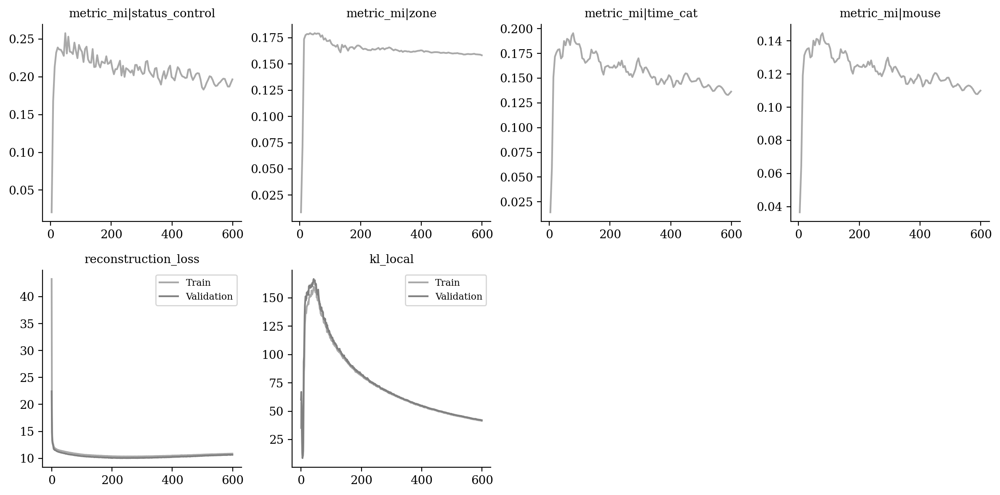

In [15]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|status_control", "metric_mi|zone", "metric_mi|time_cat", "metric_mi|mouse",
                 "reconstruction_loss", "kl_local"]
)

In [16]:
from tardis._disentanglementmanager import DisentanglementManager as DM

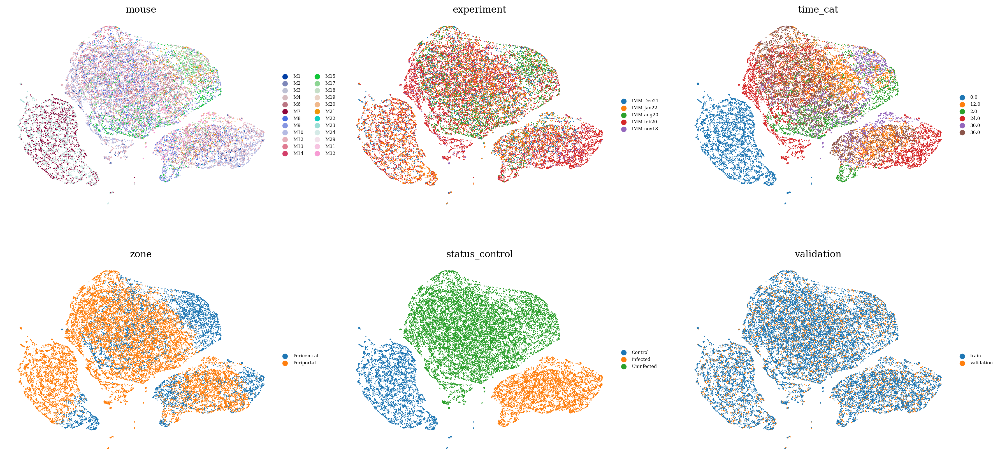

In [17]:
sublatent = DM.configurations.get_by_obs_key("status_control").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

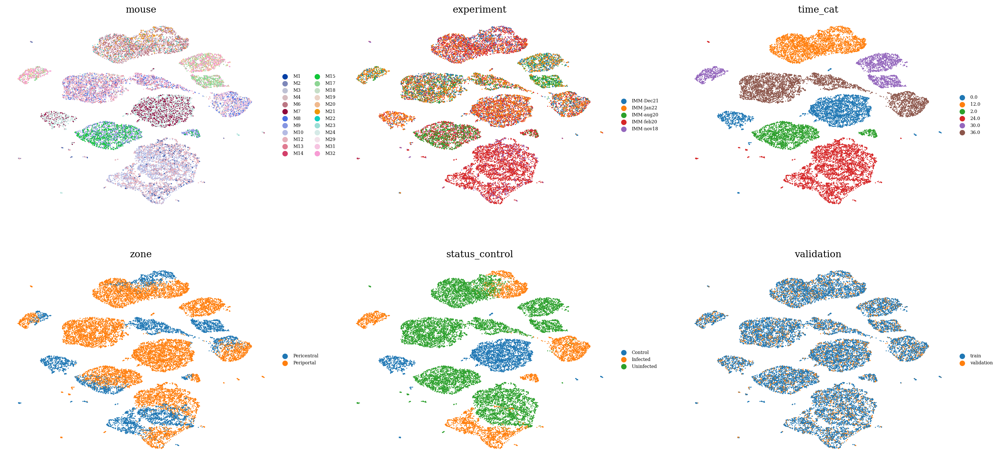

In [18]:
sublatent = DM.configurations.get_by_obs_key("time_cat").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

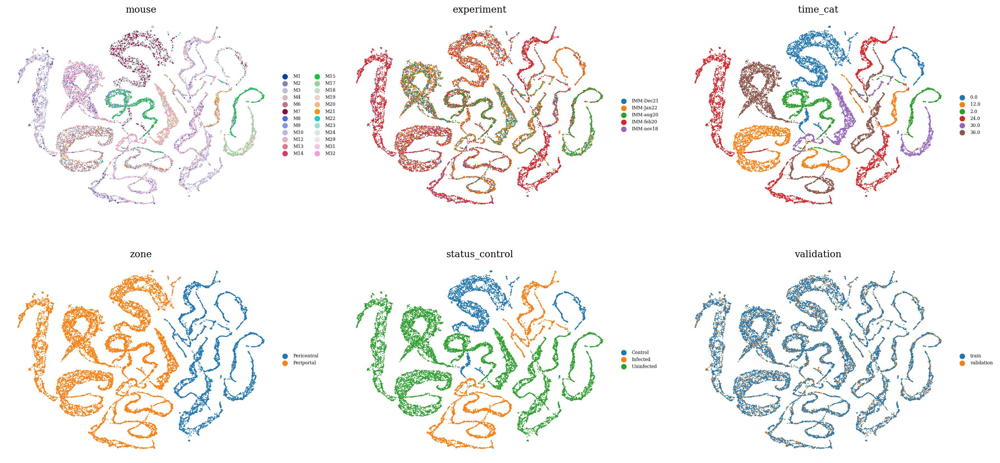

In [19]:
sublatent = DM.configurations.get_by_obs_key("zone").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

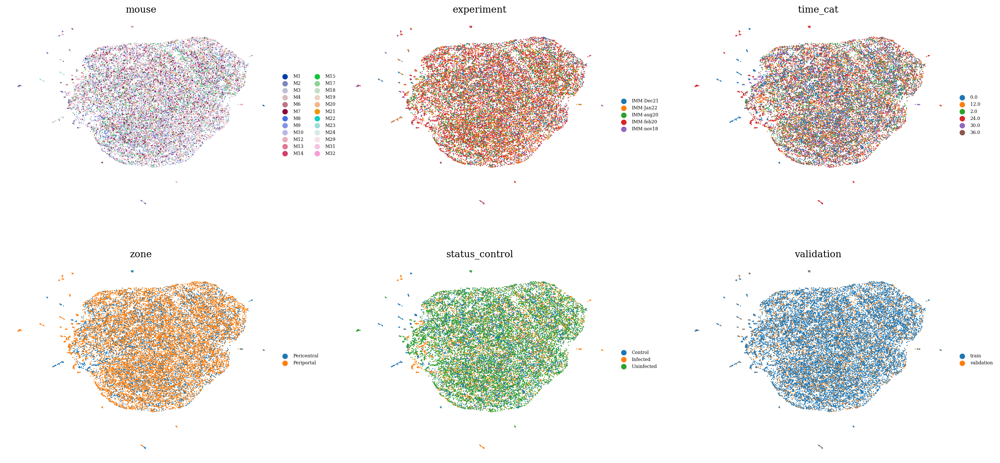

In [20]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

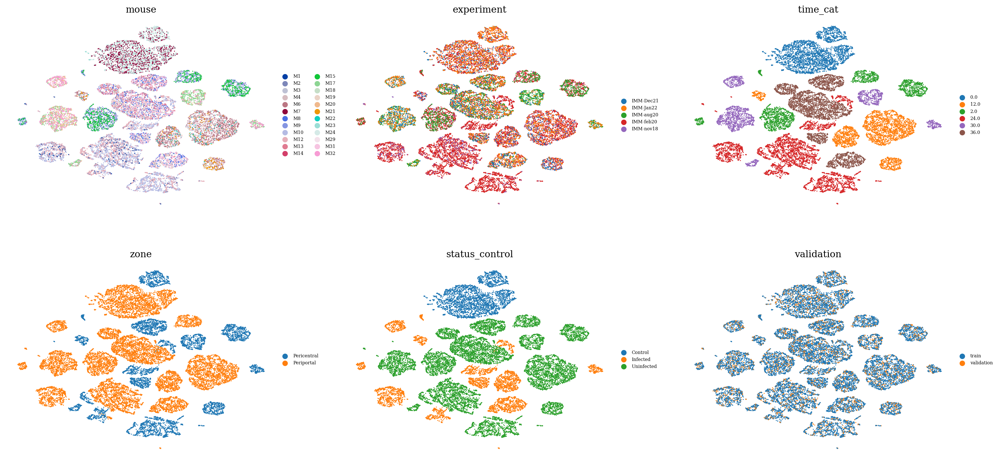

In [21]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [22]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data, factors=factors, variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.7884311169073163

In [23]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data[vae.validation_indices, :], factors=factors[vae.validation_indices, :], variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.7489397721618761

In [24]:
vae.get_MI_normalized_training("zone")

{('validation', 'reserved'): 0.9984138521021555,
 ('validation', 'unreserved'): 0.1844263604034357,
 ('train', 'reserved'): 0.9967394976163977,
 ('train', 'unreserved'): 0.14459084001474473}

In [25]:
vae.get_MI_normalized_training("status_control")

{('validation', 'reserved'): 0.9954088576094052,
 ('validation', 'unreserved'): 0.3103162168707726,
 ('train', 'reserved'): 0.9956169112172902,
 ('train', 'unreserved'): 0.26476446550247407}

In [26]:
vae.get_MI_normalized_training("time_cat")

{('validation', 'reserved'): 0.9573587546199143,
 ('validation', 'unreserved'): 0.25365870717619965,
 ('train', 'reserved'): 0.955282822744433,
 ('train', 'unreserved'): 0.18249194815512532}